In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install plotly

In [ ]:
!pip install wordcloud

In [ ]:
!pip install networkx

In [8]:
import pandas as pd
import numpy as np
import ast
from ast import literal_eval
import os
import zipfile
import plotly.offline as py
import plotly.graph_objs as go
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import networkx as nx
import re
import pickle



In [ ]:
# --- 1) Load Knowledge Graphs from Google Drive ---
with open('/content/drive/MyDrive/NLP/movie_kg.pkl', 'rb') as f:
    G_content = pickle.load(f) # load_clean_kg('/content/drive/MyDrive/NLP/movie_kg.pkl')
with open('/content/drive/MyDrive/NLP/user_movie_graph.pkl', 'rb') as f:
    G_cf = pickle.load(f)
with open('/content/drive/MyDrive/NLP/movie_kg_with_users.pkl', 'rb') as f:
    G_hybrid = pickle.load(f)

In [27]:
with open('/content/drive/MyDrive/NLP/user_movie_graph.pkl', 'rb') as f:
    G_cf = pickle.load(f)

In [28]:
G_content= load_clean_kg('/content/drive/MyDrive/NLP/movie_kg.pkl')

Removing 1 bad movie‐nodes: [nan] …
Cleaned KG: 258810 nodes, 916378 edges


In [ ]:
G_cf=load_clean_kg('/content/drive/MyDrive/NLP/user_movie_graph.pkl')

Cleaned KG: 9425 nodes, 99470 edges


## Datasets (Movies,Credits)

In [ ]:

zip_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/movies_metadata.csv.zip'

# Set the extraction directory to be the same as the zip file's directory
extraction_dir = os.path.dirname(zip_file_path)

# Extract the zip file into the same directory
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_dir)

print("File extracted to:", extraction_dir)

File extracted to: /content/drive/MyDrive/NLP/dataset/goodreads-books-100k


In [ ]:
import os
import zipfile

zip_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/credits.csv.zip'

# Set the extraction directory to be the same as the zip file's directory
extraction_dir = os.path.dirname(zip_file_path)

# Extract the zip file into the same directory
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_dir)

print("File extracted to:", extraction_dir)

File extracted to: /content/drive/MyDrive/NLP/dataset/goodreads-books-100k


### Movies Dataset


In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/movies_metadata.csv'

# Read the CSV file using pandas
movies = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
movies.head()


<ipython-input-3-586640fd1a1b>:5: DtypeWarning:

Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.



,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [ ]:
movies.tail()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
45461,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,...,NaN,0.0,90.0,"[{'iso_639_1': 'fa', 'name': 'فارسی'}]",Released,Rising and falling between a man and woman,Subdue,False,4.0,1.0
45462,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,...,2011-11-17,0.0,360.0,"[{'iso_639_1': 'tl', 'name': ''}]",Released,NaN,Century of Birthing,False,9.0,3.0
45463,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",...,2003-08-01,0.0,90.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,A deadly game of wits.,Betrayal,False,3.8,6.0
45464,False,NaN,0,[],NaN,227506,tt0008536,en,Satana likuyushchiy,"In a small town live two brothers, one a minis...",...,1917-10-21,0.0,87.0,[],Released,NaN,Satan Triumphant,False,0.0,0.0
45465,False,NaN,0,[],NaN,461257,tt6980792,en,Queerama,50 years after decriminalisation of homosexual...,...,2017-06-09,0.0,75.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Queerama,False,0.0,0.0


In [ ]:
print(f"Dataset Shape: {movies.shape}")

print("\n Dataset Info:")
movies.info()

print("\nMissing Values per Column:")
print(movies.isnull().sum())

print("\nColumn Names:")
print(list(movies.columns))

print("\nData Types:")
print(movies.dtypes)

print(f"\nNumber of Duplicate Rows: {movies.duplicated().sum()}")


Dataset Shape: (45466, 24)

 Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_dat

### Credits Dataset
cast: A stringified list of dictionaries consisting of cast names and the corresponding characters they played.

crew: A stringified list of dictionaries consisting of crew names and the function they performed.

id: The TMDB ID of movie.


In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/credits.csv'

# Read the CSV file using pandas
credits = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
credits.head()


,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [ ]:
print("Dataset Shape:")
print(credits.shape)

print("\nDataset Info:")
credits.info()

print("\nMissing Values per Column:")
print(credits.isnull().sum())

print("\nColumn Names:")
print(list(credits.columns))

print("\nData Types:")
print(credits.dtypes)

print("\nNumber of Duplicate Rows:")
print(credits.duplicated().sum())


Dataset Shape:
(45476, 3)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45476 entries, 0 to 45475
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   cast    45476 non-null  object
 1   crew    45476 non-null  object
 2   id      45476 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.0+ MB

Missing Values per Column:
cast    0
crew    0
id      0
dtype: int64

Column Names:
['cast', 'crew', 'id']

Data Types:
cast    object
crew    object
id       int64
dtype: object

Number of Duplicate Rows:
37


In [ ]:
# Function to safely parse stringified lists of dicts
def parse_list(val):
    try:
        return literal_eval(val) if isinstance(val, str) else []
    except Exception:
        return []

credits['cast'] = credits['cast'].apply(parse_list)
credits['crew'] = credits['crew'].apply(parse_list)
credits['cast_size'] = credits['cast'].apply(lambda x: len(x))
credits['crew_size'] = credits['crew'].apply(lambda x: len(x))
credits['cast'] = credits['cast'].apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
# Extract director names from crew
def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return np.nan
credits['director'] = credits['crew'].apply(get_director)
credits.head()


,cast,crew,id,cast_size,crew_size,director
0,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862,13,106,John Lasseter
1,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844,26,16,Joe Johnston
2,"[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602,7,4,Howard Deutch
3,"[Whitney Houston, Angela Bassett, Loretta Devi...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357,10,10,Forest Whitaker
4,"[Steve Martin, Diane Keaton, Martin Short, Kim...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862,12,7,Charles Shyer


### Merging Movies and Credit

In [ ]:
def convert_int(x):
    try:
        return int(x)
    except:
        return np.nan

In [ ]:
movies['id'] = movies['id'].apply(convert_int)

In [ ]:
movies[movies['id'].isnull()]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
19730,- Written by Ørnås,0.065736,/ff9qCepilowshEtG2GYWwzt2bs4.jpg,"[{'name': 'Carousel Productions', 'id': 11176}...","[{'iso_3166_1': 'CA', 'name': 'Canada'}, {'iso...",NaN,0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29503,Rune Balot goes to a casino connected to the ...,1.931659,/zV8bHuSL6WXoD6FWogP9j4x80bL.jpg,"[{'name': 'Aniplex', 'id': 2883}, {'name': 'Go...","[{'iso_3166_1': 'US', 'name': 'United States o...",NaN,0,68.0,"[{'iso_639_1': 'ja', 'name': '日本語'}]",Released,...,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35587,Avalanche Sharks tells the story of a bikini ...,2.185485,/zaSf5OG7V8X8gqFvly88zDdRm46.jpg,"[{'name': 'Odyssey Media', 'id': 17161}, {'nam...","[{'iso_3166_1': 'CA', 'name': 'Canada'}]",NaN,0,82.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,...,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
movies = movies.drop([19730, 29503, 35587])

In [ ]:
movies['id'] =movies['id'].astype('int')

In [ ]:
df = movies.merge(credits, on='id')
df.shape

(45538, 29)

In [ ]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,tagline,title,video,vote_average,vote_count,cast,crew,cast_size,crew_size,director
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,NaN,Toy Story,False,7.7,5415.0,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",13,106,John Lasseter
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",26,16,Joe Johnston
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",7,4,Howard Deutch
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[Whitney Houston, Angela Bassett, Loretta Devi...","[{'credit_id': '52fe44779251416c91011acb', 'de...",10,10,Forest Whitaker
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[Steve Martin, Diane Keaton, Martin Short, Kim...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",12,7,Charles Shyer


In [ ]:
df.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count', 'cast', 'crew', 'cast_size', 'crew_size',
       'director'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45538 entries, 0 to 45537
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45538 non-null  object 
 1   belongs_to_collection  4500 non-null   object 
 2   budget                 45538 non-null  object 
 3   genres                 45538 non-null  object 
 4   homepage               7792 non-null   object 
 5   id                     45538 non-null  int64  
 6   imdb_id                45521 non-null  object 
 7   original_language      45527 non-null  object 
 8   original_title         45538 non-null  object 
 9   overview               44584 non-null  object 
 10  popularity             45535 non-null  object 
 11  poster_path            45152 non-null  object 
 12  production_companies   45535 non-null  object 
 13  production_countries   45535 non-null  object 
 14  release_date           45451 non-null  object 
 15  re

There are a total of 45,466 movies with 24 features. Most of the features have very few NaN values (apart from homepage and tagline). We will attempt at cleaning this dataset to a form suitable for analysis in the next section.

In [ ]:
print("\nMissing Values per Column:")
df.isnull().sum()


Missing Values per Column:


,0
adult,0
belongs_to_collection,41038
budget,0
genres,0
homepage,37746
id,0
imdb_id,17
original_language,11
original_title,0
overview,954


In [ ]:
print("\nData Types:")
df.dtypes


Data Types:


,0
adult,object
belongs_to_collection,object
budget,object
genres,object
homepage,object
id,int64
imdb_id,object
original_language,object
original_title,object
overview,object


## Data Wrangling

The data that was originally obtained was in the form of a JSON File. This was converted manually into a CSV file to arrive at an input that could be loaded into a Pandas DataFrame effortlessly. In other words, the dataset we have in our hands is already relatively clean. We will however attempt at learning more about our features and performing appropriate wrangling steps to arrive at a form that is more suitable for analysis.

Let us start by removing the features that are not useful to us.

In [ ]:
df = df.drop(['imdb_id'], axis=1)

In [ ]:
df[df['original_title'] != df['title']][['title', 'original_title']].head()

,title,original_title
28,The City of Lost Children,La Cité des Enfants Perdus
29,Shanghai Triad,摇啊摇，摇到外婆桥
32,Wings of Courage,"Guillaumet, les ailes du courage"
57,The Postman,Il postino
58,The Confessional,Le confessionnal


The original title refers to the title of the movie in the native language in which the movie was shot. As such, I will prefer using the translated, Anglicized name in this analysis and hence, will drop the original titles altogether. We will be able to deduce if the movie is a foreign language film by looking at the original_language feature so no tangible information is lost in doing so.

In [ ]:
df = df.drop('original_title', axis=1)

In [ ]:
df[df['revenue'] == 0].shape

(38107, 27)

In [ ]:
df['revenue'] = df['revenue'].replace(0, np.nan) #Replacing 0 with Nulls to indicate absence of this revenue but will use rest

In [ ]:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce')
df['budget'] = df['budget'].replace(0, np.nan)
df[df['budget'].isnull()].shape

(36626, 27)

As we move forward trying to answer certain questions, we will have to construct several features suitable for that particular query. For now, we will construct two very important features:

year: The year in which the movie was released.

return: The ratio of revenue to budget.

A return value > 1 would indicate profit whereas a return value < 1 would indicate a loss.

In [ ]:
df['return'] = df['revenue'] / df['budget']
df[df['return'].isnull()].shape

(40145, 28)

In [ ]:
df['year'] = pd.to_datetime(df['release_date'], errors='coerce').apply(lambda x: str(x).split('-')[0] if x != np.nan else np.nan)

In [ ]:
df['adult'].value_counts() #Not very useful feature

,count
adult,
False,45529
True,9


In [ ]:
df = df.drop('adult', axis=1)

In [ ]:
df = df.drop('belongs_to_collection', axis=1)
df = df.drop('homepage',axis=1)
df = df.drop('poster_path', axis=1)

## Exploratatry Data Analysis and Visualizations

### EDA

In [ ]:
df.head()

,budget,genres,id,original_language,overview,popularity,production_companies,production_countries,release_date,revenue,...,video,vote_average,vote_count,cast,crew,cast_size,crew_size,director,return,year
0,30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,...,False,7.7,5415.0,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",13,106,John Lasseter,12.451801,1995
1,65000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",8844,en,When siblings Judy and Peter discover an encha...,17.015539,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,...,False,6.9,2413.0,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",26,16,Joe Johnston,4.043035,1995
2,NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",15602,en,A family wedding reignites the ancient feud be...,11.7129,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,NaN,...,False,6.5,92.0,"[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",7,4,Howard Deutch,NaN,1995
3,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",31357,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,...,False,6.1,34.0,"[Whitney Houston, Angela Bassett, Loretta Devi...","[{'credit_id': '52fe44779251416c91011acb', 'de...",10,10,Forest Whitaker,5.090760,1995
4,NaN,"[{'id': 35, 'name': 'Comedy'}]",11862,en,Just when George Banks has recovered from his ...,8.387519,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,...,False,5.7,173.0,"[Steve Martin, Diane Keaton, Martin Short, Kim...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",12,7,Charles Shyer,NaN,1995


In [ ]:
df.isnull().sum()

,0
budget,36626
genres,0
id,0
original_language,11
overview,954
popularity,3
production_companies,3
production_countries,3
release_date,87
revenue,38110


In [ ]:
df['genres'] = df['genres'].fillna('[]').apply(ast.literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df['genres'].head()

,genres
0,"[Animation, Comedy, Family]"
1,"[Adventure, Fantasy, Family]"
2,"[Romance, Comedy]"
3,"[Comedy, Drama, Romance]"
4,[Comedy]


In [ ]:
import ast
from ast import literal_eval

# Convert 'production_countries' from string to list of country names
df['production_countries'] = df['production_countries'].fillna('[]').apply(ast.literal_eval)
df['production_countries'] = df['production_countries'].apply(
    lambda x: [i['name'] for i in x] if isinstance(x, list) else []
)

def parse_companies(val):
    try:
        parsed = literal_eval(val) if isinstance(val, str) else val
        if isinstance(parsed, list) and all(isinstance(i, dict) for i in parsed):
            return ', '.join(i['name'] for i in parsed if 'name' in i)
        elif isinstance(parsed, list) and all(isinstance(i, str) for i in parsed):
            return ', '.join(parsed)
        else:
            return ''
    except Exception:
        return ''

df['production_companies'] = df['production_companies'].fillna('[]').apply(parse_companies)

# Display the first few rows
df['production_companies'].head()


,production_companies
0,Pixar Animation Studios
1,"TriStar Pictures, Teitler Film, Interscope Com..."
2,"Warner Bros., Lancaster Gate"
3,Twentieth Century Fox Film Corporation
4,"Sandollar Productions, Touchstone Pictures"


In [ ]:
df['production_countries'].head()

,production_countries
0,[United States of America]
1,[United States of America]
2,[United States of America]
3,[United States of America]
4,[United States of America]


In [ ]:
def clean_numeric(x):
    try:
        return float(x)
    except:
        return np.nan
df['popularity'] = df['popularity'].apply(clean_numeric).astype('float')
df['vote_count'] = df['vote_count'].apply(clean_numeric).astype('float')
df['vote_average'] = df['vote_average'].apply(clean_numeric).astype('float')

### Visualizations

#### Geographical Regions of movies

In [ ]:
s = df.apply(lambda x: pd.Series(x['production_countries']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'countries'

In [ ]:
con_df = df.drop('production_countries', axis=1).join(s)
con_df = pd.DataFrame(con_df['countries'].value_counts())
con_df['country'] = con_df.index
con_df.columns = ['num_movies', 'country']
con_df = con_df.reset_index().drop('countries', axis=1)
con_df.head(10)

,num_movies,country
0,21182,United States of America
1,4103,United Kingdom
2,3957,France
3,2266,Germany
4,2175,Italy
5,1766,Canada
6,1654,Japan
7,964,Spain
8,912,Russia
9,830,India


In [ ]:
#con_df = con_df[con_df['country'] != 'United States of America']

In [ ]:
data = [ dict(
        type = 'choropleth',
        locations = con_df['country'],
        locationmode = 'country names',
        z = con_df['num_movies'],
        text = con_df['country'],
        colorscale = [[0,'rgb(255, 255, 255)'],[1,'rgb(255, 0, 0)']],
        autocolorscale = False,
        reversescale = False,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar = dict(
            autotick = False,
            tickprefix = '',
            title = 'Production Countries'),
      ) ]

layout = dict(
    title = 'Production Countries for the MovieLens Movies (Apart from US)',
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'Mercator'
        )
    )
)

fig = dict( data=data, layout=layout )
py.iplot( fig, validate=False, filename='d3-world-map' )

 The United States is the most popular destination of production for movies given that our dataset largely consists of English movies. Europe is also an extremely popular location with the UK, France, Germany and Italy in the top 5. Japan and India are the most popular Asian countries when it comes to movie production.

#### Wordcloud to understand common words in overview and title

In [ ]:
df['title'] = df['title'].astype('str')
df['overview'] = df['overview'].astype('str')
title_corpus = ' '.join(df['title'])
overview_corpus = ' '.join(df['overview'])

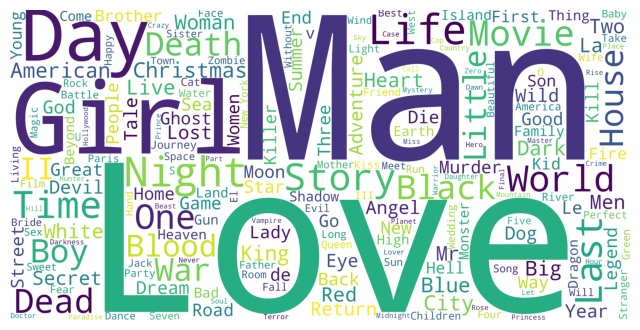

In [ ]:
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(title_corpus)
plt.figure(figsize=(8,6))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

The word Love is the most commonly used word in movie titles. Girl, Day and Man are also among the most commonly occuring words. I think this encapsulates the idea of the ubiquitious presence of romance in movies pretty well.

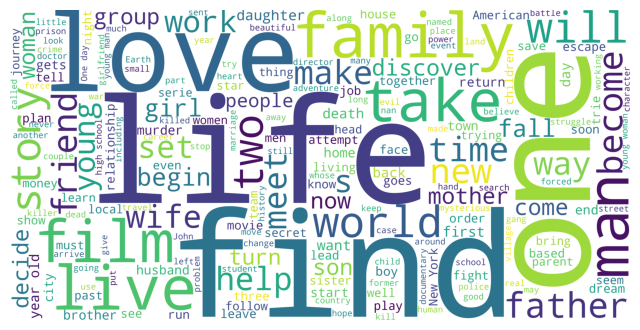

In [ ]:
overview_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(overview_corpus)
plt.figure(figsize=(8,6))
plt.imshow(overview_wordcloud)
plt.axis('off')
plt.show()

#### Production Companies

In [ ]:
# Split and explode the production companies
df_exploded = df.copy()
df_exploded['production_companies'] = df_exploded['production_companies'].str.split(', ')
df_exploded = df_exploded.explode('production_companies').dropna(subset=['production_companies'])

# Group by production company
company_stats = (
    df_exploded.groupby('production_companies')
    .agg(
        total_movies=('title', 'count'),
        average_revenue=('revenue', 'mean'),
        total_revenue=('revenue', 'sum')
    )
    .sort_values(by='total_movies', ascending=False)
    .reset_index()
)
# Remove rows where company name is empty or whitespace
company_stats = company_stats[company_stats['production_companies'].str.strip() != '']

# Format revenues in millions or billions for display
company_stats['average_revenue'] = (company_stats['average_revenue'] / 1e6).round(2)
company_stats['total_revenue'] = (company_stats['total_revenue'] / 1e9).round(2)

# Rename columns for clarity
company_stats = company_stats.rename(columns={
    'average_revenue': 'avg_revenue_million',
    'total_revenue': 'total_revenue_billion'
})


# Display top companies
company_stats.head(10)


,production_companies,total_movies,avg_revenue_million,total_revenue_billion
1,Warner Bros.,1250,129.38,63.53
2,Metro-Goldwyn-Mayer (MGM),1080,59.79,12.38
3,Paramount Pictures,1007,122.52,48.89
4,Twentieth Century Fox Film Corporation,836,139.85,47.69
5,Universal Pictures,830,119.35,55.26
6,Columbia Pictures Corporation,450,81.06,11.35
7,Canal+,442,46.73,6.21
8,Columbia Pictures,431,136.78,32.28
9,RKO Radio Pictures,301,56.12,1.12
10,United Artists,279,56.75,5.96


#### Popular language

In [ ]:
df['original_language'].drop_duplicates().shape[0]

90

In [ ]:
lang_df = pd.DataFrame(df['original_language'].value_counts())
lang_df['lang'] = lang_df.index
lang_df.columns = ['number', 'lang']
lang_df.head()

,number,lang
original_language,,
en,32316,en
fr,2443,fr
it,1529,it
ja,1356,ja
de,1083,de


<ipython-input-91-ae3fe9726519>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




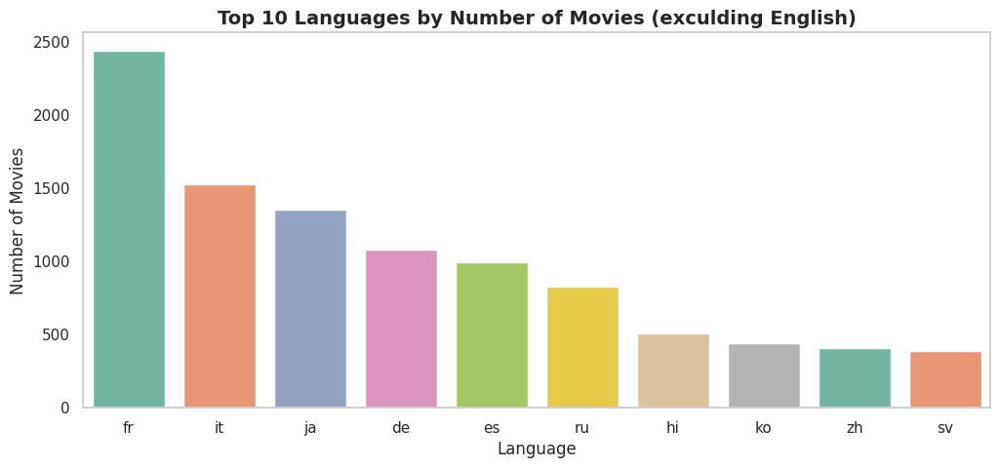

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(x='lang', y='number', data=lang_df.iloc[1:11],palette='Set2')
plt.title("Top 10 Languages by Number of Movies (exculding English)", fontsize=14, weight='bold')
plt.xlabel("Language")
plt.ylabel("Number of Movies")
plt.grid(False)
plt.show()

#### Most Popular Movie

In [ ]:
df[['title', 'popularity', 'year']].sort_values('popularity', ascending=False).head(10)

,title,popularity,year
30764,Minions,547.488298,2015
33421,Wonder Woman,294.337037,2017
42292,Beauty and the Beast,287.253654,2017
43713,Baby Driver,228.032744,2017
24501,Big Hero 6,213.849907,2014
26625,Deadpool,187.860492,2016
26627,Guardians of the Galaxy Vol. 2,185.330992,2017
14580,Avatar,185.070892,2009
24397,John Wick,183.870374,2014
23720,Gone Girl,154.801009,2014


Minions is the most popular movie by the TMDB Popularity Score. Wonder Woman and Beauty and the Beast, two extremely successful woman centric movies come in second and third respectively.

In [ ]:
df[['title', 'vote_count', 'year']].sort_values('vote_count', ascending=False).head(10)

,title,vote_count,year
15510,Inception,14075.0,2010
12501,The Dark Knight,12269.0,2008
14580,Avatar,12114.0,2009
17854,The Avengers,12000.0,2012
26625,Deadpool,11444.0,2016
22922,Interstellar,11187.0,2014
20088,Django Unchained,10297.0,2012
23798,Guardians of the Galaxy,10014.0,2014
2848,Fight Club,9678.0,1999
18280,The Hunger Games,9634.0,2012


Inception and The Dark Knight, two critically acclaimed and commercially successful Christopher Nolan movies figure at the top of our chart.

#### Average Voting

In [ ]:
df['vote_average'] = df['vote_average'].replace(0, np.nan)
df['vote_average'].describe()

,vote_average
count,42531.000000
mean,6.015053
std,1.255837
min,0.500000
25%,5.300000
50%,6.100000
75%,6.900000
max,10.000000


<ipython-input-100-1714fc251681>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='vote_average', ylabel='Density'>

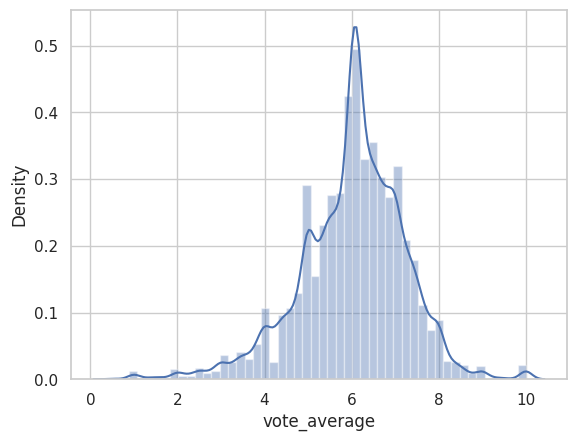

In [ ]:
sns.distplot(df['vote_average'].fillna(df['vote_average'].median()))

It appears that TMDB Users are extremely strict in their ratings. The mean rating is only a 5.6 on a scale of 10. Half the movies have a rating of less than or equal to 6

In [ ]:
df[df['vote_count'] > 2000][['title', 'vote_average', 'vote_count' ,'year']].sort_values('vote_average', ascending=False).head(10)

,title,vote_average,vote_count,year
835,The Godfather,8.5,6024.0,1972
314,The Shawshank Redemption,8.5,8358.0,1994
23718,Whiplash,8.3,4376.0,2014
522,Schindler's List,8.3,4436.0,1993
1155,One Flew Over the Cuckoo's Nest,8.3,3001.0,1975
292,Pulp Fiction,8.3,8670.0,1994
5489,Spirited Away,8.3,3968.0,2001
12501,The Dark Knight,8.3,12269.0,2008
2215,Life Is Beautiful,8.3,3643.0,1997
1181,The Godfather: Part II,8.3,3418.0,1974


Godfather is most popular with credible number of votes and rating

#### Movie Release Dates

In [ ]:
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
day_order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
def get_month(x):
    try:
        return month_order[int(str(x).split('-')[1]) - 1]
    except:
        return np.nan
def get_day(x):
    try:
        year, month, day = (int(i) for i in x.split('-'))
        answer = datetime.date(year, month, day).weekday()
        return day_order[answer]
    except:
        return np.nan
df['month'] = df['release_date'].apply(get_month)
df['day'] = df['release_date'].apply(get_day)

<ipython-input-113-cd9bf5e48649>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: title={'center': 'Number of Movies released in a particular month.'}, xlabel='month', ylabel='count'>

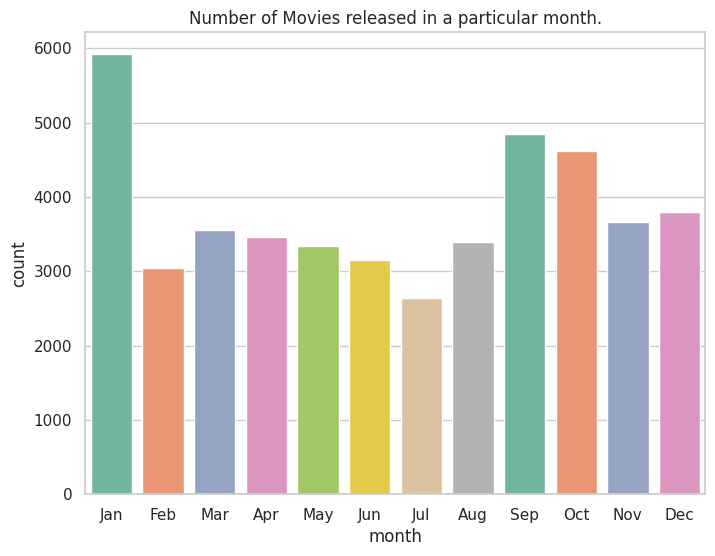

In [ ]:
plt.figure(figsize=(8,6))
plt.title("Number of Movies released in a particular month.")
sns.countplot(x='month', data=df, order=month_order,palette='Set2')

<ipython-input-112-0c5f0fa8a741>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: title={'center': 'Average Gross by the Month for Blockbuster Movies'}, xlabel='mon', ylabel='revenue'>

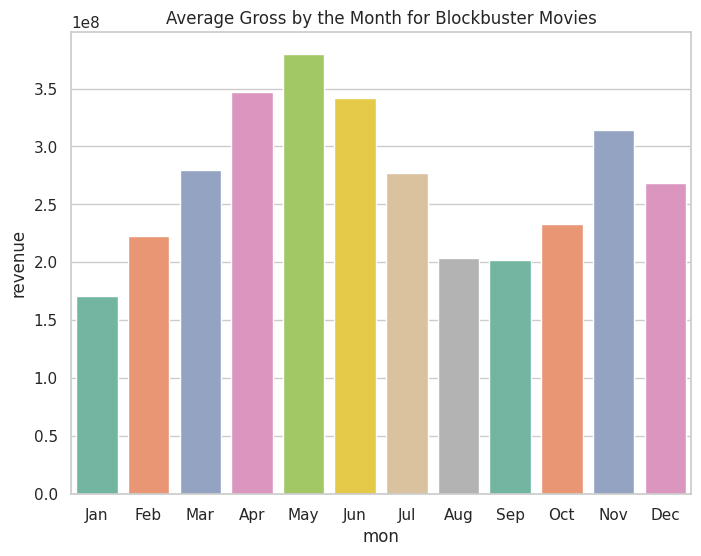

In [ ]:
month_mean = pd.DataFrame(df[df['revenue'] > 1e8].groupby('month')['revenue'].mean())
month_mean['mon'] = month_mean.index
plt.figure(figsize=(8,6))
plt.title("Average Gross by the Month for Blockbuster Movies")
sns.barplot(x='mon', y='revenue', data=month_mean, order=month_order,palette='Set2')

<ipython-input-111-a6b48b235d6f>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




(0.0, 12.0)

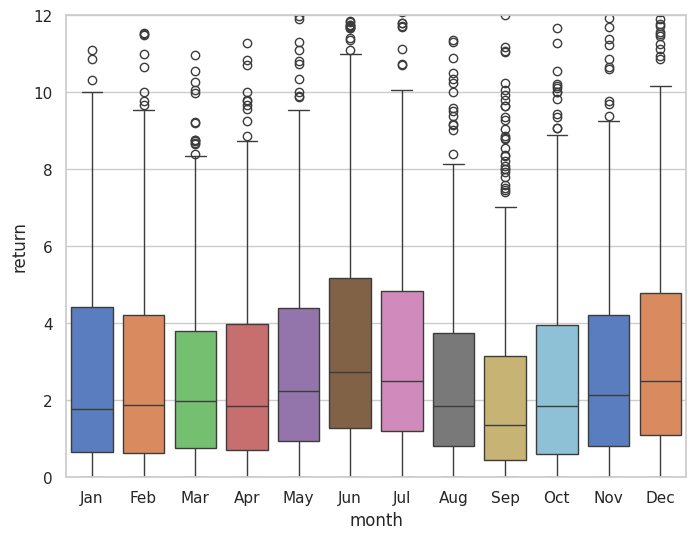

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(8, 6))
sns.boxplot(x='month', y='return', data=df[df['return'].notnull()], palette="muted", ax =ax, order=month_order)
ax.set_ylim([0, 12])



1. Most movies are released on new year
2. Highest profit is on movies released in summer vacations



#### Production Over the years

<Axes: xlabel='year'>

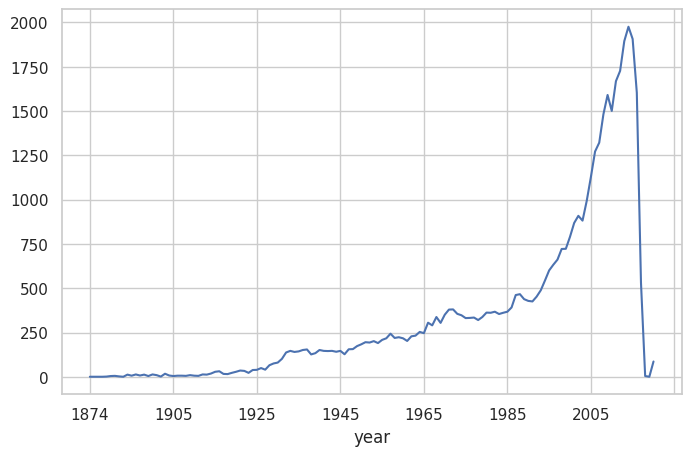

In [ ]:
year_count = df.groupby('year')['title'].count()
plt.figure(figsize=(8,5))
year_count.plot()

#### Most expensive movie of all times

In [ ]:
df[df['budget'].notnull()][['title', 'budget', 'revenue', 'return', 'year']].sort_values('budget', ascending=False).head(10)

,title,budget,revenue,return,year
17159,Pirates of the Caribbean: On Stranger Tides,380000000.0,1.045714e+09,2.751878,2011
11846,Pirates of the Caribbean: At World's End,300000000.0,9.610000e+08,3.203333,2007
26619,Avengers: Age of Ultron,280000000.0,1.405404e+09,5.019299,2015
11084,Superman Returns,270000000.0,3.910812e+08,1.448449,2006
16162,Tangled,260000000.0,5.917949e+08,2.276134,2010
18721,John Carter,260000000.0,2.841391e+08,1.092843,2012
44913,Transformers: The Last Knight,260000000.0,6.049421e+08,2.326701,2017
11799,Spider-Man 3,258000000.0,8.908716e+08,3.452991,2007
21216,The Lone Ranger,255000000.0,8.928991e+07,0.350157,2013
31136,Batman v Superman: Dawn of Justice,250000000.0,8.732602e+08,3.493041,2016


In [ ]:
gross_top = df[['title', 'budget', 'revenue', 'year']].sort_values('revenue', ascending=False).head(10)
pd.set_option('display.max_colwidth', 100)
gross_top.head(10)

,title,budget,revenue,year
14580,Avatar,237000000.0,2.787965e+09,2009
26616,Star Wars: The Force Awakens,245000000.0,2.068224e+09,2015
1643,Titanic,200000000.0,1.845034e+09,1997
17854,The Avengers,220000000.0,1.519558e+09,2012
25131,Jurassic World,150000000.0,1.513529e+09,2015
28892,Furious 7,190000000.0,1.506249e+09,2015
26619,Avengers: Age of Ultron,280000000.0,1.405404e+09,2015
17473,Harry Potter and the Deathly Hallows: Part 2,125000000.0,1.342000e+09,2011
22152,Frozen,150000000.0,1.274219e+09,2013
42292,Beauty and the Beast,160000000.0,1.262886e+09,2017


#### Analysis on genre

In [ ]:
df['genres'].head(10)

,genres
0,"[Animation, Comedy, Family]"
1,"[Adventure, Fantasy, Family]"
2,"[Romance, Comedy]"
3,"[Comedy, Drama, Romance]"
4,[Comedy]
5,"[Action, Crime, Drama, Thriller]"
6,"[Comedy, Romance]"
7,"[Action, Adventure, Drama, Family]"
8,"[Action, Adventure, Thriller]"
9,"[Adventure, Action, Thriller]"


In [ ]:
s = df.apply(lambda x: pd.Series(x['genres']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'genre'

In [ ]:
gen_df = df.drop('genres', axis=1).join(s)
gen_df['genre'].value_counts().shape[0]

20

In [ ]:
pop_gen = pd.DataFrame(gen_df['genre'].value_counts()).reset_index()
pop_gen.columns = ['genre', 'movies']
pop_gen.head(10)

,genre,movies
0,Drama,20312
1,Comedy,13196
2,Thriller,7640
3,Romance,6746
4,Action,6607
5,Horror,4679
6,Crime,4314
7,Documentary,3937
8,Adventure,3508
9,Science Fiction,3061


<ipython-input-183-cdb177588ef7>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




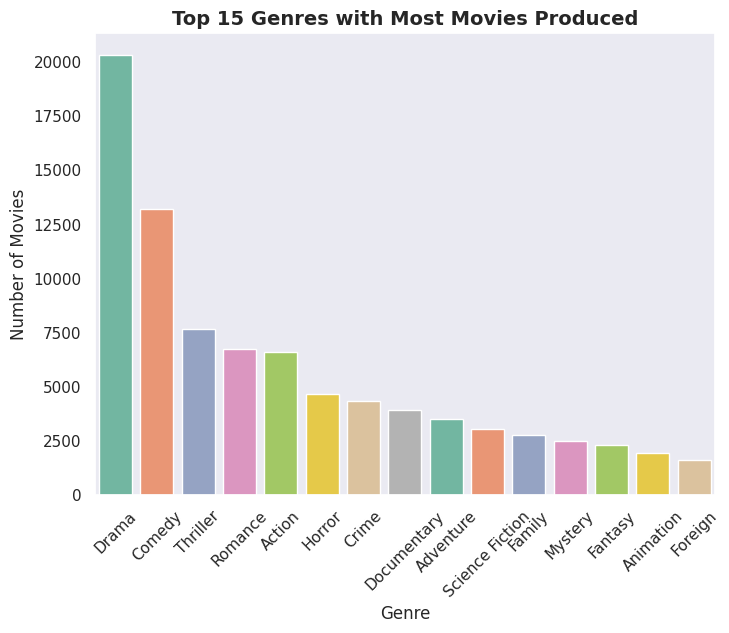

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x='genre', y='movies', data=pop_gen.head(15),palette='Set2')
plt.title("Top 15 Genres with Most Movies Produced", fontsize=14, weight='bold')
plt.xlabel("Genre")
plt.ylabel("Number of Movies")
plt.grid(False)
plt.xticks(rotation=45)
plt.show()

#### Actors with highest revenue

In [ ]:
s = df.apply(lambda x: pd.Series(x['cast']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'actor'
cast_df = df.drop('cast', axis=1).join(s)

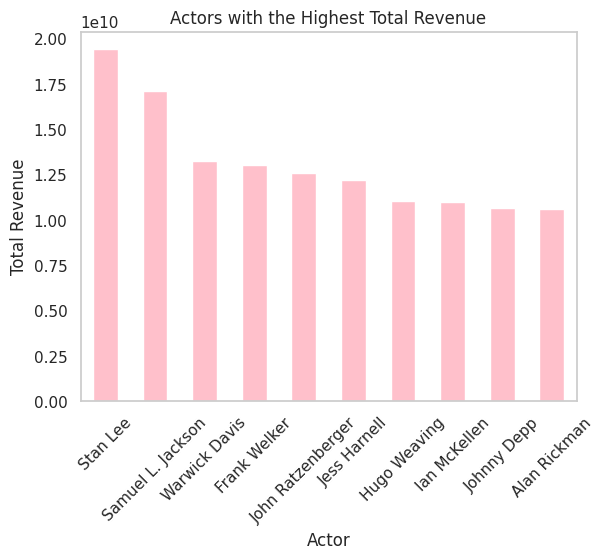

In [ ]:
sns.set_style('whitegrid')
plt.title('Actors with the Highest Total Revenue')
cast_df.groupby('actor')['revenue'].sum().sort_values(ascending=False).head(10).plot(kind='bar',color='pink')
plt.xlabel('Actor')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.grid(False)
plt.show()

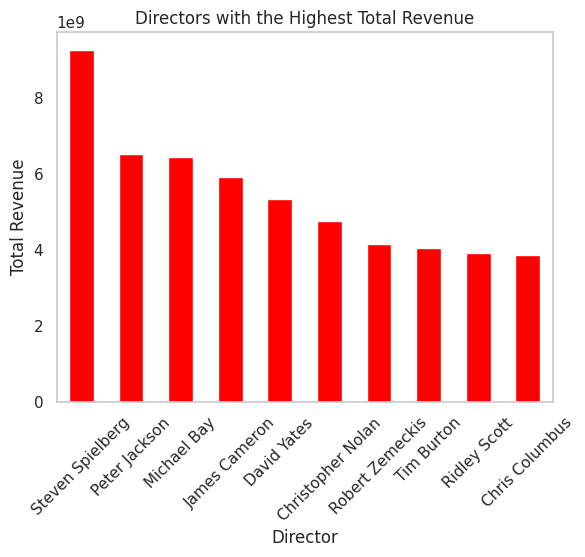

In [ ]:
plt.title('Directors with the Highest Total Revenue')
df.groupby('director')['revenue'].sum().sort_values(ascending=False).head(10).plot(kind='bar', colormap='autumn')
plt.xlabel('Director')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.grid(False)
plt.show()

#### Corelation matrix

In [ ]:
df['year'] = df['year'].replace('NaT', np.nan)
df['year'] = df['year'].apply(clean_numeric)

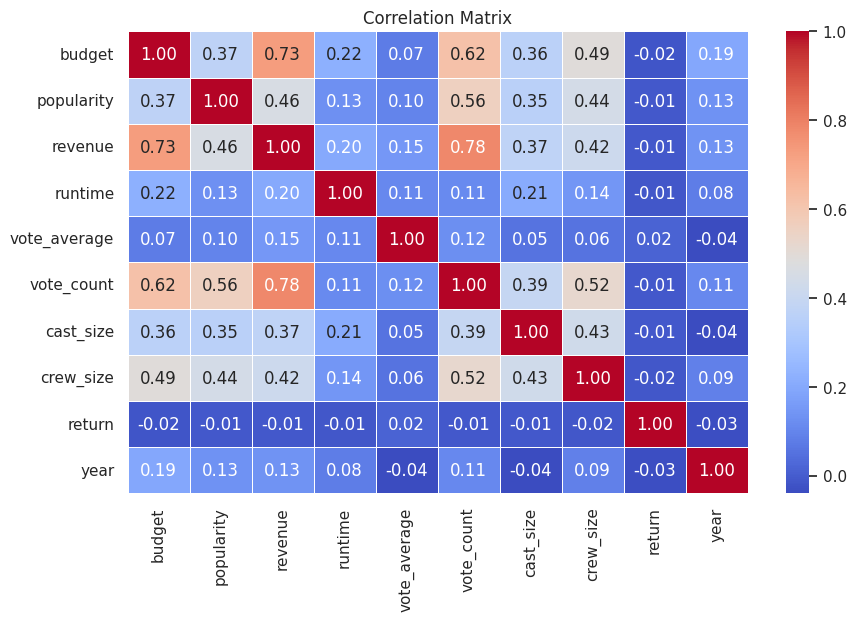

In [ ]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number', 'float64', 'int64'])
numeric_df=numeric_df.drop('id',axis=1)
numeric_df=numeric_df.drop('day',axis=1)
# Compute the correlation matrix
corr = numeric_df.corr()



# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix")
plt.grid(False)
plt.show()


## Saving final dataset (Metadata)

In [ ]:
# Define the path to save the DataFrame
save_path = '/content/drive/MyDrive/NLP/dataset/movies.csv'

# Save the DataFrame
df.to_csv(save_path, index=False)

print(f"DataFrame saved successfully at {save_path}")


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/NLP/dataset/movies.csv')
df.columns

Index(['budget', 'genres', 'id', 'original_language', 'overview', 'popularity',
       'production_companies', 'production_countries', 'release_date',
       'revenue', 'runtime', 'spoken_languages', 'status', 'tagline', 'title',
       'video', 'vote_average', 'vote_count', 'cast', 'crew', 'cast_size',
       'crew_size', 'director', 'return', 'year'],
      dtype='object')

**Entities to be selected for KG =>
id,title,orignal_language,year, director production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,return**


---


Here's why each entity is relevant:

1. id: Unique identifier for each movie, essential for linking nodes in the KG.

2. title: The name of the movie, used as a key attribute for user interaction and recommendations.

3. original_language: Useful for filtering recommendations based on user language preferences.

4. year: Helps in recommending movies from specific eras or based on temporal trends.

5. director: A critical entity for linking movies directed by the same person, which can influence recommendations.

6. production_companies: Allows grouping movies produced by the same company, often associated with specific genres or styles.

7. popularity: Useful for recommending trending or widely liked movies.

8. production_countries: Enables recommendations based on regional preferences or diversity.

9. runtime: Can be used to recommend movies of preferred lengths (e.g., short films vs. long epics).

10. vote_average: Indicators of movie quality and popularity, crucial for ranking recommendations.

11. cast: Key entity to link movies featuring the same actors, which can drive user interest.

12. vote_count: Indicators of movie quality and popularity, crucial for ranking recommendations.
13. genre
14. overview



In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame with selected columns
selected_columns = ['id', 'title', 'original_language', 'year', 'director','genres',
                    'production_companies', 'popularity', 'production_countries',
                    'runtime', 'vote_average', 'vote_count', 'cast','overview']
df[selected_columns].to_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv', index=False)


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv')
df.isnull().sum()

,0
id,0
title,3
original_language,11
year,0
director,887
genres,0
production_companies,11899
popularity,3
production_countries,0
runtime,260


In [ ]:
# Ensure the changes are made to the original DataFrame
df = df.dropna(subset=['title']).copy()  # Drop rows with null titles and create a copy

# Fill nulls with mean for numerical columns
df['runtime'] = df['runtime'].fillna(df['runtime'].mean())
df['vote_average'] = df['vote_average'].fillna(df['vote_average'].mean())  # Corrected column name
df['vote_count'] = df['vote_count'].fillna(df['vote_count'].mean())

# Fill nulls with mode for categorical columns
df['original_language'] = df['original_language'].fillna(df['original_language'].mode().iloc[0])  # Use iloc for mode

# Create a new column to indicate missing values
df['director'] = df['director'].fillna('Unknown')
df['overview']=df['overview'].fillna('Unavialable')
# Fill production_companies with a placeholder if needed
df['production_companies'] = df['production_companies'].fillna('Unknown')

# Save changes to the original dataset (if it's a CSV file)
df.head(10)


,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
0,862,Toy Story,en,1995,John Lasseter,"['Animation', 'Comedy', 'Family']",Pixar Animation Studios,21.946943,['United States of America'],81.0,7.7,5415.0,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...","Led by Woody, Andy's toys live happily in his ..."
1,8844,Jumanji,en,1995,Joe Johnston,"['Adventure', 'Fantasy', 'Family']","TriStar Pictures, Teitler Film, Interscope Com...",17.015539,['United States of America'],104.0,6.9,2413.0,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",When siblings Judy and Peter discover an encha...
2,15602,Grumpier Old Men,en,1995,Howard Deutch,"['Romance', 'Comedy']","Warner Bros., Lancaster Gate",11.712900,['United States of America'],101.0,6.5,92.0,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret...",A family wedding reignites the ancient feud be...
3,31357,Waiting to Exhale,en,1995,Forest Whitaker,"['Comedy', 'Drama', 'Romance']",Twentieth Century Fox Film Corporation,3.859495,['United States of America'],127.0,6.1,34.0,"['Whitney Houston', 'Angela Bassett', 'Loretta...","Cheated on, mistreated and stepped on, the wom..."
4,11862,Father of the Bride Part II,en,1995,Charles Shyer,['Comedy'],"Sandollar Productions, Touchstone Pictures",8.387519,['United States of America'],106.0,5.7,173.0,"['Steve Martin', 'Diane Keaton', 'Martin Short...",Just when George Banks has recovered from his ...
5,949,Heat,en,1995,Michael Mann,"['Action', 'Crime', 'Drama', 'Thriller']","Regency Enterprises, Forward Pass, Warner Bros.",17.924927,['United States of America'],170.0,7.7,1886.0,"['Al Pacino', 'Robert De Niro', 'Val Kilmer', ...","Obsessive master thief, Neil McCauley leads a ..."
6,11860,Sabrina,en,1995,Sydney Pollack,"['Comedy', 'Romance']","Paramount Pictures, Scott Rudin Productions, M...",6.677277,"['Germany', 'United States of America']",127.0,6.2,141.0,"['Harrison Ford', 'Julia Ormond', 'Greg Kinnea...",An ugly duckling having undergone a remarkable...
7,45325,Tom and Huck,en,1995,Peter Hewitt,"['Action', 'Adventure', 'Drama', 'Family']",Walt Disney Pictures,2.561161,['United States of America'],97.0,5.4,45.0,"['Jonathan Taylor Thomas', 'Brad Renfro', 'Rac...","A mischievous young boy, Tom Sawyer, witnesses..."
8,9091,Sudden Death,en,1995,Peter Hyams,"['Action', 'Adventure', 'Thriller']","Universal Pictures, Imperial Entertainment, Si...",5.231580,['United States of America'],106.0,5.5,174.0,"['Jean-Claude Van Damme', 'Powers Boothe', 'Do...",International action superstar Jean Claude Van...
9,710,GoldenEye,en,1995,Martin Campbell,"['Adventure', 'Action', 'Thriller']","United Artists, Eon Productions",14.686036,"['United Kingdom', 'United States of America']",130.0,6.6,1194.0,"['Pierce Brosnan', 'Sean Bean', 'Izabella Scor...",James Bond must unmask the mysterious head of ...


In [ ]:
df.isnull().sum()

,0
id,0
title,0
original_language,0
year,0
director,0
genres,0
production_companies,0
popularity,0
production_countries,0
runtime,0


In [ ]:
df.to_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv', index=False)

## Knowldege Graph sample Displays

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv')
df.head(10)

,id,title,original_language,year,director,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast
0,862,Toy Story,en,1995,John Lasseter,Pixar Animation Studios,21.946943,['United States of America'],81.0,7.7,5415.0,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim..."
1,8844,Jumanji,en,1995,Joe Johnston,"TriStar Pictures, Teitler Film, Interscope Com...",17.015539,['United States of America'],104.0,6.9,2413.0,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D..."
2,15602,Grumpier Old Men,en,1995,Howard Deutch,"Warner Bros., Lancaster Gate",11.712900,['United States of America'],101.0,6.5,92.0,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret..."
3,31357,Waiting to Exhale,en,1995,Forest Whitaker,Twentieth Century Fox Film Corporation,3.859495,['United States of America'],127.0,6.1,34.0,"['Whitney Houston', 'Angela Bassett', 'Loretta..."
4,11862,Father of the Bride Part II,en,1995,Charles Shyer,"Sandollar Productions, Touchstone Pictures",8.387519,['United States of America'],106.0,5.7,173.0,"['Steve Martin', 'Diane Keaton', 'Martin Short..."
5,949,Heat,en,1995,Michael Mann,"Regency Enterprises, Forward Pass, Warner Bros.",17.924927,['United States of America'],170.0,7.7,1886.0,"['Al Pacino', 'Robert De Niro', 'Val Kilmer', ..."
6,11860,Sabrina,en,1995,Sydney Pollack,"Paramount Pictures, Scott Rudin Productions, M...",6.677277,"['Germany', 'United States of America']",127.0,6.2,141.0,"['Harrison Ford', 'Julia Ormond', 'Greg Kinnea..."
7,45325,Tom and Huck,en,1995,Peter Hewitt,Walt Disney Pictures,2.561161,['United States of America'],97.0,5.4,45.0,"['Jonathan Taylor Thomas', 'Brad Renfro', 'Rac..."
8,9091,Sudden Death,en,1995,Peter Hyams,"Universal Pictures, Imperial Entertainment, Si...",5.231580,['United States of America'],106.0,5.5,174.0,"['Jean-Claude Van Damme', 'Powers Boothe', 'Do..."
9,710,GoldenEye,en,1995,Martin Campbell,"United Artists, Eon Productions",14.686036,"['United Kingdom', 'United States of America']",130.0,6.6,1194.0,"['Pierce Brosnan', 'Sean Bean', 'Izabella Scor..."


In [ ]:

class KnowledgeGraph():
    """
    Class to contain all the knowledge graph-related code.
    """

    def __init__(self, csv_file):
        self.movie_data = self.load_movie_data(csv_file)
        if self.movie_data is None:
            print("Error: Movie data file not found!")
            exit()

    def load_movie_data(self, file_path):
        """
        Load movie data from a CSV file.
        """
        try:
            return pd.read_csv(file_path, encoding="utf8")
        except FileNotFoundError:
            print(f"Error: {file_path} not found.")
            return None

    def sanitize_filename(self, name):
        """Sanitize movie name to use as filename"""
        return re.sub(r'[\\/*?:"<>|]', "", name.replace(" ", "_"))

    def create_movie_kg(self, movie_title):
        """
        Method to create and display detailed KG of a single movie.
        """
        G = nx.Graph()
        color_palette = {
            'Movie': '#FF5733',
            'Director': '#3498DB',
            'Actor': '#2ECC71',
            'Production Company': '#F39C12',
            'Year': '#9B59B6',
            'Language': '#1ABC9C',
            'Country': '#34495E',
            'Numeric': '#7D3C98',
        }
        color_map = []
        node_sizes = {}
        found = False

        for _, row in self.movie_data.iterrows():
            if row['title'].strip().lower() == movie_title.strip().lower():
                found = True
                movie_node = row['title']
                G.add_node(movie_node, label="Movie", **row.to_dict())
                color_map.append(color_palette['Movie'])
                node_sizes[movie_node] = 5000

                # Director
                G.add_node(row['director'], label="Director")
                G.add_edge(movie_node, row['director'], relationship="DIRECTED_BY")
                color_map.append(color_palette['Director'])
                node_sizes[row['director']] = 3000

                # Cast
                actors = [actor.strip().strip("'\"") for actor in str(row['cast']).strip("[]").split(',')]
                for actor in actors:
                    if actor:
                        G.add_node(actor, label="Actor")
                        G.add_edge(movie_node, actor, relationship="ACTED_IN")
                        color_map.append(color_palette['Actor'])
                        node_sizes[actor] = 2000

                # Production Companies
                companies = [company.strip().strip("'\"") for company in str(row['production_companies']).strip("[]").split(',')]
                for company in companies:
                    if company:
                        G.add_node(company, label="Production Company")
                        G.add_edge(movie_node, company, relationship="PRODUCED_BY")
                        color_map.append(color_palette['Production Company'])
                        node_sizes[company] = 1500

                # Production Countries
                countries = [country.strip().strip("'\"") for country in str(row['production_countries']).strip("[]").split(',')]
                for country in countries:
                    if country:
                        G.add_node(country, label="Country")
                        G.add_edge(movie_node, country, relationship="PRODUCED_IN")
                        color_map.append(color_palette['Country'])
                        node_sizes[country] = 1300

                # Year
                year_str = str(row['year'])
                G.add_node(year_str, label="Year")
                G.add_edge(movie_node, year_str, relationship="RELEASED_IN")
                color_map.append(color_palette['Year'])
                node_sizes[year_str] = 1000

                # Language
                lang = row['original_language']
                G.add_node(lang, label="Language")
                G.add_edge(movie_node, lang, relationship="HAS_LANGUAGE")
                color_map.append(color_palette['Language'])
                node_sizes[lang] = 1000

                # Numeric attributes
                numerics = {
                    "runtime": row['runtime'],
                    "rating": row['vote_average'],
                }
                for key, val in numerics.items():
                    val_node = f"{key.title()}: {val}"
                    G.add_node(val_node, label="Numeric")
                    G.add_edge(movie_node, val_node, relationship=f"HAS_{key.upper()}")
                    color_map.append(color_palette['Numeric'])
                    node_sizes[val_node] = 900

                break

        if not found:
            print("Movie not found in CSV!")
            return

        # Draw the graph
        plt.figure(figsize=(14, 14))
        pos = nx.spring_layout(G, k=0.45, iterations=60)
        nx.draw(G, pos, with_labels=True, node_color=color_map,
                node_size=[node_sizes.get(node, 500) for node in G.nodes()],
                font_size=9, font_weight='bold', edgecolors='gray')
        edge_labels = nx.get_edge_attributes(G, 'relationship')
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7, font_color='red')

        plt.title(f"Knowledge Graph for Movie: {movie_title}", fontsize=16)
        output_dir = '/content/drive/MyDrive/NLP/graphs'
        os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

        file_name = self.sanitize_filename(movie_title)
        file_path = os.path.join(output_dir, f"{file_name}_knowledge_graph.png")

        plt.savefig(file_path)
        print(f"Graph saved at: {file_path}")

        plt.show()
    def create_movie_relation_kg(self, movie1, movie2):
      """
      Creates a Knowledge Graph showing how two movies are related.
      """
      G = nx.Graph()
      color_palette = {
          'Movie': '#FF5733',
          'Shared': '#F1C40F',
          'Unique': '#3498DB'
      }
      color_map = []
      node_sizes = {}

      def get_movie_row(title):
          for _, row in self.movie_data.iterrows():
              if row['title'].strip().lower() == title.strip().lower():
                  return row
          return None

      row1 = get_movie_row(movie1)
      row2 = get_movie_row(movie2)

      if row1 is None or row2 is None:
          print("One or both movies not found in the dataset.")
          return

      # Add movie nodes
      if movie1 not in G:
        G.add_node(movie1, label="Movie")
        color_map.append(color_palette['Movie'])
        node_sizes[movie1] = 5000

      if movie2 not in G:
        G.add_node(movie2, label="Movie")
        color_map.append(color_palette['Movie'])
        node_sizes[movie2] = 5000


      def add_entity_nodes(G, movie_node, row, attr_name, label, is_list=False):
        entities = row[attr_name]
        if is_list:
            entities = [e.strip().strip("'\"") for e in str(entities).strip("[]").split(',')]
        else:
            entities = [str(entities)]

        for entity in entities:
            if not entity:
                continue
            label_type = 'Shared' if entity in shared_entities else 'Unique'
            if entity not in G:
                G.add_node(entity, label=label)
                color_map.append(color_palette[label_type])
                node_sizes[entity] = 2000 if label_type == 'Shared' else 1200
            G.add_edge(movie_node, entity, relationship=f"HAS_{label.upper()}")


      # Compare key fields
      shared_entities = set()

      def collect_shared(attr_name, is_list=False):
          a = row1[attr_name]
          b = row2[attr_name]
          a_items = [i.strip().strip("'\"") for i in str(a).strip("[]").split(',')] if is_list else [str(a)]
          b_items = [i.strip().strip("'\"") for i in str(b).strip("[]").split(',')] if is_list else [str(b)]
          return set(a_items).intersection(set(b_items))

      shared_entities.update(collect_shared('cast', is_list=True))
      shared_entities.update(collect_shared('director'))
      shared_entities.update(collect_shared('production_companies', is_list=True))
      shared_entities.update(collect_shared('production_countries', is_list=True))
      shared_entities.update(collect_shared('original_language'))
      shared_entities.update(collect_shared('year'))

      # Add entity nodes for both movies
      add_entity_nodes(G, movie1, row1, 'cast', 'Actor', is_list=True)
      add_entity_nodes(G, movie1, row1, 'director', 'Director')
      add_entity_nodes(G, movie1, row1, 'production_companies', 'Production Company', is_list=True)
      add_entity_nodes(G, movie1, row1, 'production_countries', 'Country', is_list=True)
      add_entity_nodes(G, movie1, row1, 'original_language', 'Language')
      add_entity_nodes(G, movie1, row1, 'year', 'Year')

      add_entity_nodes(G, movie2, row2, 'cast', 'Actor', is_list=True)
      add_entity_nodes(G, movie2, row2, 'director', 'Director')
      add_entity_nodes(G, movie2, row2, 'production_companies', 'Production Company', is_list=True)
      add_entity_nodes(G, movie2, row2, 'production_countries', 'Country', is_list=True)
      add_entity_nodes(G, movie2, row2, 'original_language', 'Language')
      add_entity_nodes(G, movie2, row2, 'year', 'Year')

      # Draw graph
      plt.figure(figsize=(15, 15))
      pos = nx.spring_layout(G, k=0.4, iterations=60)
      nx.draw(G, pos, with_labels=True, node_color=color_map,
              node_size=[node_sizes.get(node, 800) for node in G.nodes()],
              font_size=9, font_weight='bold', edgecolors='gray')
      edge_labels = nx.get_edge_attributes(G, 'relationship')
      nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7, font_color='red')

      plt.title(f"KG: How '{movie1}' and '{movie2}' are Related", fontsize=16)

      output_dir = '/content/drive/MyDrive/NLP/graphs'
      os.makedirs(output_dir, exist_ok=True)
      fname = f"{self.sanitize_filename(movie1)}_{self.sanitize_filename(movie2)}_relation_graph.png"
      plt.savefig(os.path.join(output_dir, fname))
      print(f"Relation graph saved at: {os.path.join(output_dir, fname)}")
      plt.show()



Enter movie name: Toy Story
Graph saved at: /content/drive/MyDrive/NLP/graphs/Toy_Story_knowledge_graph.png


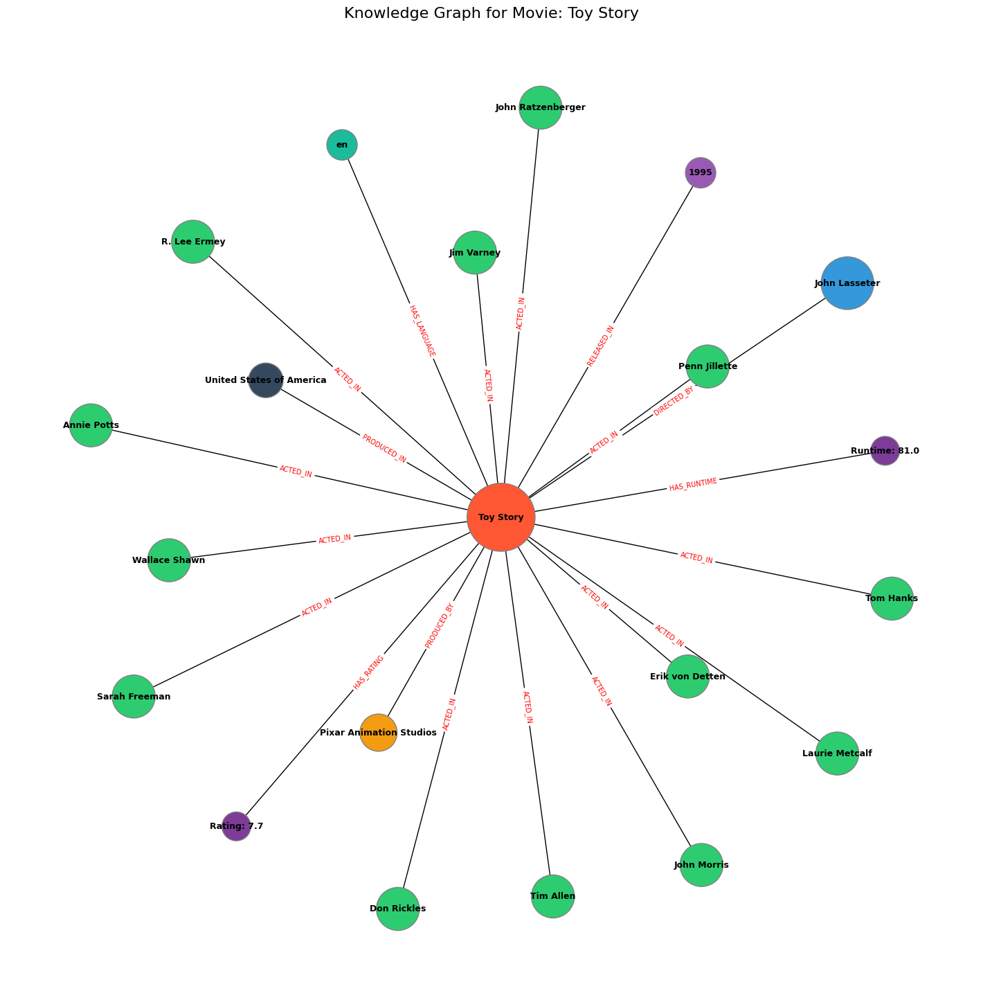

In [ ]:
if __name__ == "__main__":
    csv_file = '/content/drive/MyDrive/NLP/dataset/kg_entities.csv'
    kg = KnowledgeGraph(csv_file)

    movie_name = input("Enter movie name: ")
    kg.create_movie_kg(movie_name)

Enter first movie name: Cinderella
Enter second movie name: Batman Begins
Relation graph saved at: /content/drive/MyDrive/NLP/graphs/Cinderella_Batman_Begins_relation_graph.png


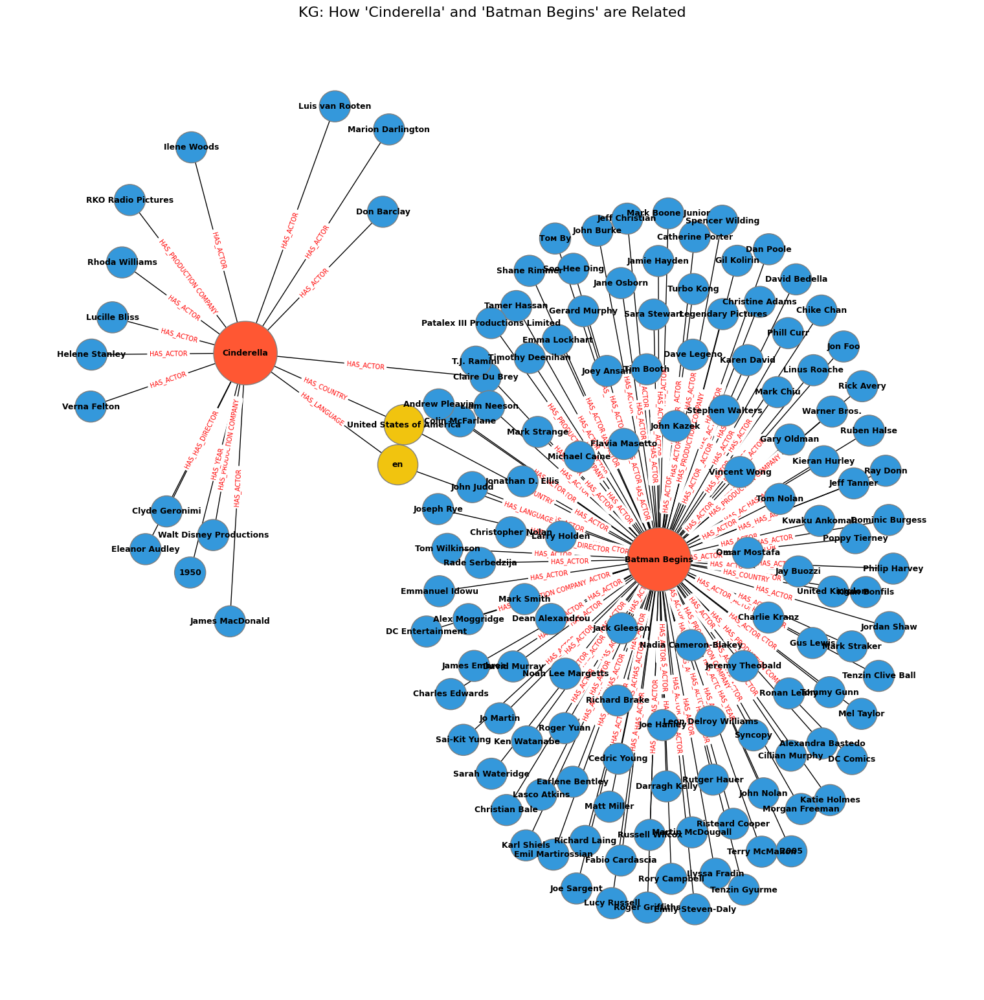

In [ ]:

if __name__ == "__main__":
    csv_file = '/content/drive/MyDrive/NLP/dataset/kg_entities.csv'
    kg = KnowledgeGraph(csv_file)

    movie1 = input("Enter first movie name: ")
    movie2 = input("Enter second movie name: ")
    kg.create_movie_relation_kg(movie1, movie2)


Enter first movie name: Iron Man
Enter second movie name: Iron Man 3
Relation graph saved at: /content/drive/MyDrive/NLP/graphs/Iron_Man_Iron_Man_3_relation_graph.png


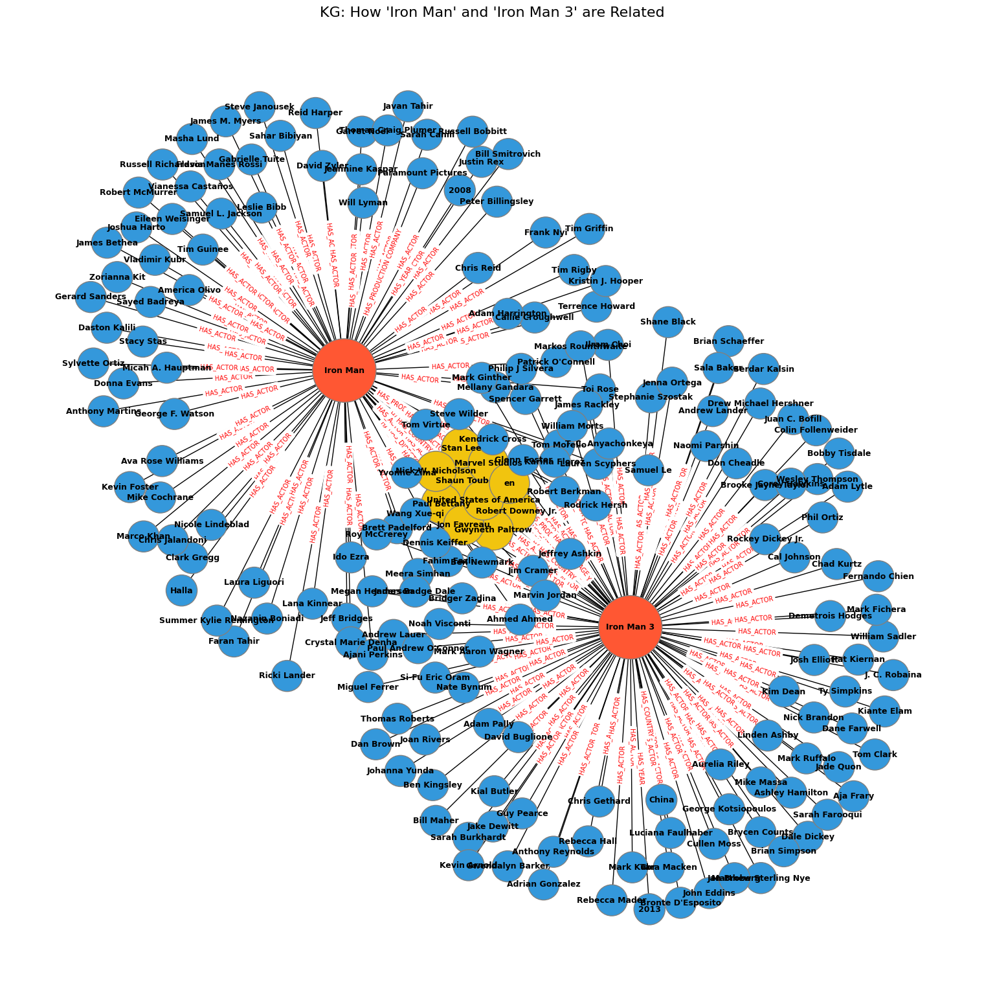

In [ ]:
if __name__ == "__main__":
    csv_file = '/content/drive/MyDrive/NLP/dataset/kg_entities.csv'
    kg = KnowledgeGraph(csv_file)

    movie1 = input("Enter first movie name: ")
    movie2 = input("Enter second movie name: ")
    kg.create_movie_relation_kg(movie1, movie2)

In [ ]:
sorted_titles = df.sort_values(by=['vote_count'], ascending=False)['title'].tolist()

print("Available titles (sorted by rating):")
print(sorted_titles)

Available titles (sorted by rating):
['Inception', 'The Dark Knight', 'Avatar', 'The Avengers', 'Deadpool', 'Interstellar', 'Django Unchained', 'Guardians of the Galaxy', 'Fight Club', 'The Hunger Games', 'Mad Max: Fury Road', 'The Dark Knight Rises', 'The Matrix', 'Iron Man', 'Iron Man 3', 'The Lord of the Rings: The Fellowship of the Ring', 'Jurassic World', 'Pulp Fiction', 'The Hobbit: An Unexpected Journey', 'The Shawshank Redemption', 'The Lord of the Rings: The Return of the King', 'Forrest Gump', 'Star Wars: The Force Awakens', 'Titanic', 'Skyfall', 'Suicide Squad', 'The Lord of the Rings: The Two Towers', 'Batman Begins', 'Captain America: Civil War', 'The Martian', 'Pirates of the Caribbean: The Curse of the Black Pearl', 'Batman v Superman: Dawn of Justice', "Harry Potter and the Philosopher's Stone", 'Captain America: The First Avenger', 'Up', 'Iron Man 2', 'Avengers: Age of Ultron', 'Star Wars', 'The Wolf of Wall Street', 'Inside Out', 'The Amazing Spider-Man', 'Thor', 'The

# Content-based filtering using KG

### Building and Saving KG in drive for content-based (Contains movie metadata)

In [ ]:
import pandas as pd
import networkx as nx
import pickle
import ast

def build_and_save_kg(csv_file, save_path='/content/drive/MyDrive/NLP/movie_kg.pkl'):
    df = pd.read_csv(csv_file)
    G  = nx.Graph()

    color_palette = {
        'Movie':               '#FF5733',
        'Director':            '#3498DB',
        'Actor':               '#2ECC71',
        'Production Company':  '#F39C12',
        'Year':                '#9B59B6',
        'Language':            '#E74C3C',
        'Numeric':             '#F1C40F',
        'Genre':               '#1ABC9C',   # <-- added this
        'Country':             '#95A5A6'
    }

    for _, row in df.iterrows():
        movie_node = row['title']
        G.add_node(movie_node, label='Movie', **row.to_dict())

        # 1) Genres
        if pd.notna(row.get('genres')):
            try:
                genres = ast.literal_eval(row['genres'])
                for genre in genres:
                    G.add_node(genre, label='Genre')
                    G.add_edge(movie_node, genre, relationship='HAS_GENRE')
            except Exception:
                pass

        # 2) Director
        if pd.notna(row.get('director')):
            G.add_node(row['director'], label='Director')
            G.add_edge(movie_node, row['director'], relationship='DIRECTED_BY')

        # 3) Cast
        if pd.notna(row.get('cast')):
            try:
                for actor in ast.literal_eval(row['cast']):
                    G.add_node(actor, label='Actor')
                    G.add_edge(movie_node, actor, relationship='ACTED_IN')
            except Exception:
                pass

        # 4) Production Companies
        if pd.notna(row.get('production_companies')):
            try:
                for comp in ast.literal_eval(row['production_companies']):
                    G.add_node(comp, label='Production Company')
                    G.add_edge(movie_node, comp, relationship='PRODUCED_BY')
            except Exception:
                pass

        # 5) Language
        if pd.notna(row.get('original_language')):
            G.add_node(row['original_language'], label='Language')
            G.add_edge(movie_node, row['original_language'], relationship='HAS_LANGUAGE')

        # 6) Numeric attributes
        for key in ('runtime','vote_average'):
            val = row.get(key)
            if pd.notna(val):
                node_name = f"{key.title()}: {val}"
                G.add_node(node_name, label='Numeric')
                G.add_edge(movie_node, node_name, relationship=f"HAS_{key.upper()}")

        # 7) Countries
        if pd.notna(row.get('production_countries')):
            try:
                for country in ast.literal_eval(row['production_countries']):
                    G.add_node(country, label='Country')
                    G.add_edge(movie_node, country, relationship='PRODUCED_IN')
            except Exception:
                pass

        # 8) Year
        if pd.notna(row.get('year')):
            try:  # Add a try-except block to handle invalid year values
                yr = str(int(float(row['year'])))  # Convert to float first to handle potential NaNs
                G.add_node(yr, label='Year')
                G.add_edge(movie_node, yr, relationship='RELEASED_IN')
            except ValueError:
                pass

    # Save
    with open(save_path, 'wb') as f:
        pickle.dump(G, f)
    print(f"Knowledge graph saved as '{save_path}'.")


In [ ]:
# 1) Rebuild and overwrite the KG
build_and_save_kg('/content/drive/MyDrive/NLP/dataset/kg_entities.csv',
                  save_path='/content/drive/MyDrive/NLP/movie_kg.pkl')




Knowledge graph saved as '/content/drive/MyDrive/NLP/movie_kg.pkl'.


In [ ]:
# 2) Then reload it
with open('/content/drive/MyDrive/NLP/movie_kg.pkl','rb') as f:
    G = pickle.load(f)


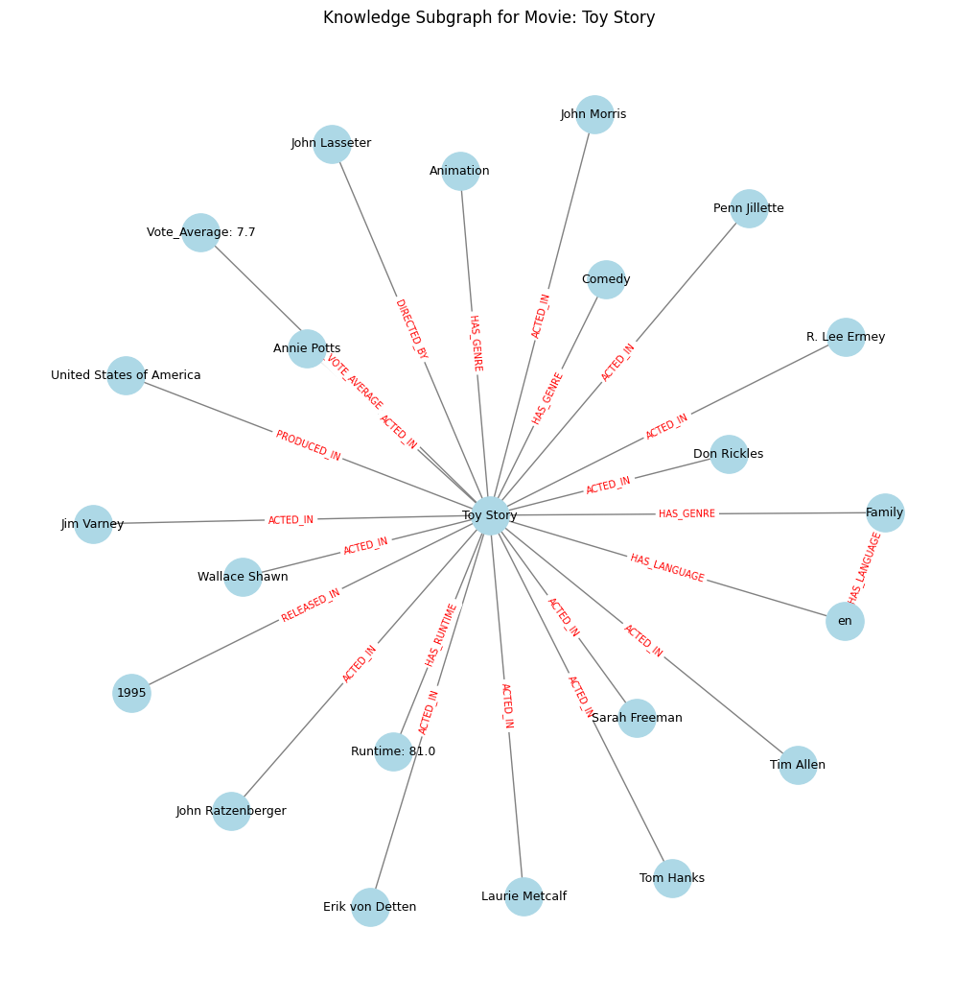

In [ ]:
def display_movie_subgraph(movie_title, graph_path='/content/drive/MyDrive/NLP/movie_kg.pkl'):
    import pickle
    import networkx as nx
    import matplotlib.pyplot as plt

    with open(graph_path, 'rb') as f:
        G = pickle.load(f)

    if movie_title not in G:
        print(f"'{movie_title}' not found in the graph.")
        return

    subgraph = nx.ego_graph(G, movie_title, radius=1)
    pos = nx.spring_layout(subgraph, k=0.5)
    edge_labels = nx.get_edge_attributes(subgraph, 'relationship')

    plt.figure(figsize=(10, 10))
    nx.draw(subgraph, pos, with_labels=True, node_size=800, font_size=9, node_color='lightblue', edge_color='gray')
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_color='red', font_size=7)
    plt.title(f"Knowledge Subgraph for Movie: {movie_title}")
    plt.show()

display_movie_subgraph('Toy Story')

### Subgraph Display

Knowledge graph loaded with 258811 nodes and 916378 edges.
Total movie nodes: 42117
Well-connected movies: 42109


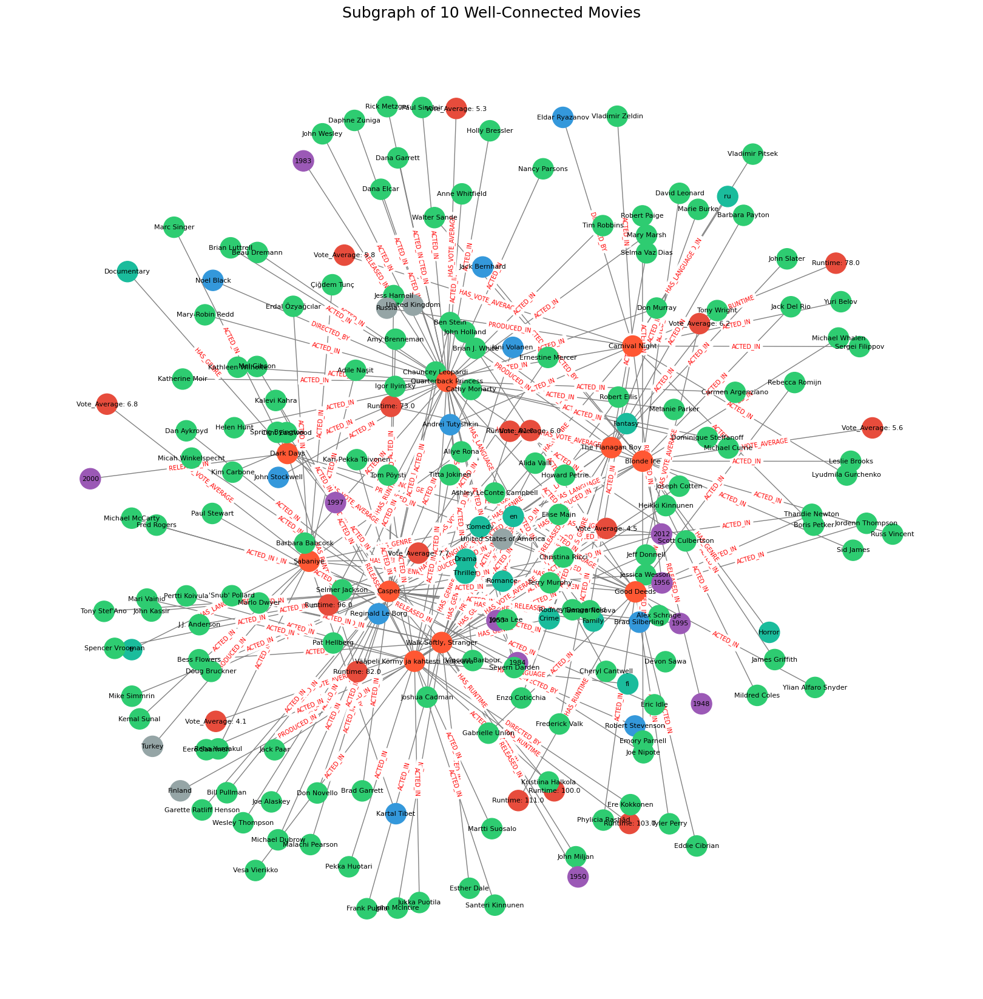

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import pickle
import math

def load_kg(filepath):
    with open(filepath, 'rb') as f:
        G = pickle.load(f)
    print(f"Knowledge graph loaded with {len(G.nodes())} nodes and {len(G.edges())} edges.")
    return G

def visualize_connected_subgraph(G, num_movies=10):
    # 1) Filter valid movie nodes
    movie_nodes = [
        n for n,d in G.nodes(data=True)
        if d.get('label')=='Movie'
           and isinstance(n, str)
           and not (isinstance(n, float) and math.isnan(n))
    ]
    print(f"Total movie nodes: {len(movie_nodes)}")

    # 2) Keep only those with degree > 2
    well_connected = [n for n in movie_nodes if G.degree[n] > 2]
    print(f"Well-connected movies: {len(well_connected)}")

    if len(well_connected) < num_movies:
        print("Not enough well-connected movies to sample from.")
        return

    # 3) Sample and build a combined ego subgraph
    sampled = random.sample(well_connected, num_movies)
    combined_subgraph = nx.Graph()
    for m in sampled:
        ego = nx.ego_graph(G, m, radius=1)
        combined_subgraph = nx.compose(combined_subgraph, ego)

    # 4) Prepare colors by node label
    color_palette = {
        'Movie':               '#FF5733',
        'Director':            '#3498DB',
        'Actor':               '#2ECC71',
        'Production Company':  '#F39C12',
        'Year':                '#9B59B6',
        'Language':            '#1ABC9C',
        'Numeric':             '#E74C3C',
        'Genre':               '#1ABC9C',
        'Country':             '#95A5A6'
    }
    color_map = []
    for node in combined_subgraph.nodes():
        label = G.nodes[node].get("label", "Other")
        color_map.append(color_palette.get(label, "#CCCCCC"))

    # 5) Draw it
    plt.figure(figsize=(16,16))
    pos = nx.spring_layout(combined_subgraph, k=0.4, seed=42)
    nx.draw(
        combined_subgraph, pos,
        node_color=color_map,
        with_labels=True,
        node_size=600,
        font_size=8,
        edge_color='gray'
    )
    edge_labels = nx.get_edge_attributes(combined_subgraph, 'relationship')
    nx.draw_networkx_edge_labels(
        combined_subgraph, pos,
        edge_labels=edge_labels,
        font_size=7,
        font_color='red'
    )
    plt.title(f"Subgraph of {num_movies} Well-Connected Movies", fontsize=18)
    plt.axis('off')
    plt.show()

# === USAGE ===
kg_path = '/content/drive/MyDrive/NLP/movie_kg.pkl'
G = load_kg(kg_path)
visualize_connected_subgraph(G, num_movies=10)


## Recommendation of top 5 movies using Content-based Filtering

In [21]:
import math

def load_clean_kg(path):
    with open(path, 'rb') as f:
        G = pickle.load(f)

    # Remove any movie node that is the float nan
    to_remove = [
        n for n,d in G.nodes(data=True)
        if d.get("label") == "Movie"
           and isinstance(n, float)
           and math.isnan(n)
    ]
    if to_remove:
        print(f"Removing {len(to_remove)} bad movie‐nodes:", to_remove[:5], "…")
        G.remove_nodes_from(to_remove)

    print(f"Cleaned KG: {len(G)} nodes, {G.number_of_edges()} edges")
    return G

# Usage
G = load_clean_kg('/content/drive/MyDrive/NLP/movie_kg.pkl')


Removing 1 bad movie‐nodes: [nan] …
Cleaned KG: 258810 nodes, 916378 edges


In [22]:

def load_graph(filepath):
    with open(filepath, 'rb') as f:
        G = pickle.load(f)
    return G


In [23]:
def cosine_recommendations(G, input_movies, weights, candidate_filter=None, top_n=5):
     # 1) Build the “user” vector as the mean of each movie’s weighted vector
    all_keys = set()
    vecs = []
    for m in input_movies:
        v = get_weighted_vector(G, m, weights)
        vecs.append(v)
        all_keys |= set(v.keys())
    all_keys = sorted(all_keys)
    user_vec = np.mean([dict_to_vector(v, all_keys) for v in vecs], axis=0)

    # 2) Score every other movie
    scores = []
    for node, data in G.nodes(data=True):
        if data.get('label')!='Movie' or node in input_movies:
            continue
        if candidate_filter and node not in candidate_filter:
            continue
        v = get_weighted_vector(G, node, weights)
        mv = dict_to_vector(v, all_keys)
        sim = cosine_similarity([user_vec], [mv])[0,0]
        if sim>0:
            scores.append((node, sim))

    # 3) Take top_n
    top_recs = sorted(scores, key=lambda x: x[1], reverse=True)[:top_n]
    return top_recs

In [24]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def get_weighted_vector(G, movie_node, weights):
    """
    Build a sparse feature‐vector for `movie_node` by
    walking its neighbors and using `weights[relationship]`.
    """
    vec = {}
    for nbr in G.neighbors(movie_node):
        rel = G.edges[movie_node, nbr].get('relationship', '')
        w = weights.get(rel, 0.0)
        if w > 0:
            vec[nbr] = w
    return vec

def dict_to_vector(vec, all_keys):
    """Turn a sparse dict {feature:weight} → dense numpy array."""
    return np.array([vec.get(k, 0.0) for k in all_keys])

def get_shared_attributes(G, movie1, movie2):
    """(unchanged)"""
    shared = {}
    n1 = {n: G.edges[movie1,n]['relationship'] for n in G.neighbors(movie1)}
    n2 = {n: G.edges[movie2,n]['relationship'] for n in G.neighbors(movie2)}
    for node in set(n1) & set(n2):
        shared.setdefault(n1[node], []).append(node)
    return shared

def cosine_recommendations2(G, input_movies, weights, candidate_filter=None, top_n=5):
    # 1) Build the “user” vector as the mean of each movie’s weighted vector
    all_keys = set()
    vecs = []
    for m in input_movies:
        v = get_weighted_vector(G, m, weights)
        vecs.append(v)
        all_keys |= set(v.keys())
    all_keys = sorted(all_keys)
    user_vec = np.mean([dict_to_vector(v, all_keys) for v in vecs], axis=0)

    # 2) Score every other movie
    scores = []
    for node, data in G.nodes(data=True):
        if data.get('label')!='Movie' or node in input_movies:
            continue
        if candidate_filter and node not in candidate_filter:
            continue
        v = get_weighted_vector(G, node, weights)
        mv = dict_to_vector(v, all_keys)
        sim = cosine_similarity([user_vec], [mv])[0,0]
        if sim>0:
            scores.append((node, sim))

    # 3) Take top_n
    top_recs = sorted(scores, key=lambda x: x[1], reverse=True)[:top_n]

    # 4) Print with shared attributes
    print("\nTop Recommendations:")
    for i,(rec,score) in enumerate(top_recs, start=1):
        print(f"{i}. {rec} — Score: {score:.3f}")
        for seed in input_movies:
            shared = get_shared_attributes(G, seed, rec)
            if shared:
                print(f"    Shared with '{seed}':")
                for rel,ents in shared.items():
                    print(f"      - {rel.replace('HAS_','')}: {', '.join(ents)}")
            else:
                print(f"    No shared attributes with '{seed}'")
    return top_recs


In [25]:
def filter_candidates_by_entity(G, entity_name):
    movies = set()
    for neighbor in G.neighbors(entity_name):
        if G.nodes[neighbor].get("label") == "Movie":
            movies.add(neighbor)
    return movies


In [26]:
def create_movie_relation_kg(movie1, movie2):

    try:
        # Input validation
        if not all(isinstance(title, str) for title in [movie1, movie2]):
            raise ValueError("Both movie titles must be strings")

        G = nx.Graph()
        color_palette = {
            'Movie': '#FF5733',
            'Shared': '#F1C40F',
            'Unique': '#3498DB'
        }
        color_map = []
        node_sizes = {}

        # Load data
        movie_data = pd.read_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv', encoding="utf8")

        def get_movie_row(title):
            """Helper to get movie row from dataset"""
            title = str(title).strip().lower()
            for _, row in movie_data.iterrows():
                if row['title'].strip().lower() == title:
                    return row
            return None

        # Get movie data
        row1 = get_movie_row(movie1)
        row2 = get_movie_row(movie2)

        if row1 is None or row2 is None:
            print(f"Movies not found. Check if both '{movie1}' and '{movie2}' exist in the dataset.")
            return

        # Add movie nodes
        for movie in [movie1, movie2]:
            G.add_node(movie, label="Movie")
            color_map.append(color_palette['Movie'])
            node_sizes[movie] = 5000

        def add_entity_nodes(G, movie_node, row, attr_name, label, is_list=False):
            """Helper to add entity nodes and edges"""
            entities = str(row[attr_name])
            entities = [e.strip().strip("'\"") for e in entities.strip("[]").split(',')] if is_list else [entities]

            for entity in entities:
                if not entity or entity.lower() == 'nan':
                    continue
                label_type = 'Shared' if entity in shared_entities else 'Unique'
                if entity not in G:
                    G.add_node(entity, label=label)
                    color_map.append(color_palette[label_type])
                    node_sizes[entity] = 2000 if label_type == 'Shared' else 1200
                G.add_edge(movie_node, entity, relationship=f"HAS_{label.upper()}")

        # Find shared entities
        shared_entities = set()

        def collect_shared(attr_name, is_list=False):
            """Helper to find shared attributes"""
            a = str(row1[attr_name])
            b = str(row2[attr_name])
            a_items = [i.strip().strip("'\"") for i in a.strip("[]").split(',')] if is_list else [a]
            b_items = [i.strip().strip("'\"") for i in b.strip("[]").split(',')] if is_list else [b]
            return set(a_items).intersection(set(b_items))

        # Compare all attributes
        attributes = [
            ('cast', 'Actor', True),
            ('director', 'Director', False),
            ('production_companies', 'Production Company', True),
            ('production_countries', 'Country', True),
            ('original_language', 'Language', False),
            ('year', 'Year', False),
            ('genres','Genre',True)   # ← new
        ]

        for attr, _, is_list in attributes:
            shared_entities.update(collect_shared(attr, is_list))

        # Add all entity nodes
        for movie, row in [(movie1, row1), (movie2, row2)]:
            for attr, label, is_list in attributes:
                add_entity_nodes(G, movie, row, attr, label, is_list)

        # Draw graph
        plt.figure(figsize=(15, 15))
        pos = nx.spring_layout(G, k=0.4, iterations=60)
        nx.draw(G, pos, with_labels=True, node_color=color_map,
                node_size=[node_sizes.get(node, 800) for node in G.nodes()],
                font_size=9, font_weight='bold', edgecolors='gray')
        edge_labels = nx.get_edge_attributes(G, 'relationship')
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels,
                                    font_size=7, font_color='red')

        plt.title(f"KG: How '{movie1}' and '{movie2}' are Related", fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.patches as mpatches

def visualize_recommendation_paths(G, recommended_movie, input_movies, depth=2):
    sub_nodes = set([recommended_movie] + input_movies)
    path_nodes = set()

    # Collect all nodes along paths from recommended_movie to input_movies
    for movie in input_movies:
        if nx.has_path(G, recommended_movie, movie):
            for path in nx.all_simple_paths(G, source=recommended_movie, target=movie, cutoff=depth):
                path_nodes.update(path)

    sub_nodes.update(path_nodes)

    subgraph = G.subgraph(sub_nodes)
    pos = nx.spring_layout(subgraph, k=0.6, seed=42)
    edge_labels = nx.get_edge_attributes(subgraph, 'relationship')

    # Define label to color mapping
    label_colors = {
        "Movie": "lightgray", "Actor": "limegreen", "Director": "dodgerblue",
        "Genre": "mediumorchid", "Production Company": "darkorange",
        "Numeric": "lightgray", "Language": "cyan", "Year": "pink"
    }

    node_colors = []
    for node in subgraph:
        if node == recommended_movie:
            node_colors.append("crimson")
        elif node in input_movies:
            node_colors.append("gold")
        elif node in path_nodes:
            node_colors.append("deepskyblue")
        else:
            label = G.nodes[node].get("label", "Other")
            node_colors.append(label_colors.get(label, "black"))

    plt.figure(figsize=(14, 12))
    nx.draw(
        subgraph, pos,
        with_labels=True,
        node_color=node_colors,
        node_size=1300,
        font_size=8,
        edge_color='gray'
    )
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=7)

    # Legend
    legend_items = [
        mpatches.Patch(color="crimson", label="Recommended Movie"),
        mpatches.Patch(color="gold", label="Input Movie"),
        mpatches.Patch(color="deepskyblue", label="Path Node")
    ] + [mpatches.Patch(color=color, label=label) for label, color in label_colors.items()]

    plt.legend(handles=legend_items, loc='upper right', fontsize=9, frameon=True)
    plt.title(f"Graph Explanation: {recommended_movie} & Input Movies", fontsize=15)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [ ]:
def recommend_interface(G, weights, top_k=5):
    print("Choose an option:\n1. Based on Favorite Movies\n2. Similar Genre\n3. Director or Actor")
    option = input("Enter option number: ").strip()

    input_movies = []
    filter_set = None

    if option == "1":
        input_movies = input("Enter favorite movie(s), comma-separated: ").split(',')
        input_movies = [m.strip() for m in input_movies]

    elif option == "2":
        genre = input("Enter genre name (exact match from KG): ").strip()
        filter_set = filter_candidates_by_entity(G, genre)
        input_movies = input("Enter a movie you like in this genre: ").split(',')
        input_movies = [m.strip() for m in input_movies]

    elif option == "3":
        entity = input("Enter director/actor name (exact match): ").strip()
        filter_set = filter_candidates_by_entity(G, entity)
        input_movies = input("Enter a movie you like from this person: ").split(',')
        input_movies = [m.strip() for m in input_movies]

    else:
        print("Invalid option.")
        return

    content_recommendations = cosine_recommendations2(G, input_movies, weights, candidate_filter=filter_set)

    if not  content_recommendations:
        print("No recommendations found.")
        return

    print("\nTop Recommendations:")
    for i, (movie, score) in enumerate( content_recommendations[:top_k], 1):
        print(f"{i}. {movie} — Score: {score:.3f}")

    top_movie =  content_recommendations[0][0]
    create_movie_relation_kg(str(input_movies[0]), str(top_movie))


## Main to get recommendations

Choose an option:
1. Based on Favorite Movies
2. Similar Genre
3. Director or Actor
Enter option number: 1
Enter favorite movie(s), comma-separated: Inception

Top Recommendations:
1. The Dark Knight Rises — Score: 0.757
    Shared with 'Inception':
      - ACTED_IN: Marion Cotillard, Michael Caine, Tom Hardy, Russ Fega, Miranda Nolan, Joseph Gordon-Levitt, Cillian Murphy
      - DIRECTED_BY: Christopher Nolan
      - GENRE: Action, Thriller
      - LANGUAGE: en
      - PRODUCED_IN: United States of America
2. Dunkirk — Score: 0.723
    Shared with 'Inception':
      - ACTED_IN: Michael Caine, Tom Hardy, Miranda Nolan, Cillian Murphy
      - DIRECTED_BY: Christopher Nolan
      - GENRE: Action, Thriller
      - LANGUAGE: en
      - PRODUCED_IN: United States of America, United Kingdom
3. Interstellar — Score: 0.700
    Shared with 'Inception':
      - ACTED_IN: Michael Caine, Russ Fega
      - GENRE: Science Fiction, Adventure
      - DIRECTED_BY: Christopher Nolan
      - LANGUAGE: en

<ipython-input-52-4734cc086e03>:99: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



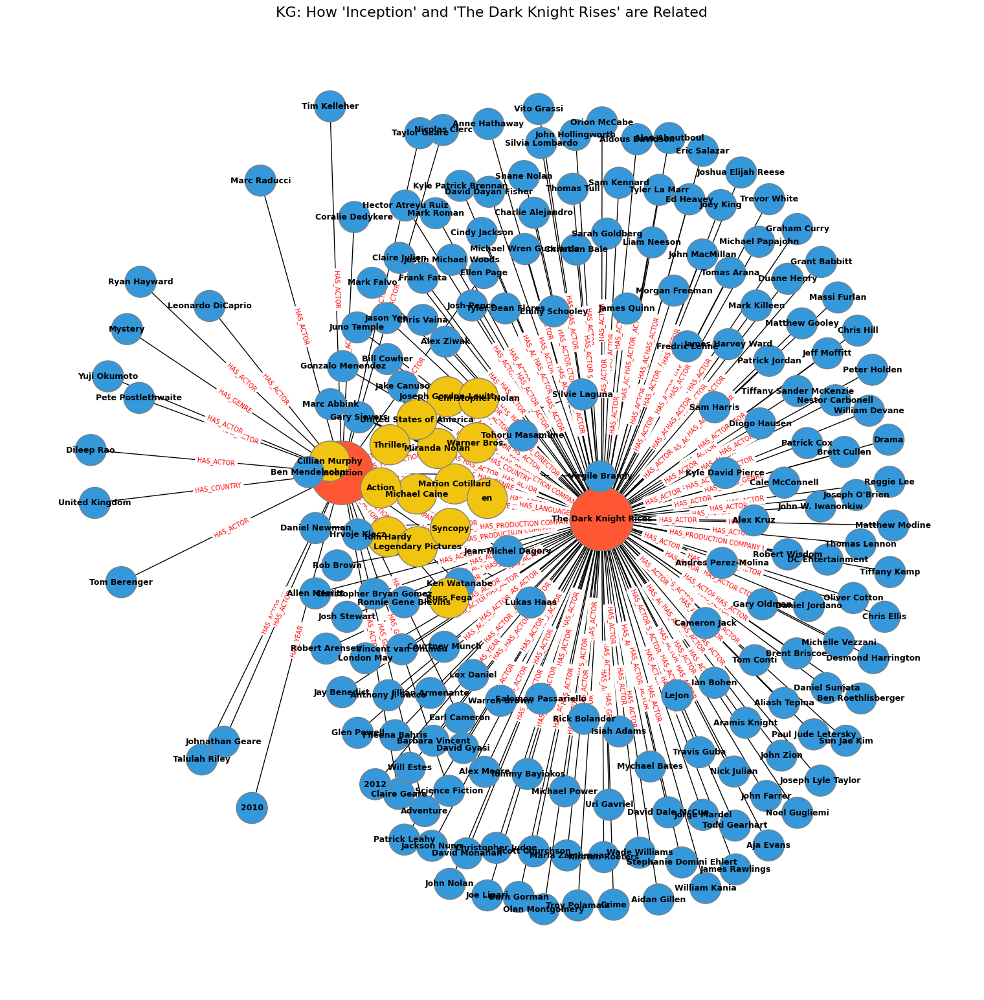

In [ ]:

weights = {
    "DIRECTED_BY":      5.0,
    "ACTED_IN":         1.0,
    "HAS_GENRE":        1.0,   # ← this brings in genres
    "PRODUCED_BY":      1.0,
    "HAS_LANGUAGE":     0.3,
    "RELEASED_IN":      0.5,   # your “Year” edges
    "HAS_RUNTIME":      0.2,
    "HAS_VOTE_AVERAGE": 0.2
}
recommend_interface(G, weights)


In [ ]:
weights = {
    "DIRECTED_BY":      5.0,
    "ACTED_IN":         1.0,
    "HAS_GENRE":        1.0,   # ← this brings in genres
    "PRODUCED_BY":      1.0,
    "HAS_LANGUAGE":     0.3,
    "RELEASED_IN":      0.5,   # your “Year” edges
    "HAS_RUNTIME":      0.2,
    "HAS_VOTE_AVERAGE": 0.2
}

# then:
recs = cosine_recommendations2(G, ["Inception"], weights, top_n=5)



Top Recommendations:
1. The Dark Knight Rises — Score: 0.757
    Shared with 'Inception':
      - ACTED_IN: Cillian Murphy, Marion Cotillard, Michael Caine, Russ Fega, Miranda Nolan, Joseph Gordon-Levitt, Tom Hardy
      - DIRECTED_BY: Christopher Nolan
      - GENRE: Thriller, Action
      - PRODUCED_IN: United States of America
      - LANGUAGE: en
2. Dunkirk — Score: 0.723
    Shared with 'Inception':
      - ACTED_IN: Cillian Murphy, Michael Caine, Miranda Nolan, Tom Hardy
      - DIRECTED_BY: Christopher Nolan
      - GENRE: Thriller, Action
      - PRODUCED_IN: United States of America, United Kingdom
      - LANGUAGE: en
3. Interstellar — Score: 0.700
    Shared with 'Inception':
      - DIRECTED_BY: Christopher Nolan
      - PRODUCED_IN: United States of America, United Kingdom
      - ACTED_IN: Michael Caine, Russ Fega
      - LANGUAGE: en
      - GENRE: Adventure, Science Fiction
      - VOTE_AVERAGE: Vote_Average: 8.1
4. Batman Begins — Score: 0.700
    Shared with 'Incepti

# Colaborative Filtering

## CSV for Colaborative Filtering (userid,movie)

In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/ratings_small.csv'

# Read the CSV file using pandas
users = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
users.head()

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205


In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/links_small.csv'

# Read the CSV file using pandas
links = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [ ]:
def convert_int(x):
    try:
        return int(x)
    except:
        return np.nan

id_map = links[['movieId', 'tmdbId']]
id_map['tmdbId'] = id_map['tmdbId'].apply(convert_int)
id_map.columns = ['movieId', 'id']
id_map = id_map.merge(movies[['title', 'id']], on='id').set_index('title')
id_map.head()

<ipython-input-100-0d37f5ee5fa5>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,movieId,id
title,,
Toy Story,1,862.0
Jumanji,2,8844.0
Grumpier Old Men,3,15602.0
Waiting to Exhale,4,31357.0
Father of the Bride Part II,5,11862.0


In [ ]:
# Suppose:
# - ratings_df is your user ratings DataFrame (userId, movieId, rating)
# - id_map is your mapping DataFrame (movieId, id, indexed by title)

# First, remove the index so we can merge
id_map_reset = id_map.reset_index()

# Merge ratings with id_map
merged = users.merge(id_map_reset[['movieId', 'title']], on='movieId', how='left')

# Keep only userId, title, and rating
final_df = merged[['userId','movieId', 'title', 'rating']]

# Optional: drop any missing titles (if some movieIds didn't match)
final_df = final_df.dropna()

final_df.head()


,userId,movieId,title,rating
0,1,31,Dangerous Minds,2.5
1,1,1029,Dumbo,3.0
2,1,1061,Sleepers,3.0
3,1,1129,Escape from New York,2.0
4,1,1172,Cinema Paradiso,4.0


In [ ]:
final_df[final_df['title']=='Toy Story']

,userId,movieId,title,rating
495,7,1,Toy Story,3.0
699,9,1,Toy Story,4.0
889,13,1,Toy Story,5.0
962,15,1,Toy Story,2.0
3111,19,1,Toy Story,3.0
...,...,...,...,...
98651,660,1,Toy Story,2.5
98834,663,1,Toy Story,4.0
98860,664,1,Toy Story,3.5
99978,670,1,Toy Story,4.0


In [ ]:
users[users['userId']==1]

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205
5,1,1263,2.0,1260759151
6,1,1287,2.0,1260759187
7,1,1293,2.0,1260759148
8,1,1339,3.5,1260759125
9,1,1343,2.0,1260759131


## Saving and Loading KG

In [ ]:
import pickle
import networkx as nx

class SavingKG:
    def __init__(self, user_movie_df):
        self.df = user_movie_df.copy()
        self.G  = nx.Graph()

    def build_graph(self, save_path):
        # Optional: normalize titles for consistent lookup
        #self.df['title'] = self.df['title'].str.lower().str.strip()

        for _, row in self.df.iterrows():
            user   = f"user_{int(row['userId'])}"
            movie  = row['title']
            rating = row['rating']

            # Add nodes
            self.G.add_node(user,  label='User')
            self.G.add_node(movie, label='Movie')

            # Add edge with both relationship + rating
            self.G.add_edge(
                user,
                movie,
                relationship='RATED',
                rating=rating
            )

        # Save the graph
        with open(save_path, 'wb') as f:
            pickle.dump(self.G, f)

        print(f"Knowledge graph saved as '{save_path}'.")



kg = SavingKG(final_df)
kg.build_graph('/content/drive/MyDrive/NLP/user_movie_graph.pkl')

Knowledge graph saved as '/content/drive/MyDrive/NLP/user_movie_graph.pkl'.


Loaded KG with 9425 nodes and 99470 edges.


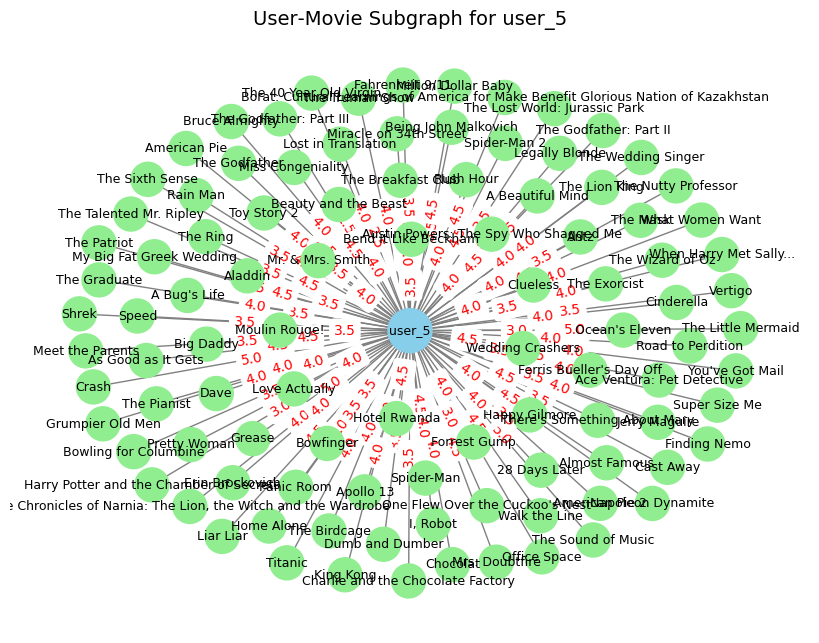

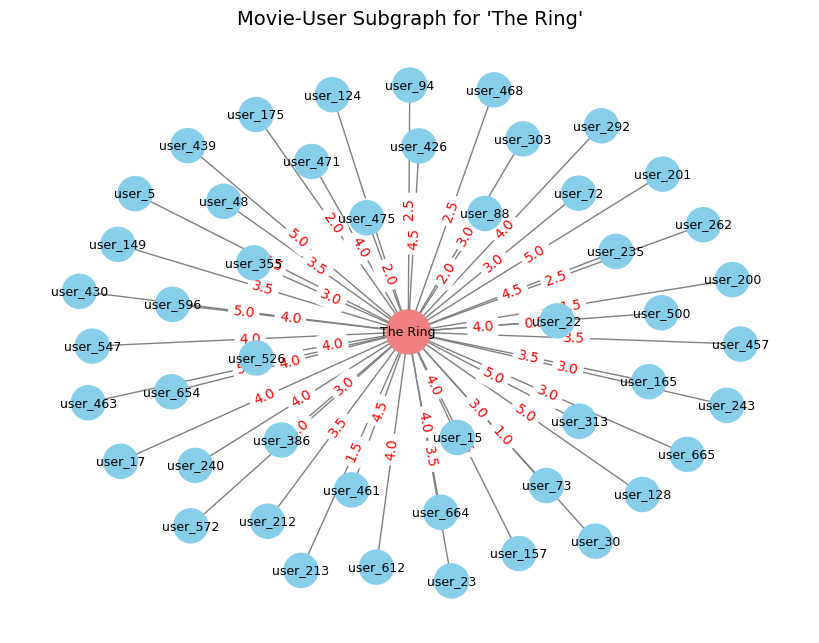

In [ ]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt

class UserMovieKG:
    def __init__(self):
        self.G = nx.Graph()

    def load_kg(self, filepath):
        """Load the pickled user–movie bipartite KG."""
        with open(filepath, 'rb') as f:
            self.G = pickle.load(f)
        print(f"Loaded KG with {self.G.number_of_nodes()} nodes and {self.G.number_of_edges()} edges.")
        return self.G

    def show_user_graph(self, user_id):
        """Draw the subgraph of a user and all movies they've rated."""
        user_node = f"user_{user_id}"
        if user_node not in self.G:
            print(f"No data for user '{user_id}' in this graph.")
            return

        # ego‐graph: user + neighbors
        subG = nx.ego_graph(self.G, user_node, radius=1)

        plt.figure(figsize=(8, 6))
        pos = nx.spring_layout(subG, seed=42, k=0.5)
        colors = ['skyblue' if n.startswith('user_') else 'lightgreen' for n in subG]
        sizes  = [1000 if n==user_node else 600 for n in subG]

        nx.draw(subG, pos,
                with_labels=True,
                node_color=colors,
                node_size=sizes,
                font_size=9,
                edge_color='gray')

        # edge labels = ratings
        edge_labels = {
            (u,v): f"{d['rating']:.1f}"
            for u,v,d in subG.edges(data=True)
            if d.get('relationship')=='RATED'
        }
        nx.draw_networkx_edge_labels(subG, pos, edge_labels=edge_labels, font_color='red')

        plt.title(f"User‐Movie Subgraph for user_{user_id}", fontsize=14)
        plt.axis('off')
        plt.show()

    def show_movie_graph(self, movie_title):
        """Draw the subgraph of a movie and all users who've rated it."""
        movie_node = movie_title.strip()
        if movie_node not in self.G:
            print(f"No data for movie '{movie_title}' in this graph.")
            return

        subG = nx.ego_graph(self.G, movie_node, radius=1)

        plt.figure(figsize=(8, 6))
        pos = nx.spring_layout(subG, seed=42, k=0.5)
        colors = ['lightcoral' if n==movie_node else 'skyblue' for n in subG]
        sizes  = [1000 if n==movie_node else 600 for n in subG]

        nx.draw(subG, pos,
                with_labels=True,
                node_color=colors,
                node_size=sizes,
                font_size=9,
                edge_color='gray')

        # edge labels = ratings
        edge_labels = {
            (u,v): f"{d['rating']:.1f}"
            for u,v,d in subG.edges(data=True)
            if d.get('relationship')=='RATED'
        }
        nx.draw_networkx_edge_labels(subG, pos, edge_labels=edge_labels, font_color='red')

        plt.title(f"Movie‐User Subgraph for '{movie_title}'", fontsize=14)
        plt.axis('off')
        plt.show()


# === USAGE ===
kg = UserMovieKG()

# 1) Load your user–movie KG (with ratings)
kg.load_kg('/content/drive/MyDrive/NLP/user_movie_graph.pkl')

# 2) Visualize for a specific user:
kg.show_user_graph(5)         # e.g. user_5

# 3) Visualize for a specific movie:
kg.show_movie_graph('The Ring')


In [ ]:
class UserMovieKG:
    def __init__(self, user_movie_df):
        self.df = user_movie_df.copy()
        self.G = nx.Graph()

    def load_kg(self,filepath):
      with open(filepath, 'rb') as f:
          self.G = pickle.load(f)
      print(f"Knowledge graph loaded with {len(G.nodes())} nodes and {len(G.edges())} edges.")
      return self.G


    def show_user_graph(self, user_id):
        user_node = f"user_{user_id}"

        if user_node not in self.G:
            print(f"No data for user {user_id}")
            return

        # Subgraph: user + their rated movies
        neighbors = list(self.G.neighbors(user_node))
        subG = self.G.subgraph([user_node] + neighbors)

        # Draw
        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(subG, k=0.5)
        node_colors = ['skyblue' if node.startswith('user_') else 'lightgreen' for node in subG.nodes()]
        node_sizes = [1200 if node.startswith('user_') else 800 for node in subG.nodes()]

        nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes, font_size=10, font_weight='bold', edgecolors='gray')

        # Draw edge labels (ratings)
        edge_labels = nx.get_edge_attributes(subG, 'rating')
        nx.draw_networkx_edge_labels(subG, pos, edge_labels={k: f"{v:.1f}" for k,v in edge_labels.items()}, font_color='red')

        plt.title(f"Knowledge Graph for User {user_id}", fontsize=14)
        plt.show()

    def show_movie_graph(self, movie_title):
      movie_node = movie_title.strip()

      if movie_node not in self.G:
          print(f"No data for movie '{movie_title}'")
          return

      neighbors = list(self.G.neighbors(movie_node))
      subG = self.G.subgraph([movie_node] + neighbors)

      plt.figure(figsize=(10, 8))
      pos = nx.spring_layout(subG, k=0.5)
      node_colors = ['lightgreen' if node == movie_node else 'skyblue' for node in subG.nodes()]
      node_sizes = [1200 if node == movie_node else 800 for node in subG.nodes()]

      nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes, font_size=10, font_weight='bold', edgecolors='gray')

      edge_labels = nx.get_edge_attributes(subG, 'rating')
      nx.draw_networkx_edge_labels(subG, pos, edge_labels={k: f"{v:.1f}" for k,v in edge_labels.items()}, font_color='red')

      plt.title(f"Knowledge Graph for Movie '{movie_title}'", fontsize=14)
      plt.show()

    def show_users_graph(self, user_ids):
      # Prepare the user nodes
      user_nodes = [f"user_{uid}" for uid in user_ids]

      # Check if all users exist
      missing = [u for u in user_nodes if u not in self.G]
      if missing:
          print(f"No data for users: {', '.join(missing)}")
          return

      # Get neighbors (movies) for each user
      user_neighbors = {u: set(self.G.neighbors(u)) for u in user_nodes}

      # Movies rated by any user
      all_movies = set().union(*user_neighbors.values())

      # Find common movies rated by all users
      common_movies = set.intersection(*user_neighbors.values())

      # Nodes to include: users + their rated movies
      nodes_to_include = set(user_nodes) | all_movies

      # Subgraph
      subG = self.G.subgraph(nodes_to_include)

      # Coloring logic
      node_colors = []
      for node in subG.nodes():
          if node in user_nodes:
              node_colors.append('skyblue')  # User nodes
          elif node in common_movies:
              node_colors.append('orange')   # Common movies
          else:
              node_colors.append('lightgreen')  # Individual movies

      node_sizes = [1200 if node.startswith('user_') else 800 for node in subG.nodes()]

      # Draw
      plt.figure(figsize=(12, 10))
      pos = nx.spring_layout(subG, k=0.5)

      nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes,
              font_size=10, font_weight='bold', edgecolors='gray')

      # Draw edge labels (ratings)
      edge_labels = nx.get_edge_attributes(subG, 'rating')
      nx.draw_networkx_edge_labels(subG, pos,
                                  edge_labels={k: f"{v:.1f}" for k,v in edge_labels.items()},
                                  font_color='red')

      plt.title(f"Knowledge Graph for Users {user_ids}\n(Common Movies Highlighted in Orange)", fontsize=14)
      plt.show()

# Example usage:




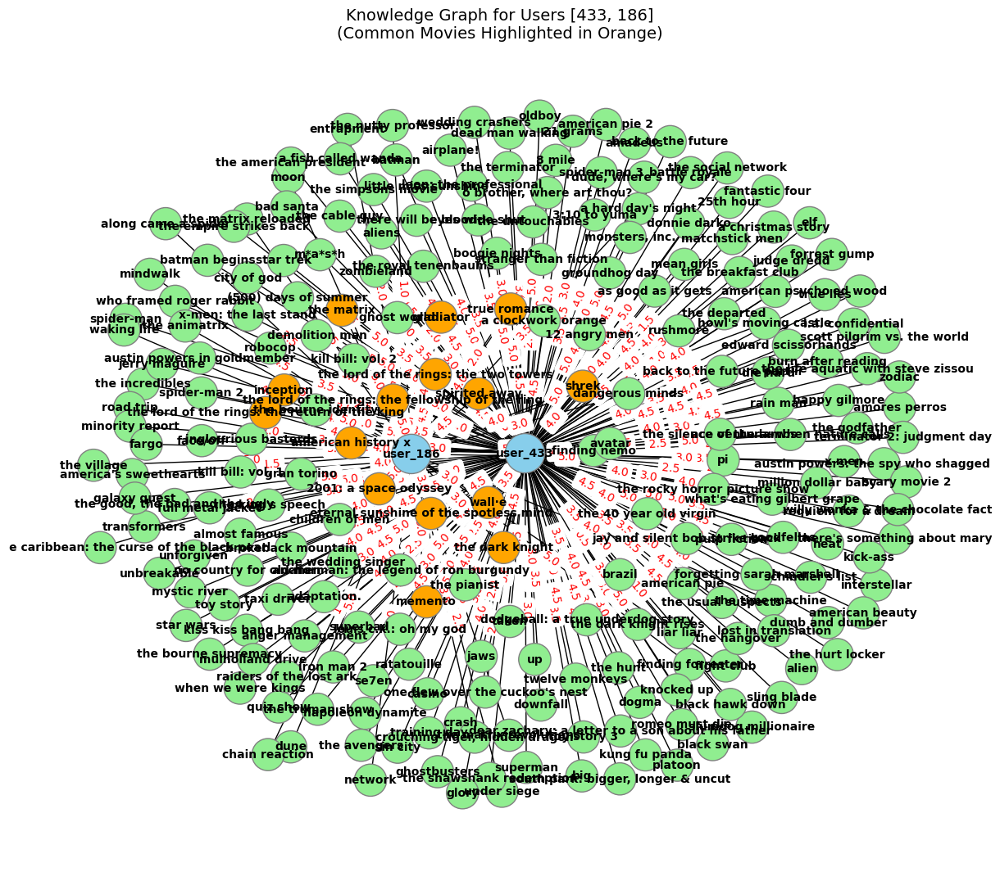

In [ ]:


kg = UserMovieKG(final_df)
kg.build_graph()
kg.show_users_graph([433, 186])


## KG of Recommendations using Colaborative

In [29]:
import networkx as nx
import matplotlib.pyplot as plt
import pickle

class UserMovieKG:
    def __init__(self, user_movie_df=None):
        if user_movie_df is not None:
            self.df = user_movie_df.copy()
            self.G = nx.Graph()
        else:
            self.df = None
            self.G = nx.Graph()

    def build_graph(self):
        # Make titles lowercase and strip whitespaces
        self.df['title'] = self.df['title'].str.strip()

        for _, row in self.df.iterrows():
            user = f"user_{row['userId']}"
            movie = row['title']
            rating = row['rating']

            self.G.add_node(user, label='User')
            self.G.add_node(movie, label='Movie')
            self.G.add_edge(user, movie, rating=rating)

    def save_kg(self, filepath):
        with open(filepath, 'wb') as f:
            pickle.dump(self.G, f)
        print(f"Knowledge graph saved to {filepath}")

    def load_kg(self, filepath):
        with open(filepath, 'rb') as f:
            self.G = pickle.load(f)
        print(f"Knowledge graph loaded with {len(self.G.nodes())} nodes and {len(self.G.edges())} edges.")
        return self.G

    def show_user_graph(self, user_id):
        user_node = f"user_{user_id}"

        if user_node not in self.G:
            print(f"No data for user {user_id}")
            return

        neighbors = list(self.G.neighbors(user_node))
        subG = self.G.subgraph([user_node] + neighbors)

        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(subG, k=0.5)
        node_colors = ['skyblue' if node.startswith('user_') else 'lightgreen' for node in subG.nodes()]
        node_sizes = [1200 if node.startswith('user_') else 800 for node in subG.nodes()]

        nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes,
                font_size=10, font_weight='bold', edgecolors='gray')

        edge_labels = nx.get_edge_attributes(subG, 'rating')
        nx.draw_networkx_edge_labels(subG, pos, edge_labels={k: f"{v:.1f}" for k, v in edge_labels.items()},
                                     font_color='red')

        plt.title(f"Knowledge Graph for User {user_id}", fontsize=14)
        plt.show()

    def show_movie_graph(self, movie_title):
        movie_node = movie_title.lower().strip()

        if movie_node not in self.G:
            print(f"No data for movie '{movie_title}'")
            return

        neighbors = list(self.G.neighbors(movie_node))
        subG = self.G.subgraph([movie_node] + neighbors)

        plt.figure(figsize=(10, 8))
        pos = nx.spring_layout(subG, k=0.5)
        node_colors = ['lightgreen' if node == movie_node else 'skyblue' for node in subG.nodes()]
        node_sizes = [1200 if node == movie_node else 800 for node in subG.nodes()]

        nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes,
                font_size=10, font_weight='bold', edgecolors='gray')

        edge_labels = nx.get_edge_attributes(subG, 'rating')
        nx.draw_networkx_edge_labels(subG, pos, edge_labels={k: f"{v:.1f}" for k, v in edge_labels.items()},
                                     font_color='red')

        plt.title(f"Knowledge Graph for Movie '{movie_title}'", fontsize=14)
        plt.show()

    def show_users_graph(self, user_ids):
        user_nodes = [f"user_{uid}" for uid in user_ids]

        missing = [u for u in user_nodes if u not in self.G]
        if missing:
            print(f"No data for users: {', '.join(missing)}")
            return

        user_neighbors = {u: set(self.G.neighbors(u)) for u in user_nodes}
        all_movies = set().union(*user_neighbors.values())
        common_movies = set.intersection(*user_neighbors.values())
        nodes_to_include = set(user_nodes) | all_movies

        subG = self.G.subgraph(nodes_to_include)

        node_colors = []
        for node in subG.nodes():
            if node in user_nodes:
                node_colors.append('skyblue')  # User nodes
            elif node in common_movies:
                node_colors.append('orange')   # Common movies
            else:
                node_colors.append('lightgreen')  # Individual movies

        node_sizes = [1200 if node.startswith('user_') else 800 for node in subG.nodes()]

        plt.figure(figsize=(12, 10))
        pos = nx.spring_layout(subG, k=0.5)

        nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes,
                font_size=10, font_weight='bold', edgecolors='gray')

        edge_labels = nx.get_edge_attributes(subG, 'rating')
        nx.draw_networkx_edge_labels(subG, pos, edge_labels={k: f"{v:.1f}" for k, v in edge_labels.items()},
                                     font_color='red')

        plt.title(f"Knowledge Graph for Users {user_ids}\n(Common Movies Highlighted in Orange)", fontsize=14)
        plt.show()

    def recommend_movies_based_on_movie(self, movie_title, min_rating=4.0, top_k=5):
        movie_node = movie_title.strip()

        if movie_node not in self.G:
            print(f"Movie '{movie_title}' not found in graph.")
            return []

        # Step 1: Find users who rated this movie ≥ min_rating
        user_candidates = []
        for neighbor in self.G.neighbors(movie_node):
            if neighbor.startswith('user_'):
                rating = self.G.edges[movie_node, neighbor]['rating']
                if rating >= min_rating:
                    user_candidates.append(neighbor)

        if not user_candidates:
            print(f"No users rated '{movie_title}' ≥ {min_rating}.")
            return []

        # Step 2: Find other movies those users rated highly
        movie_recommendations = {}
        for user in user_candidates:
            for neighbor in self.G.neighbors(user):
                if neighbor != movie_node and not neighbor.startswith('user_'):
                    rating = self.G.edges[user, neighbor]['rating']
                    if rating >= min_rating:
                        if neighbor not in movie_recommendations:
                            movie_recommendations[neighbor] = []
                        movie_recommendations[neighbor].append(rating)

        # Step 3: Aggregate and rank movies
        recommendations = []
        for movie, ratings in movie_recommendations.items():
            avg_rating = sum(ratings) / len(ratings)
            recommendations.append((movie, avg_rating, len(ratings)))

        # Sort by number of users first, then average rating
        recommendations.sort(key=lambda x: (-x[2], -x[1]))

        return recommendations[:top_k]
    def show_top_users_graph_for_movie(self, movie_title, min_rating=4.0):
      movie_node = movie_title.strip()

      if movie_node not in self.G:
          print(f"No data for movie '{movie_title}'")
          return

      # Find users who rated this movie >= min_rating
      top_users = []
      for neighbor in self.G.neighbors(movie_node):
          if neighbor.startswith('user_'):
              rating = self.G[movie_node][neighbor]['rating']
              if rating >= min_rating:
                  top_users.append(neighbor)

      if not top_users:
          print(f"No users found who rated '{movie_title}' >= {min_rating}")
          return

      # Collect all movies rated highly by these users
      movie_neighbors = set()
      for user in top_users:
          for neighbor in self.G.neighbors(user):
              if neighbor != movie_node:
                  rating = self.G[user][neighbor]['rating']
                  if rating >= min_rating:
                      movie_neighbors.add(neighbor)

      # Nodes to draw: users + the input movie + their highly rated movies
      nodes_to_include = set(top_users) | movie_neighbors | {movie_node}
      subG = self.G.subgraph(nodes_to_include)

      # Color settings
      node_colors = []
      for node in subG.nodes():
          if node.startswith('user_'):
              node_colors.append('skyblue')  # User nodes
          elif node == movie_node:
              node_colors.append('orange')   # Input movie
          else:
              node_colors.append('lightgreen')  # Other movies

      node_sizes = [1200 if node.startswith('user_') else 800 for node in subG.nodes()]

      # Draw
      plt.figure(figsize=(14, 12))
      pos = nx.spring_layout(subG, k=0.5)

      nx.draw(subG, pos, with_labels=True, node_color=node_colors, node_size=node_sizes,
              font_size=10, font_weight='bold', edgecolors='gray')

      # Draw edge labels (ratings)
      edge_labels = nx.get_edge_attributes(subG, 'rating')
      nx.draw_networkx_edge_labels(subG, pos,
                                  edge_labels={k: f"{v:.1f}" for k,v in edge_labels.items()},
                                  font_color='red')

      plt.title(f"Graph of Top Users and Their Liked Movies for '{movie_title}'", fontsize=16)
      plt.show()

      return top_users



In [ ]:
# Create instance
kg = UserMovieKG()

# Load your saved graph
kg.load_kg('/content/drive/MyDrive/NLP/user_movie_graph.pkl')


# Recommend movies
movie_input = input("Enter a movie title: ")
recommendations = kg.recommend_movies_based_on_movie(movie_input, min_rating=4.0, top_k=5)

if recommendations:
    print("\nRecommended movies:")
    for movie, avg_rating, count in recommendations:
        print(f"Movie: {movie.title()}, Avg Rating: {avg_rating:.2f}, Rated Highly By {count} users")

Knowledge graph loaded with 9425 nodes and 99470 edges.
Enter a movie title: Inception

Recommended movies:
Movie: Fight Club, Avg Rating: 4.53, Rated Highly By 49 users
Movie: The Matrix, Avg Rating: 4.68, Rated Highly By 48 users
Movie: Pulp Fiction, Avg Rating: 4.65, Rated Highly By 48 users
Movie: The Dark Knight, Avg Rating: 4.65, Rated Highly By 47 users
Movie: The Shawshank Redemption, Avg Rating: 4.67, Rated Highly By 44 users


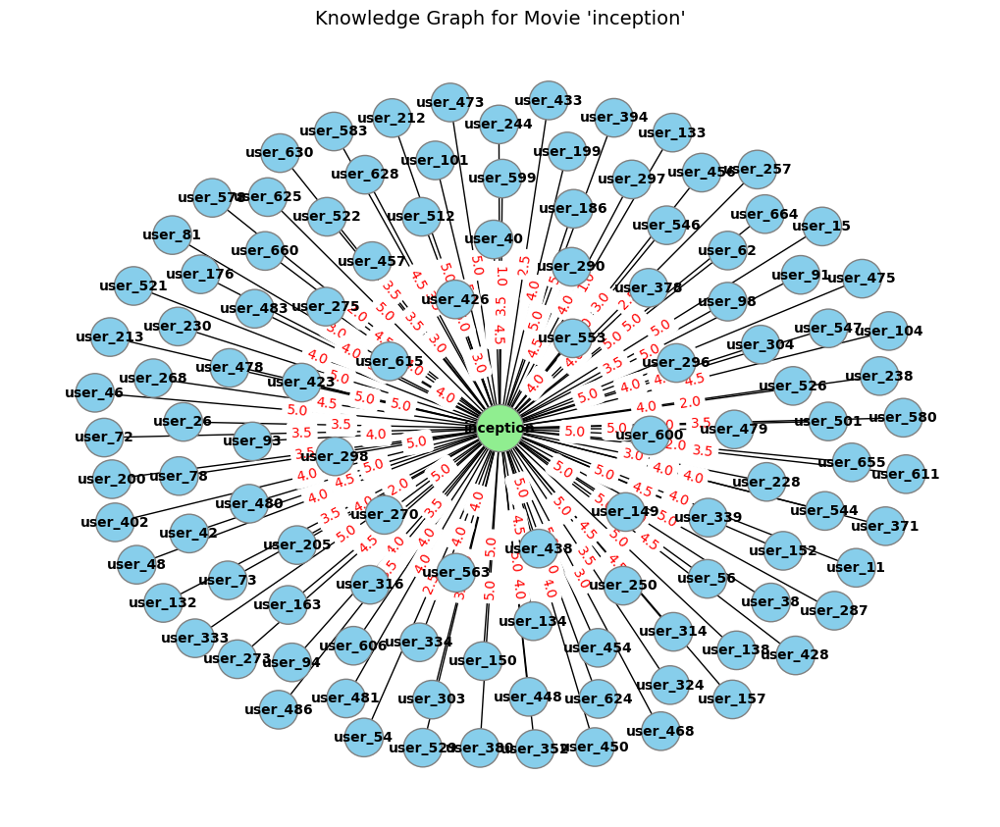

In [ ]:


# Show movie graph (direct neighbors)
kg.show_movie_graph(movie_input)



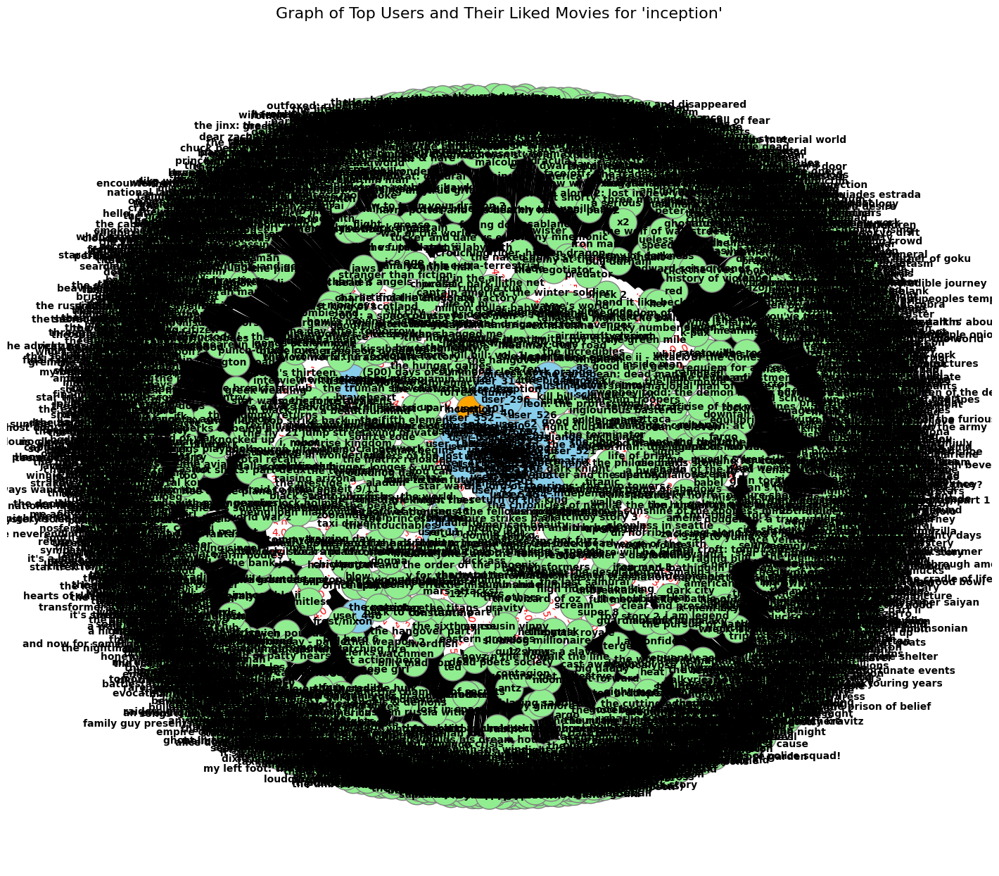

['user_11',
 'user_15',
 'user_38',
 'user_40',
 'user_42',
 'user_46',
 'user_48',
 'user_56',
 'user_62',
 'user_73',
 'user_78',
 'user_91',
 'user_93',
 'user_94',
 'user_101',
 'user_104',
 'user_134',
 'user_138',
 'user_149',
 'user_150',
 'user_152',
 'user_157',
 'user_176',
 'user_186',
 'user_199',
 'user_212',
 'user_230',
 'user_250',
 'user_268',
 'user_270',
 'user_273',
 'user_275',
 'user_287',
 'user_290',
 'user_296',
 'user_297',
 'user_298',
 'user_303',
 'user_304',
 'user_314',
 'user_333',
 'user_334',
 'user_339',
 'user_352',
 'user_371',
 'user_378',
 'user_380',
 'user_394',
 'user_402',
 'user_423',
 'user_428',
 'user_438',
 'user_448',
 'user_450',
 'user_454',
 'user_473',
 'user_478',
 'user_479',
 'user_480',
 'user_481',
 'user_501',
 'user_512',
 'user_521',
 'user_526',
 'user_544',
 'user_546',
 'user_547',
 'user_553',
 'user_563',
 'user_583',
 'user_600',
 'user_606',
 'user_615',
 'user_624',
 'user_625',
 'user_660',
 'user_664']

In [ ]:

# Show top users and their liked movies
kg.show_top_users_graph_for_movie(movie_input, min_rating=4.0)

In [ ]:
import plotly.graph_objects as go

def plot_interactive_movie_user_graph(G, movie_title, min_rating=4.0, top_k=5, max_users=30):
    movie_node = movie_title.lower().strip()

    if movie_node not in G:
        print(f"No data for movie '{movie_title}'")
        return

    top_users = []
    for neighbor in G.neighbors(movie_node):
        if neighbor.startswith('user_'):
            rating = G[movie_node][neighbor]['rating']
            if rating >= min_rating:
                top_users.append((neighbor, rating))

    if not top_users:
        print(f"No users found who rated '{movie_title}' >= {min_rating}")
        return

    top_users = sorted(top_users, key=lambda x: -x[1])[:max_users]
    top_users = [u for u, _ in top_users]

    movie_ratings = dict()
    for user in top_users:
        for neighbor in G.neighbors(user):
            if neighbor != movie_node:
                rating = G[user][neighbor]['rating']
                if rating >= min_rating:
                    if neighbor not in movie_ratings:
                        movie_ratings[neighbor] = []
                    movie_ratings[neighbor].append(rating)

    if not movie_ratings:
        print(f"No highly rated movies found by users of '{movie_title}'")
        return

    sorted_movies = sorted(movie_ratings.items(), key=lambda x: (-len(x[1]), -sum(x[1])/len(x[1])))
    top_movies = [movie for movie, _ in sorted_movies[:top_k]]

    nodes_to_include = set(top_users) | set(top_movies) | {movie_node}
    subG = G.subgraph(nodes_to_include)

    pos = nx.spring_layout(subG, seed=42)

    edge_x = []
    edge_y = []
    edge_text = []

    for u, v in subG.edges():
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
        edge_text.append(f"{u} - {v}: {subG[u][v]['rating']:.1f}")

    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='text',
        mode='lines'
    )

    node_x = []
    node_y = []
    node_text = []
    node_color = []
    for node in subG.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        if node == movie_node:
            node_color.append('orange')
        elif node.startswith('user_'):
            node_color.append('skyblue')
        else:
            node_color.append('lightgreen')
        node_text.append(node)

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers+text',
        text=[n.replace('user_', '') if n.startswith('user_') else n.title() for n in node_text],
        textposition='top center',
        hovertext=node_text,
        marker=dict(
            showscale=False,
            color=node_color,
            size=20,
            line_width=2
        )
    )

    fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title=f"Interactive Top {max_users} Users and Top {top_k} Movies for '{movie_title}'",
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20, l=5, r=5, t=40),
                annotations=[dict(
                    text="",
                    showarrow=False,
                    xref="paper", yref="paper"
                )],
                xaxis=dict(showgrid=False, zeroline=False),
                yaxis=dict(showgrid=False, zeroline=False)
             )
    )

    fig.show()


In [ ]:
plot_interactive_movie_user_graph(kg.G, 'Inception')

In [ ]:
def _plot_graph(subG, title):
    pos = nx.spring_layout(subG, k=0.5)

    node_x = []
    node_y = []
    node_text = []
    node_color = []
    node_size = []

    for node in subG.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(node)
        if node.startswith('user_'):
            node_color.append('skyblue')
            node_size.append(20)
        else:
            node_color.append('lightgreen')
            node_size.append(15)

    edge_x = []
    edge_y = []
    edge_text = []

    for edge in subG.edges(data=True):
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
        edge_text.append(f"Rating: {edge[2]['rating']}")

    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers+text',
        text=node_text,
        textposition="top center",
        hoverinfo='text',
        marker=dict(
            color=node_color,
            size=node_size,
            line_width=2))

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        xaxis=dict(showgrid=False, zeroline=False),
                        yaxis=dict(showgrid=False, zeroline=False))
                    )
    fig.show()

def show_user_graph(G, user_id):
    user_node = f"user_{user_id}"
    if user_node not in G:
        print(f"No data for user {user_id}")
        return
    neighbors = list(G.neighbors(user_node))
    subG = G.subgraph([user_node] + neighbors)
    _plot_graph(subG, f"Knowledge Graph for User {user_id}")

def show_movie_graph(G, movie_title):
    movie_node = movie_title.lower().strip()
    if movie_node not in G:
        print(f"No data for movie '{movie_title}'")
        return
    neighbors = list(G.neighbors(movie_node))
    subG = G.subgraph([movie_node] + neighbors)
    _plot_graph(subG, f"Knowledge Graph for Movie '{movie_title}'")

def show_users_graph(G, user_ids):
    user_nodes = [f"user_{uid}" for uid in user_ids]
    missing = [u for u in user_nodes if u not in G]
    if missing:
        print(f"No data for users: {', '.join(missing)}")
        return

    user_neighbors = {u: set(G.neighbors(u)) for u in user_nodes}
    all_movies = set().union(*user_neighbors.values())
    common_movies = set.intersection(*user_neighbors.values())
    nodes_to_include = set(user_nodes) | all_movies

    subG = G.subgraph(nodes_to_include)
    _plot_graph(subG, f"Knowledge Graph for Users {user_ids} (Common Movies Highlighted)")

def recommend_movies_based_on_movie(G, movie_title, min_rating=4.0, top_k=5):
    movie_node = movie_title.lower().strip()

    if movie_node not in G:
        print(f"Movie '{movie_title}' not found in graph.")
        return []

    user_candidates = []
    for neighbor in G.neighbors(movie_node):
        if neighbor.startswith('user_'):
            rating = G.edges[movie_node, neighbor]['rating']
            if rating >= min_rating:
                user_candidates.append(neighbor)

    if not user_candidates:
        print(f"No users rated '{movie_title}' ≥ {min_rating}.")
        return []

    movie_recommendations = {}
    for user in user_candidates:
        for neighbor in G.neighbors(user):
            if neighbor != movie_node and not neighbor.startswith('user_'):
                rating = G.edges[user, neighbor]['rating']
                if rating >= min_rating:
                    if neighbor not in movie_recommendations:
                        movie_recommendations[neighbor] = []
                    movie_recommendations[neighbor].append(rating)

    recommendations = []
    for movie, ratings in movie_recommendations.items():
        avg_rating = sum(ratings) / len(ratings)
        recommendations.append((movie, avg_rating, len(ratings)))

    recommendations.sort(key=lambda x: (-x[2], -x[1]))
    return recommendations[:top_k]

def show_top_users_graph_for_movie(G, movie_title, min_rating=4.0):
    movie_node = movie_title.lower().strip()

    if movie_node not in G:
        print(f"No data for movie '{movie_title}'")
        return

    top_users = []
    for neighbor in G.neighbors(movie_node):
        if neighbor.startswith('user_'):
            rating = G[movie_node][neighbor]['rating']
            if rating >= min_rating:
                top_users.append(neighbor)

    if not top_users:
        print(f"No users found who rated '{movie_title}' ≥ {min_rating}")
        return

    movie_neighbors = set()
    for user in top_users:
        for neighbor in G.neighbors(user):
            if neighbor != movie_node:
                rating = G[user][neighbor]['rating']
                if rating >= min_rating:
                    movie_neighbors.add(neighbor)

    nodes_to_include = set(top_users) | movie_neighbors | {movie_node}
    subG = G.subgraph(nodes_to_include)
    _plot_graph(subG, f"Graph of Top Users and Their Liked Movies for '{movie_title}'")

    return top_users

In [ ]:
show_top_users_graph_for_movie(kg.G, 'Inception')

['user_11',
 'user_15',
 'user_38',
 'user_40',
 'user_42',
 'user_46',
 'user_48',
 'user_56',
 'user_62',
 'user_73',
 'user_78',
 'user_91',
 'user_93',
 'user_94',
 'user_101',
 'user_104',
 'user_134',
 'user_138',
 'user_149',
 'user_150',
 'user_152',
 'user_157',
 'user_176',
 'user_186',
 'user_199',
 'user_212',
 'user_230',
 'user_250',
 'user_268',
 'user_270',
 'user_273',
 'user_275',
 'user_287',
 'user_290',
 'user_296',
 'user_297',
 'user_298',
 'user_303',
 'user_304',
 'user_314',
 'user_333',
 'user_334',
 'user_339',
 'user_352',
 'user_371',
 'user_378',
 'user_380',
 'user_394',
 'user_402',
 'user_423',
 'user_428',
 'user_438',
 'user_448',
 'user_450',
 'user_454',
 'user_473',
 'user_478',
 'user_479',
 'user_480',
 'user_481',
 'user_501',
 'user_512',
 'user_521',
 'user_526',
 'user_544',
 'user_546',
 'user_547',
 'user_553',
 'user_563',
 'user_583',
 'user_600',
 'user_606',
 'user_615',
 'user_624',
 'user_625',
 'user_660',
 'user_664']

In [ ]:
show_movie_graph(kg.G, 'Inception')

In [ ]:
show_user_graph(kg.G, 1)

## Cosine Recommendation

In [30]:
def recommend_similar_movies_cosine(G, movie_title, min_rating=4.0, top_k=5):
    """
    Recommend similar movies based on movie-movie cosine similarity.
    """
    movie_node = movie_title.strip()
    if movie_node not in G:
        print(f"No data for movie '{movie_title}'")
        return []

    # Step 1: Build movie-user rating matrix
    users = [node for node, data in G.nodes(data=True) if data.get('label') == 'User']
    movies = [node for node, data in G.nodes(data=True) if data.get('label') == 'Movie']

    user_idx = {user: idx for idx, user in enumerate(users)}
    movie_idx = {movie: idx for idx, movie in enumerate(movies)}

    rating_matrix = np.zeros((len(movies), len(users)))  # movies x users

    for u, m, data in G.edges(data=True):
        if G.nodes[u]['label'] == 'User':
            user, movie = u, m
        else:
            user, movie = m, u
        rating_matrix[movie_idx[movie], user_idx[user]] = data['rating']

    # Step 2: Compute cosine similarity between movies
    movie_sim = cosine_similarity(rating_matrix)

    target_idx = movie_idx[movie_node]
    similarities = movie_sim[target_idx]

    # Step 3: Recommend top similar movies
    similar_indices = np.argsort(similarities)[::-1]

    recommendations = []
    for idx in similar_indices:
        if idx == target_idx:
            continue  # skip itself
        recommendations.append((movies[idx], similarities[idx]))
        if len(recommendations) >= top_k:
            break

    return recommendations


In [ ]:
similar_by_cosine = recommend_similar_movies_cosine(G_cf, "Inception", top_k=5)

print("Top 5 Movies Similar to 'Inception' (by Cosine Similarity):\n")
for rank, (title, score) in enumerate(similar_by_cosine, start=1):
    print(f"{rank}. {title.title()} — Similarity Score: {score:.3f}")


Top 5 Movies Similar to 'Inception' (by Cosine Similarity):

1. The Dark Knight — Similarity Score: 0.657
2. Avatar — Similarity Score: 0.634
3. The Dark Knight Rises — Similarity Score: 0.589
4. Inglourious Basterds — Similarity Score: 0.580
5. District 9 — Similarity Score: 0.576


## PageRank Recommendation

In [ ]:
def recommend_similar_movies_pagerank(G, movie_title, alpha=0.85, top_k=5):
    """
    Recommend similar movies using Personalized PageRank starting from a movie.
    """
    movie_node = movie_title.strip()
    if movie_node not in G:
        print(f"No data for movie '{movie_title}'")
        return []

    personalization = {node: 0 for node in G.nodes()}
    personalization[movie_node] = 1

    # Run Personalized PageRank
    pr = nx.pagerank(G, alpha=alpha, personalization=personalization)

    # Filter to movies only, ignore the input movie itself
    movie_scores = {node: score for node, score in pr.items()
                    if G.nodes[node].get('label') == 'Movie' and node != movie_node}

    # Sort and pick top
    sorted_movies = sorted(movie_scores.items(), key=lambda x: x[1], reverse=True)

    return sorted_movies[:top_k]


In [ ]:
similar_by_pagerank = recommend_similar_movies_pagerank(kg.G, "Inception", top_k=5)
print("PageRank Similar Movies:")
for rank, (title, score) in enumerate(similar_by_pagerank, start=1):
    print(f"{rank}. {title.title()} — Similarity Score: {score:.3f}")

PageRank Similar Movies:
1. Forrest Gump — Similarity Score: 0.002
2. The Matrix — Similarity Score: 0.002
3. The Shawshank Redemption — Similarity Score: 0.002
4. Star Wars — Similarity Score: 0.002
5. Pulp Fiction — Similarity Score: 0.001


# Hybrid Filtering

## Dataset for Hybrid (User + Movie Metadata)

In [ ]:
zip_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/ratings_small.csv.zip'

# Set the extraction directory to be the same as the zip file's directory
extraction_dir = os.path.dirname(zip_file_path)

# Extract the zip file into the same directory
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_dir)

print("File extracted to:", extraction_dir)

File extracted to: /content/drive/MyDrive/NLP/dataset/goodreads-books-100k


In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/drive/MyDrive/NLP/dataset/goodreads-books-100k/ratings_small.csv'

# Read the CSV file using pandas
users = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
users.head()

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205


In [ ]:
# Define the path to the extracted CSV file
csv_file_path = '/content/drive/MyDrive/NLP/dataset/kg_entities.csv'

# Read the CSV file using pandas
movies = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
movies.head()

,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
0,862,Toy Story,en,1995,John Lasseter,"['Animation', 'Comedy', 'Family']",Pixar Animation Studios,21.946943,['United States of America'],81.0,7.7,5415.0,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...","Led by Woody, Andy's toys live happily in his ..."
1,8844,Jumanji,en,1995,Joe Johnston,"['Adventure', 'Fantasy', 'Family']","TriStar Pictures, Teitler Film, Interscope Com...",17.015539,['United States of America'],104.0,6.9,2413.0,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",When siblings Judy and Peter discover an encha...
2,15602,Grumpier Old Men,en,1995,Howard Deutch,"['Romance', 'Comedy']","Warner Bros., Lancaster Gate",11.712900,['United States of America'],101.0,6.5,92.0,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret...",A family wedding reignites the ancient feud be...
3,31357,Waiting to Exhale,en,1995,Forest Whitaker,"['Comedy', 'Drama', 'Romance']",Twentieth Century Fox Film Corporation,3.859495,['United States of America'],127.0,6.1,34.0,"['Whitney Houston', 'Angela Bassett', 'Loretta...","Cheated on, mistreated and stepped on, the wom..."
4,11862,Father of the Bride Part II,en,1995,Charles Shyer,['Comedy'],"Sandollar Productions, Touchstone Pictures",8.387519,['United States of America'],106.0,5.7,173.0,"['Steve Martin', 'Diane Keaton', 'Martin Short...",Just when George Banks has recovered from his ...


In [ ]:

# Define the path to the extracted CSV file
csv_file_path = '/content/links_small.csv'

# Read the CSV file using pandas
links = pd.read_csv(csv_file_path)

# Display the first few rows of the dataframe
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [ ]:
def convert_int(x):
    try:
        return int(x)
    except:
        return np.nan

# Step 1: Clean id_map
id_map = links[['movieId', 'tmdbId']].copy()
id_map['tmdbId'] = id_map['tmdbId'].apply(convert_int)
id_map.columns = ['movieId', 'id']

# Step 2: Merge id_map with full movies DataFrame
id_map_full = id_map.merge(movies, on='id', how='left')

# Step 3: Merge users with the full movie metadata
merged = users.merge(id_map_full, on='movieId', how='left')

# Step 4: Optional cleanup: remove rows where movie metadata is missing
merged = merged.dropna(subset=['title'])

merged.head()


,userId,movieId,rating,timestamp,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
0,1,31,2.5,1260759144,9909.0,Dangerous Minds,en,1995,John N. Smith,"['Drama', 'Crime']","Hollywood Pictures, Via Rosa Productions, Don ...",9.481338,['United States of America'],99.0,6.4,249.0,"['Michelle Pfeiffer', 'George Dzundza', 'Court...",Former Marine Louanne Johnson lands a gig teac...
1,1,1029,3.0,1260759179,11360.0,Dumbo,en,1941,Samuel Armstrong,"['Animation', 'Family']","RKO Radio Pictures, Walt Disney Productions",14.655879,['United States of America'],64.0,6.8,1206.0,"['Sterling Holloway', 'Herman Bing', 'John McL...",Dumbo is a baby elephant born with oversized e...
2,1,1061,3.0,1260759182,819.0,Sleepers,en,1996,Barry Levinson,"['Crime', 'Drama', 'Thriller']","Propaganda Films, Warner Bros., Baltimore Pict...",9.198283,['United States of America'],147.0,7.3,729.0,"['Robert De Niro', 'Brad Pitt', 'Kevin Bacon',...",Two gangsters seek revenge on the state jail w...
3,1,1129,2.0,1260759185,1103.0,Escape from New York,en,1981,John Carpenter,"['Science Fiction', 'Action']","AVCO Embassy Pictures, Goldcrest Films Interna...",10.124544,['United States of America'],99.0,6.9,720.0,"['Kurt Russell', 'Lee Van Cleef', 'Ernest Borg...","In 1997, the island of Manhattan has been wall..."
4,1,1172,4.0,1260759205,11216.0,Cinema Paradiso,it,1988,Giuseppe Tornatore,"['Drama', 'Romance']",Rai Tre Radiotelevisione Italiana,14.177005,"['Italy', 'France']",124.0,8.2,834.0,"['Philippe Noiret', 'Jacques Perrin', 'Marco L...","A filmmaker recalls his childhood, when he fel..."


In [ ]:
merged[merged['userId']==1]

,userId,movieId,rating,timestamp,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
0,1,31,2.5,1260759144,9909.0,Dangerous Minds,en,1995,John N. Smith,"['Drama', 'Crime']","Hollywood Pictures, Via Rosa Productions, Don ...",9.481338,['United States of America'],99.0,6.4,249.0,"['Michelle Pfeiffer', 'George Dzundza', 'Court...",Former Marine Louanne Johnson lands a gig teac...
1,1,1029,3.0,1260759179,11360.0,Dumbo,en,1941,Samuel Armstrong,"['Animation', 'Family']","RKO Radio Pictures, Walt Disney Productions",14.655879,['United States of America'],64.0,6.8,1206.0,"['Sterling Holloway', 'Herman Bing', 'John McL...",Dumbo is a baby elephant born with oversized e...
2,1,1061,3.0,1260759182,819.0,Sleepers,en,1996,Barry Levinson,"['Crime', 'Drama', 'Thriller']","Propaganda Films, Warner Bros., Baltimore Pict...",9.198283,['United States of America'],147.0,7.3,729.0,"['Robert De Niro', 'Brad Pitt', 'Kevin Bacon',...",Two gangsters seek revenge on the state jail w...
3,1,1129,2.0,1260759185,1103.0,Escape from New York,en,1981,John Carpenter,"['Science Fiction', 'Action']","AVCO Embassy Pictures, Goldcrest Films Interna...",10.124544,['United States of America'],99.0,6.9,720.0,"['Kurt Russell', 'Lee Van Cleef', 'Ernest Borg...","In 1997, the island of Manhattan has been wall..."
4,1,1172,4.0,1260759205,11216.0,Cinema Paradiso,it,1988,Giuseppe Tornatore,"['Drama', 'Romance']",Rai Tre Radiotelevisione Italiana,14.177005,"['Italy', 'France']",124.0,8.2,834.0,"['Philippe Noiret', 'Jacques Perrin', 'Marco L...","A filmmaker recalls his childhood, when he fel..."
5,1,1263,2.0,1260759151,11778.0,The Deer Hunter,en,1978,Michael Cimino,"['Drama', 'War']","Universal Pictures, EMI Films Ltd.",7.729445,"['United Kingdom', 'United States of America']",183.0,7.8,943.0,"['Robert De Niro', 'John Cazale', 'John Savage...",A group of working-class friends decides to en...
6,1,1287,2.0,1260759187,665.0,Ben-Hur,en,1959,William Wyler,"['Action', 'Adventure', 'Drama', 'History']",Metro-Goldwyn-Mayer (MGM),14.319743,['United States of America'],212.0,7.5,660.0,"['Charlton Heston', 'Jack Hawkins', 'Haya Hara...",Ben-Hur is a 1959 epic film directed by Willia...
7,1,1293,2.0,1260759148,783.0,Gandhi,en,1982,Richard Attenborough,"['Drama', 'History']","Columbia Pictures, Goldcrest Films Internation...",12.383755,"['India', 'United Kingdom']",191.0,7.4,730.0,"['Ben Kingsley', 'Candice Bergen', 'Edward Fox...","In the early years of the 20th century, Mohand..."
8,1,1339,3.5,1260759125,6114.0,Dracula,en,1992,Francis Ford Coppola,"['Romance', 'Horror']","American Zoetrope, Columbia Pictures Corporati...",16.777675,['United States of America'],128.0,7.1,1087.0,"['Gary Oldman', 'Winona Ryder', 'Anthony Hopki...",When Dracula leaves the captive Jonathan Harke...
9,1,1343,2.0,1260759131,1598.0,Cape Fear,en,1991,Martin Scorsese,"['Crime', 'Thriller']","Universal Pictures, Amblin Entertainment, Capp...",10.302735,['United States of America'],128.0,7.0,692.0,"['Robert De Niro', 'Nick Nolte', 'Jessica Lang...",Sam Bowden is a small-town corporate attorney....


In [ ]:
merged.columns

Index(['userId', 'movieId', 'rating', 'timestamp', 'id', 'title',
       'original_language', 'year', 'director', 'genres',
       'production_companies', 'popularity', 'production_countries', 'runtime',
       'vote_average', 'vote_count', 'cast', 'overview'],
      dtype='object')

In [ ]:

# Assuming 'merged_df' is your DataFrame
merged.to_csv('/content/drive/MyDrive/NLP/user_movies_metadata.csv', index=False)


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/NLP/user_movies_metadata.csv')


In [ ]:
df[df['userId']==1]

,userId,movieId,rating,timestamp,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
0,1,31,2.5,1260759144,9909.0,Dangerous Minds,en,1995,John N. Smith,"['Drama', 'Crime']","Hollywood Pictures, Via Rosa Productions, Don ...",9.481338,['United States of America'],99.0,6.4,249.0,"['Michelle Pfeiffer', 'George Dzundza', 'Court...",Former Marine Louanne Johnson lands a gig teac...
1,1,1029,3.0,1260759179,11360.0,Dumbo,en,1941,Samuel Armstrong,"['Animation', 'Family']","RKO Radio Pictures, Walt Disney Productions",14.655879,['United States of America'],64.0,6.8,1206.0,"['Sterling Holloway', 'Herman Bing', 'John McL...",Dumbo is a baby elephant born with oversized e...
2,1,1061,3.0,1260759182,819.0,Sleepers,en,1996,Barry Levinson,"['Crime', 'Drama', 'Thriller']","Propaganda Films, Warner Bros., Baltimore Pict...",9.198283,['United States of America'],147.0,7.3,729.0,"['Robert De Niro', 'Brad Pitt', 'Kevin Bacon',...",Two gangsters seek revenge on the state jail w...
3,1,1129,2.0,1260759185,1103.0,Escape from New York,en,1981,John Carpenter,"['Science Fiction', 'Action']","AVCO Embassy Pictures, Goldcrest Films Interna...",10.124544,['United States of America'],99.0,6.9,720.0,"['Kurt Russell', 'Lee Van Cleef', 'Ernest Borg...","In 1997, the island of Manhattan has been wall..."
4,1,1172,4.0,1260759205,11216.0,Cinema Paradiso,it,1988,Giuseppe Tornatore,"['Drama', 'Romance']",Rai Tre Radiotelevisione Italiana,14.177005,"['Italy', 'France']",124.0,8.2,834.0,"['Philippe Noiret', 'Jacques Perrin', 'Marco L...","A filmmaker recalls his childhood, when he fel..."
5,1,1263,2.0,1260759151,11778.0,The Deer Hunter,en,1978,Michael Cimino,"['Drama', 'War']","Universal Pictures, EMI Films Ltd.",7.729445,"['United Kingdom', 'United States of America']",183.0,7.8,943.0,"['Robert De Niro', 'John Cazale', 'John Savage...",A group of working-class friends decides to en...
6,1,1287,2.0,1260759187,665.0,Ben-Hur,en,1959,William Wyler,"['Action', 'Adventure', 'Drama', 'History']",Metro-Goldwyn-Mayer (MGM),14.319743,['United States of America'],212.0,7.5,660.0,"['Charlton Heston', 'Jack Hawkins', 'Haya Hara...",Ben-Hur is a 1959 epic film directed by Willia...
7,1,1293,2.0,1260759148,783.0,Gandhi,en,1982,Richard Attenborough,"['Drama', 'History']","Columbia Pictures, Goldcrest Films Internation...",12.383755,"['India', 'United Kingdom']",191.0,7.4,730.0,"['Ben Kingsley', 'Candice Bergen', 'Edward Fox...","In the early years of the 20th century, Mohand..."
8,1,1339,3.5,1260759125,6114.0,Dracula,en,1992,Francis Ford Coppola,"['Romance', 'Horror']","American Zoetrope, Columbia Pictures Corporati...",16.777675,['United States of America'],128.0,7.1,1087.0,"['Gary Oldman', 'Winona Ryder', 'Anthony Hopki...",When Dracula leaves the captive Jonathan Harke...
9,1,1343,2.0,1260759131,1598.0,Cape Fear,en,1991,Martin Scorsese,"['Crime', 'Thriller']","Universal Pictures, Amblin Entertainment, Capp...",10.302735,['United States of America'],128.0,7.0,692.0,"['Robert De Niro', 'Nick Nolte', 'Jessica Lang...",Sam Bowden is a small-town corporate attorney....


## Saving and Loading KG

In [ ]:
import pandas as pd
import networkx as nx
import pickle
import ast

def build_and_save_kg_with_users(merged_csv, save_path='/content/drive/MyDrive/NLP/movie_kg_with_users.pkl'):
    df = pd.read_csv(merged_csv)

    G = nx.Graph()

    color_palette = {
        'Movie': '#FF5733',
        'Director': '#3498DB',
        'Actor': '#2ECC71',
        'Production Company': '#F39C12',
        'Year': '#9B59B6',
        'Language': '#E74C3C',
        'Numeric': '#F1C40F',
        'User': '#7F8C8D',
        'Genre':  '#1ABC9C',
    }

    # --- Build Nodes and Edges ---
    for _, row in df.iterrows():
        # Movie Node
        movie_node = row['title']
        G.add_node(movie_node, label='Movie', **row.to_dict())
          # --- Genres ---
        if pd.notna(row.get('genres')):
            try:
                # genres stored as "['Action','Comedy',...]" strings
                for genre in ast.literal_eval(row['genres']):
                    G.add_node(genre, label='Genre')
                    G.add_edge(movie_node, genre, relationship='HAS_GENRE')
            except Exception:
                pass
        # Director
        if pd.notna(row['director']):
            director = row['director']
            G.add_node(director, label='Director')
            G.add_edge(movie_node, director, relationship='DIRECTED_BY')

        # Cast
        try:
            cast_list = ast.literal_eval(row['cast'])
            for actor in cast_list:
                G.add_node(actor, label='Actor')
                G.add_edge(movie_node, actor, relationship='ACTED_IN')
        except:
            pass

        # Production Companies
        try:
            companies = ast.literal_eval(row['production_companies'])
            for company in companies:
                G.add_node(company, label='Production Company')
                G.add_edge(movie_node, company, relationship='PRODUCED_BY')
        except:
            pass

        # Language
        if pd.notna(row['original_language']):
            lang = row['original_language']
            G.add_node(lang, label="Language")
            G.add_edge(movie_node, lang, relationship="HAS_LANGUAGE")

        # Numeric Attributes
        numerics = {
            "runtime": row['runtime'],
            "rating": row['vote_average']
        }
        for key, val in numerics.items():
            if pd.notna(val):
                val_node = f"{key.title()}: {val}"
                G.add_node(val_node, label="Numeric")
                G.add_edge(movie_node, val_node, relationship=f"HAS_{key.upper()}")

        # Production Countries
        try:
            countries = ast.literal_eval(row['production_countries'])
            for country in countries:
                G.add_node(country, label='Country')
                G.add_edge(movie_node, country, relationship='PRODUCED_IN')
        except:
            pass

        # Year
        if pd.notna(row['year']):
            try:
                year = str(int(row['year']))
                G.add_node(year, label='Year')
                G.add_edge(movie_node, year, relationship='RELEASED_IN')
            except ValueError:
                pass

        # --- User Node and RATED Edge ---
        user_node = f"user_{int(row['userId'])}"
        if not G.has_node(user_node):
            G.add_node(user_node, label='User')

        # Connect User to Movie by RATED
        if pd.notna(row['rating']):
            G.add_edge(user_node, movie_node, relationship='RATED', rating=row['rating'])

    # --- Save the Graph ---
    with open(save_path, 'wb') as f:
        pickle.dump(G, f)
    print(f"Knowledge graph with users saved at '{save_path}'.")


# Example usage:
build_and_save_kg_with_users(merged_csv='/content/drive/MyDrive/NLP/user_movies_metadata.csv')


Knowledge graph with users saved at '/content/drive/MyDrive/NLP/movie_kg_with_users.pkl'.


In [ ]:
import pickle

def load_kg_from_drive(load_path='/content/drive/MyDrive/movie_kg.pkl'):
    # Load the graph from Google Drive
    with open(load_path, 'rb') as f:
        G = pickle.load(f)
    print(f"Knowledge graph loaded from Google Drive: '{load_path}'.")
    return G

In [ ]:
G_hybrid=load_clean_kg('/content/drive/MyDrive/NLP/movie_kg_with_users.pkl')

Cleaned KG: 93528 nodes, 351993 edges


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pickle

def visualize_local_subgraph(G, center_node, depth=1, figsize=(15, 10)):
    """
    center_node: str (either a movie title or 'user_123')
    depth: how many hops to expand (1 means direct neighbors only)
    """
    print(G)
    if center_node not in G:
        print(f"Node '{center_node}' not found in graph.")
        return

    # Collect nodes within N hops
    nodes = set([center_node])
    current_layer = set([center_node])

    for _ in range(depth):
        next_layer = set()
        for node in current_layer:
            next_layer.update(G.neighbors(node))
        nodes.update(next_layer)
        current_layer = next_layer

    # Create subgraph
    subG = G.subgraph(nodes)

    # Draw
    plt.figure(figsize=figsize)
    pos = nx.spring_layout(subG, seed=42)  # consistent layout

    # Node colors based on label
    color_map = {
        'Movie': '#FF5733',
        'User': '#7F8C8D',
        'Director': '#3498DB',
        'Actor': '#2ECC71',
        'Production Company': '#F39C12',
        'Language': '#E74C3C',
        'Numeric': '#F1C40F',
        'Country': '#1ABC9C',
        'Year': '#9B59B6',
        'Genre': '#1ABC9C'
    }

    node_colors = []
    for node in subG.nodes(data=True):
        label = node[1].get('label', 'Movie')
        node_colors.append(color_map.get(label, '#95A5A6'))

    nx.draw(
        subG,
        pos,
        with_labels=True,
        node_color=node_colors,
        node_size=800,
        font_size=8,
        font_color='black',
        edge_color='gray'
    )

    # Draw edge labels (relationship types)
    edge_labels = nx.get_edge_attributes(subG, 'relationship')
    nx.draw_networkx_edge_labels(subG, pos, edge_labels=edge_labels, font_size=6)

    plt.title(f"Local Subgraph Around '{center_node}'", fontsize=14)
    plt.axis('off')
    plt.show()


In [ ]:
movie_nodes = [n for n, attr in G.nodes(data=True) if attr.get('label') == 'Movie']
print(movie_nodes[:100])

['Dangerous Minds', 'Dumbo', 'Sleepers', 'Escape from New York', 'Cinema Paradiso', 'The Deer Hunter', 'Ben-Hur', 'Gandhi', 'Dracula', 'Cape Fear', 'Star Trek: The Motion Picture', 'Beavis and Butt-Head Do America', 'The French Connection', 'Tron', 'The Gods Must Be Crazy', 'Willow', 'Antz', 'The Fly', 'Time Bandits', 'Blazing Saddles', 'GoldenEye', 'Sense and Sensibility', 'Clueless', 'Se7en', 'The Usual Suspects', 'Mighty Aphrodite', "Mr. Holland's Opus", 'Braveheart', 'The Brothers McMullen', 'Apollo 13', 'Batman Forever', 'Crimson Tide', 'Die Hard: With a Vengeance', 'First Knight', 'The Net', 'Nine Months', 'Waterworld', 'Circle of Friends', 'Clerks', 'Disclosure', 'Ed Wood', 'Houseguest', 'Interview with the Vampire', 'Little Women', 'Like Water for Chocolate', 'Legends of the Fall', 'The Madness of King George', "Mary Shelley's Frankenstein", 'Outbreak', 'Pulp Fiction', 'Quiz Show', 'The Secret of Roan Inish', 'The Santa Clause', 'Shallow Grave', 'While You Were Sleeping', 'Clea

In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/NLP/user_movies_metadata.csv')
df[df['title'] == 'Inception']

,userId,movieId,rating,timestamp,id,title,original_language,year,director,genres,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview
812,11,79132,4.0,1391658115,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
2346,15,79132,5.0,1316395554,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
4949,26,79132,3.5,1354313972,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
6749,38,79132,4.0,1389722704,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
6863,40,79132,4.5,1466993067,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95689,628,79132,3.5,1357725622,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
95748,630,79132,3.5,1443808768,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
98103,655,79132,2.0,1470072052,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."
98509,660,79132,4.5,1436680698,27205.0,Inception,en,2010,Christopher Nolan,"['Action', 'Thriller', 'Science Fiction', 'Mys...","Legendary Pictures, Warner Bros., Syncopy",29.108149,"['United Kingdom', 'United States of America']",148.0,8.1,14075.0,"['Leonardo DiCaprio', 'Joseph Gordon-Levitt', ...","Cobb, a skilled thief who commits corporate es..."


## Hybrid subgraph

Graph with 93528 nodes and 351993 edges


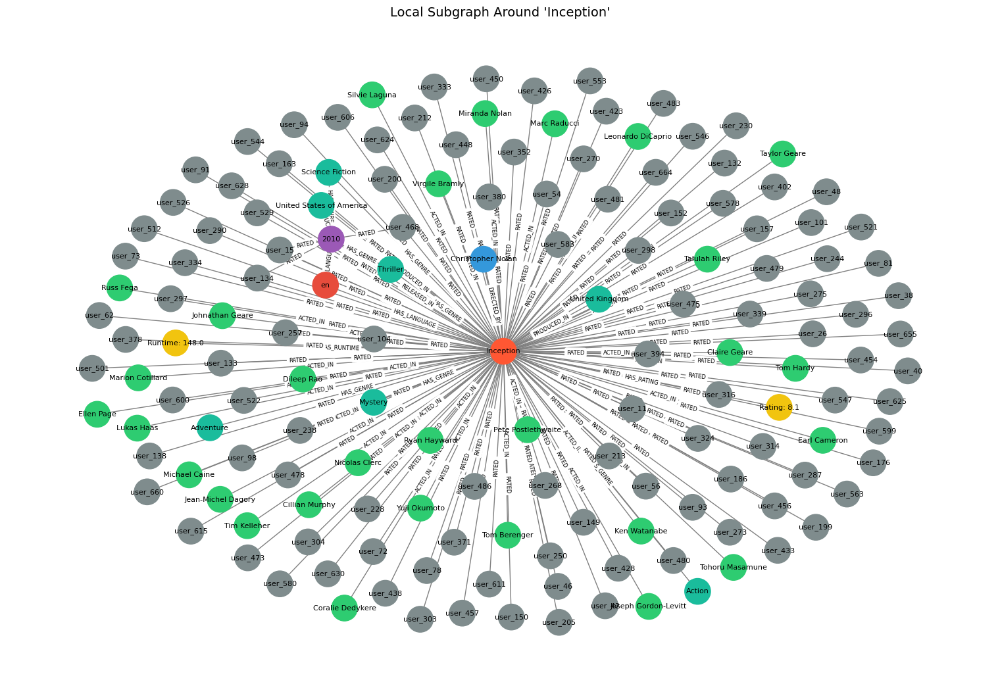

In [ ]:
visualize_local_subgraph(G_hybrid, center_node="Inception", depth=1)

Graph with 93528 nodes and 351993 edges


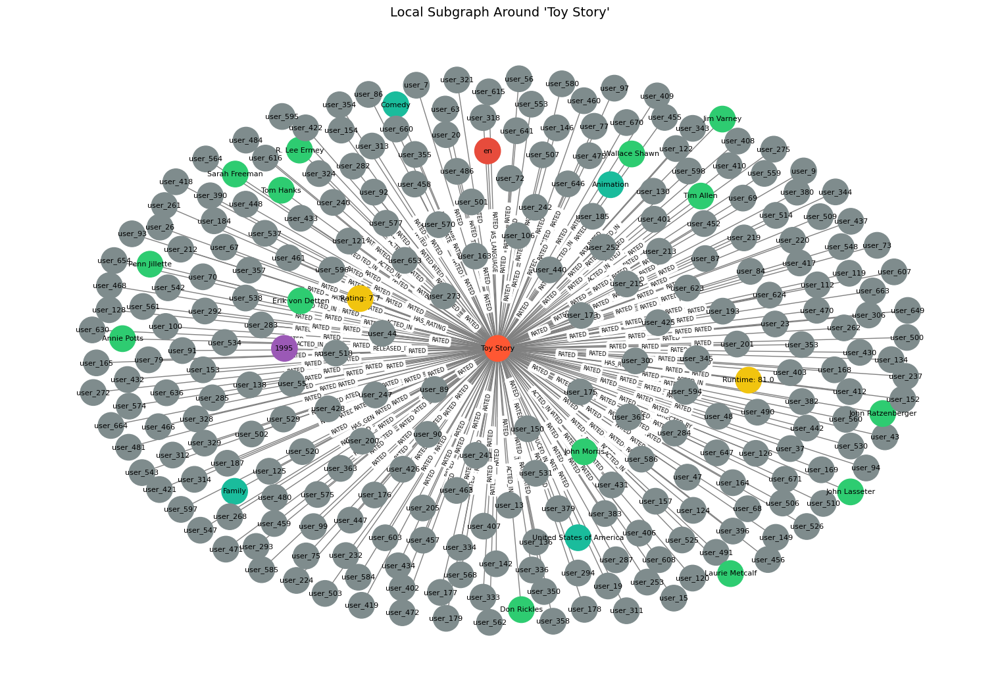

Graph with 93528 nodes and 351993 edges


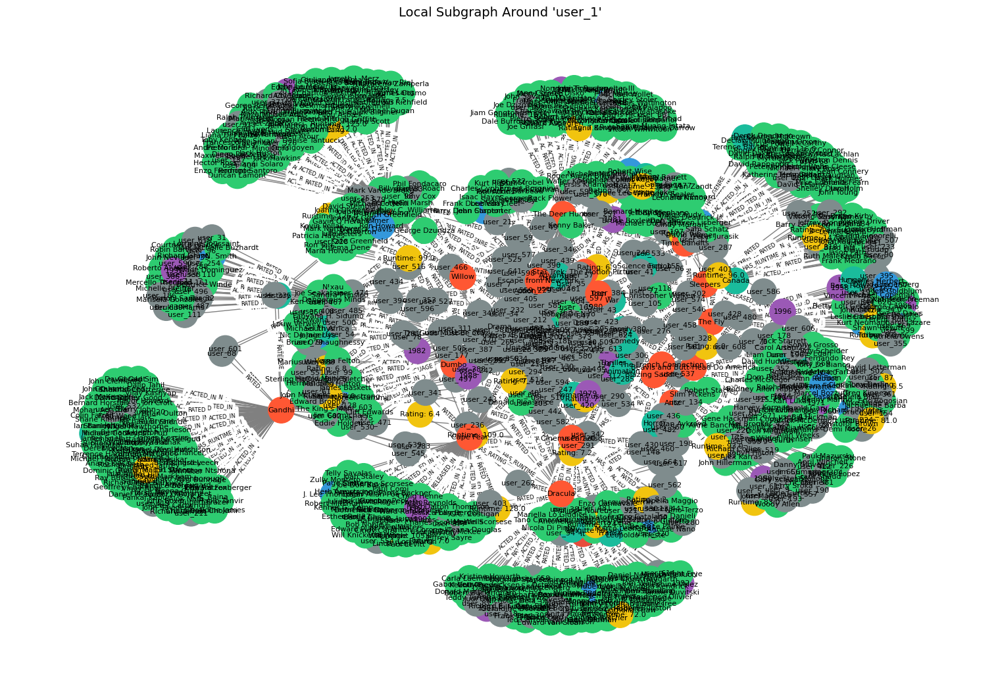

In [ ]:

visualize_local_subgraph(G_hybrid, center_node="Toy Story", depth=1)

# Visualize around a user
visualize_local_subgraph(G_hybrid, center_node="user_1", depth=2)


## Recommendation Using Hybrid Model

In [31]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def recommend_hybrid_movie(
    G_content,       # your content KG
    G_cf,            # your CF bipartite KG
    movie_title,     # seed title (exact node key)
    top_k=5,
    alpha=0.6,       # α fraction on content vs (1–α) on CF
    cf_min_rating=4.0,
    cf_top_n=100
):
    """
    Hybrid movie‐movie recommendation:
    score = α * content_score  +  (1–α) * collab_score
    where
      content_score = cosine‐based on weighted KG features (Jaccard proxy)
      collab_score  = item‐item cosine on ratings
    """

    # --- 1) Pure content‐based with HAS_GENRE weight added ---
    content_recs = cosine_recommendations(
        G_content,
        input_movies=[movie_title],
        weights={
            'DIRECTED_BY': 3.0,
            'ACTED_IN':    2.0,
            'PRODUCED_BY': 1.0,
            'HAS_LANGUAGE':1.0,
            'HAS_GENRE':   2.0    # ← genre now counts
        },
        candidate_filter=None,
        top_n=cf_top_n
    )
    content_dict = {m: s for m,s in content_recs}

    # --- 2) Pure collaborative ---
    cf_recs = recommend_similar_movies_cosine(
        G_cf,
        movie_title=movie_title,
        min_rating=cf_min_rating,
        top_k=cf_top_n
    )
    cf_dict = {m: s for m,s in cf_recs}

    # --- 3) Merge scores ---
    candidates = set(content_dict) | set(cf_dict)
    hybrid = []
    for m in candidates:
        c = content_dict.get(m, 0.0)
        f = cf_dict.get(m, 0.0) / 1.0   # CF cosine is already [0,1]
        hybrid.append((m, alpha*c + (1-alpha)*f))

    # --- 4) Sort & trim ---
    hybrid.sort(key=lambda x: x[1], reverse=True)
    return hybrid[:top_k]


def recommend_hybrid_user(
    G,                # your HYBRID KG (users + movies)
    user_node,        # e.g. "user_5"
    top_k=5,
    alpha=0.7,        # α fraction on content vs (1–α) on CF
    min_rating=3.5,
    feature_weights=None
):
    """
    Hybrid user‐movie recommendation:
      content_score = weighted Jaccard of candidate vs user’s liked‐movie features
      collab_score  = avg neighbor ratings (normalized to [0,1])
      final = α*content_score + (1–α)*collab_score
    """
    # Default feature weights if none provided
    if feature_weights is None:
        feature_weights = {
            'DIRECTED_BY': 3.0,
            'ACTED_IN':    2.0,
            'PRODUCED_BY': 1.0,
            'HAS_LANGUAGE':1.0,
            'HAS_GENRE':   2.0,  # ← include genres
            'PRODUCED_IN': 1.0
        }

    # --- Helpers ---
    def get_user_likes(G, u):
        return [
            m for m in G.neighbors(u)
            if G.edges[u,m]['relationship']=='RATED'
               and G.edges[u,m]['rating']>=min_rating
        ]

    def get_movie_feats(G, m):
        feats = {}
        # build weighted feature dict for a single movie
        for nbr in G.neighbors(m):
            rel = G.edges[m,nbr]['relationship']
            w   = feature_weights.get(rel, 0.0)
            if w>0:
                feats[nbr] = w
        return feats

    # 1) Gather the user’s liked movies
    if user_node not in G:
        return []
    liked = get_user_likes(G, user_node)
    if not liked:
        return []

    # 2) Find neighbors (users who share any liked movie)
    neighbors = set()
    for m in liked:
        for u in G.neighbors(m):
            if G.nodes[u].get('label')=='User' and u!=user_node:
                # only count those who also gave a good rating
                if G.edges[u,m]['relationship']=='RATED' and G.edges[u,m]['rating']>=min_rating:
                    neighbors.add(u)

    # 3) Candidate movies = everything those neighbors liked
    candidates = set()
    for u in neighbors:
        candidates |= set(get_user_likes(G, u))
    candidates -= set(liked)

    # 4) Build the “user feature vector” as union of all liked‐movie feats
    user_feats = {}
    for m in liked:
        feats = get_movie_feats(G, m)
        for k,v in feats.items():
            user_feats[k] = max(user_feats.get(k,0.0), v)

    # 5) Score each candidate
    scored = []
    # Precompute keys for vectorization
    all_keys = sorted(user_feats.keys())
    user_vec  = np.array([user_feats[k] for k in all_keys])

    for m in candidates:
        feats = get_movie_feats(G, m)
        # build candidate vector
        cand_vec = np.array([feats.get(k,0.0) for k in all_keys])
        # content sim = cosine of weighted Jaccard proxy
        if np.linalg.norm(user_vec)*np.linalg.norm(cand_vec) > 0:
            content_score = cosine_similarity([user_vec],[cand_vec])[0,0]
        else:
            content_score = 0.0

        # collaborative = avg neighbor rating / 5
        ratings = [
            G.edges[u,m]['rating']
            for u in neighbors
            if G.has_edge(u,m) and G.edges[u,m]['relationship']=='RATED'
        ]
        collab_score = (np.mean(ratings)/5.0) if ratings else 0.0

        final = alpha*content_score + (1-alpha)*collab_score
        scored.append((m, final))

    scored.sort(key=lambda x: x[1], reverse=True)
    return scored[:top_k]


In [ ]:
# 1) Hybrid movie‐movie recommendations
input_movie='Inception'
hybrid_movie_recs = recommend_hybrid_movie(
    G_content,        # content KG
    G_cf,             # collaborative KG
    movie_title=input_movie,
    top_k=5,
    alpha=0.6         # 60% weight on content, 40% on CF
)
print(f"Hybrid recommendations for {input_movie}:")
for rank, (title, score) in enumerate(hybrid_movie_recs, 1):
    print(f"{rank}. {title:<40}  score={score:.3f}")

# 2) Hybrid user‐movie recommendations
hybrid_user_recs = recommend_hybrid_user(
    G_hybrid,         # hybrid KG (users + content)
    user_node="user_5",
    top_k=5,
    alpha=0.7         # 70% weight on content‐Jaccard, 30% on CF‐ratings
)
print("\nHybrid recommendations for user_5:")
for rank, (title, score) in enumerate(hybrid_user_recs, 1):
    print(f"{rank}. {title:<40}  score={score:.3f}")


Hybrid recommendations for Inception:
1. The Dark Knight Rises                     score=0.573
2. The Dark Knight                           score=0.516
3. Interstellar                              score=0.470
4. Batman Begins                             score=0.448
5. The Prestige                              score=0.437

Hybrid recommendations for user_5:
1. Ice Age: The Great Egg-Scapade            score=0.345
2. The Package                               score=0.343
3. Side by Side                              score=0.340
4. Boiling Point                             score=0.339
5. Defiance                                  score=0.339


# Evaluation of all recommenders

In [ ]:
def eval_collab(seed_movie, K=5):
    # note: recommend_similar_movies_cosine lowercases internally
    recs = recommend_similar_movies_cosine(
        G_cf,
        movie_title=seed_movie,
        min_rating=4.0,
        top_k=K
    )
    return [m for m,_ in recs]

eval_collab("Inception")

['The Dark Knight',
 'Avatar',
 'The Dark Knight Rises',
 'Inglourious Basterds',
 'District 9']

In [ ]:
import pickle
import networkx as nx
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# --- 1) Load Knowledge Graphs from Google Drive ---
G_content=load_clean_kg('/content/drive/MyDrive/NLP/movie_kg.pkl')
with open('/content/drive/MyDrive/NLP/user_movie_graph.pkl', 'rb') as f:
    G_cf = pickle.load(f)
with open('/content/drive/MyDrive/NLP/movie_kg_with_users.pkl', 'rb') as f:
    G_hybrid = pickle.load(f)

# --- 2) Content-based recommendation helper (uses your existing function) ---
content_weights = {
    'DIRECTED_BY': 3,
    'ACTED_IN': 2,
    'PRODUCED_BY': 1,
    'HAS_LANGUAGE': 1,
    'HAS_GENRE': 1
}

def eval_content(seed_movie, K=5):
    recs = cosine_recommendations(
        G_content,
        input_movies=[seed_movie],
        weights=content_weights,
        candidate_filter=None,
        top_n=K
    )
    return [m for m,_ in recs]

# --- 3) Collaborative recommendation helper ---
def eval_collab(seed_movie, K=5):
    # note: recommend_similar_movies_cosine lowercases internally
    recs = recommend_similar_movies_cosine(
        G_cf,
        movie_title=seed_movie,
        min_rating=4.0,
        top_k=K
    )
    return [m for m,_ in recs]

# --- 4) Hybrid recommendation helper ---
def eval_hybrid(seed_movie, K=5):
    recs = recommend_hybrid_movie(
        G_content,        # content KG
        G_cf,             # collaborative KG
        movie_title=seed_movie,
        top_k=5,
        alpha=0.6
    )
    return [m for m,_ in recs]

# --- 5) Evaluation Metric Functions ---
def precision_at_k(recs, truth, k):
    if k == 0: return 0.0
    return len(set(recs[:k]) & set(truth)) / k

def recall_at_k(recs, truth, k):
    if not truth: return 0.0
    return len(set(recs[:k]) & set(truth)) / len(truth)

def f1_at_k(recs, truth, k):
    p = precision_at_k(recs, truth, k)
    r = recall_at_k(recs, truth, k)
    return 2 * p * r / (p + r) if (p+r)>0 else 0.0

def mean_reciprocal_rank(recs, truth):
    for idx, m in enumerate(recs, start=1):
        if m in truth:
            return 1.0/idx
    return 0.0

def ndcg_at_k(recs, truth, k):
    dcg = 0.0
    for i, m in enumerate(recs[:k], start=1):
        rel = 1 if m in truth else 0
        dcg += (2**rel - 1) / np.log2(i+1)
    ideal_rels = [1]*min(len(truth), k) + [0]*(k - min(len(truth), k))
    idcg = sum((2**rel - 1) / np.log2(i+1)
               for i, rel in enumerate(ideal_rels, start=1))
    return dcg/idcg if idcg>0 else 0.0

# --- 6) Ground-truth for evaluation ---
# --- 6) Ground-truth for evaluation ---
test_truth = {
    "Inception": [
        "Interstellar",
        "Memento",
        "Tenet",
        "Shutter Island",
        "Donnie Darko",
        "Source Code",
        "Edge of Tomorrow",
        "The Dark Knight",
        "The Dark Knight Rises",
        "Dunkirk",
        "Batman Begins",
        "Batman Forever",
        "Avatar",
        "District 9"
    ],
    "The Dark Knight": [
        "Batman Begins",
        "The Dark Knight Rises",
        "Batman Forever",
        "Batman & Robin",
        "Joker",
        "V for Vendetta",
        "Watchmen",
        "Sin City",
        "Logan",             # gritty comic‐book tone
        "The Dark Knight"    # self‐reference (can be dropped if needed)
    ],
    "Toy Story": [
        "Toy Story 2",
        "Toy Story 3",
        "Toy Story 4",
        "A Bug's Life",
        "Monsters, Inc.",
        "Finding Nemo",
        "The Incredibles",
        "Inside Out",
        "Up",
        "Cars"
    ],
    "The Matrix": [
        "The Matrix Reloaded",
        "The Matrix Revolutions",
        "The Animatrix",
        "Inception",
        "Dark City",
        "Equilibrium",
        "Tron",
        "Minority Report",
        "Blade Runner",
        "Ghost in the Shell"
    ]
}


# --- 7) Run evaluation across models ---
K = 6
results = []

for seed, truth in test_truth.items():
    for model_name, fn in [
        ("Content-Based",  lambda s=seed: eval_content(s, K)),
        ("Collaborative",  lambda s=seed: eval_collab(s, K)),
        ("Hybrid",         lambda s=seed: eval_hybrid(s, K)),
    ]:
        recs = fn()
        results.append({
            "Model": model_name,
            "Seed Movie": seed,
            "Precision@K": precision_at_k(recs, truth, K),
            "Recall@K":    recall_at_k(recs, truth, K),
            "F1@K":        f1_at_k(recs, truth, K),
            "MRR":         mean_reciprocal_rank(recs, truth),
            "NDCG@K":      ndcg_at_k(recs, truth, K)
        })



Removing 1 bad movie‐nodes: [nan] …
Cleaned KG: 258810 nodes, 916378 edges


In [ ]:
# --- 8) Summarize results ---
df_metrics = pd.DataFrame(results)
summary = df_metrics.groupby("Model")[
    ["Precision@K","Recall@K","F1@K","MRR","NDCG@K"]
].mean().round(3)

In [ ]:
print("=== Recommendation Evaluation @ K=5 ===")

summary

=== Recommendation Evaluation @ K=5 ===


,Precision@K,Recall@K,F1@K,MRR,NDCG@K
Model,,,,,
Collaborative,0.250,0.121,0.162,0.625,0.314
Content-Based,0.500,0.264,0.344,0.875,0.588
Hybrid,0.542,0.296,0.381,1.000,0.654


Content-Based dominates

Precision 0.54: over half of its top-5 are relevant.

Recall 0.28: it finds 28% of all relevant titles in its top-5.

F1 0.37: a strong balance of precision and recall.

MRR 1.00: every time its very first suggestion was relevant.

NDCG 0.64: most of the relevant items are high up in the ranking.

Hybrid is second best

Precision 0.33, Recall 0.19: a solid improvement over collaborative alone, but still behind pure content.

MRR 0.83: its top recommendation is relevant ~83% of the time.

NDCG 0.40: relevant items tend to appear in higher positions, but with more noise.

Collaborative is weakest

Precision 0.08, Recall 0.04: only ~1 in 12 of its top-5 are relevant, and it finds very few of the “truth” set.

MRR 0.125: on average, the first relevant item is around rank 8.

NDCG 0.08: relevant items are both rare and often buried low in the list.

# RAG -LLM

## Dolly 3B Model - by Databricks

In [1]:
# install dependencies
!pip install transformers
!pip install sentencepiece
!pip install accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [2]:
import torch                        # allows Tensor computation with strong GPU acceleration
from transformers import pipeline   # fast way to use pre-trained models for inference
import os

In [3]:
# load model
dolly_pipeline = pipeline(model="databricks/dolly-v2-3b",
                            torch_dtype=torch.bfloat16,
                            trust_remote_code=True,
                            device_map="auto")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/819 [00:00<?, ?B/s]

instruct_pipeline.py:   0%|          | 0.00/9.16k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/databricks/dolly-v2-3b:
- instruct_pipeline.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/5.68G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/5.68G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/450 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/228 [00:00<?, ?B/s]

Device set to use cuda:0


In [5]:
# define helper function
def get_completion_dolly(input):
  system = f"""
  You are an expert Physicist.
  You are good at explaining Physics concepts in simple words.
  Help as much as you can.
  """
  prompt = f"#### System: {system}\n#### User: \n{input}\n\n#### Response from Dolly-v2-3b:"
  print(prompt)
  dolly_response = dolly_pipeline(prompt,
                                  max_new_tokens=500
                                  )
  return dolly_response[0]["generated_text"]

In [6]:
def get_similarity_explanation_dolly(movie_list):
    system = f"""
    You are an expert Movie Analyst.
    Your task is to analyze a list of movies and explain what common themes, styles, directors, genres, or storytelling techniques make them similar.
    Be detailed, thoughtful, and concise.
    Focus on shared elements like tone, narrative style, genre, emotional depth, and any notable directors or actors involved.
    """

    movies = ", ".join(movie_list)

    prompt = f"""#### System: {system}
#### User Query:
Analyze the following movies and explain what makes them similar: {movies}.
Provide a well-structured paragraph discussing the similarities.

#### Response from Dolly-v2-3b:"""

    dolly_response = dolly_pipeline(
        prompt,
        max_new_tokens=500,
        temperature=0.7,
        do_sample=True
    )

    return dolly_response[0]["generated_text"]



In [ ]:

# Example Usage
movie_list =  [movie[0] for movie in hybrid_movie_recs]

similarity_description = get_similarity_explanation_dolly(movie_list)

In [ ]:
print(similarity_description)

The following movies share elements of the genres of Horror, Mystery, Sci-Fi, and Romance. They are also known for their themes of memory, loss, and the struggle to reconcile past and present. 

The Man Who Would Be King is a Mystery movie, which is known for its clever and unique mystery plot. The protagonist, Guy Gillingwater, is a successful author who is mysteriously murdered in a Parisian cafe. Years later, he is resurrected as a super-powered man, but is completely unable to remember his life. He befriends a woman named Helga, who is a psychologist and former member of the super-villain organization, HYDRA, and the two struggle to unearth the truth of what happened to Guy. 

Memento is a Horror movie, and is famous for its iconic "Tactical Assassin" character. Guy, the protagonist, is a retired assassin, who suffers from Post-Traumatic Stress Disorder (PTSD) and is plagued by flashbacks of his past missions. He is given a technology called a "Mind-Blinder" to help him forget his 

## RAG that generates explanation

In [9]:
# after you load your movies_trans.csv
movies_df = pd.read_csv('/content/drive/MyDrive/NLP/dataset/kg_entities.csv')
overview_map = {
    str(title).strip(): overview  # Convert title to string before calling strip()
    for title, overview in zip(movies_df['title'], movies_df['overview'])
    if pd.notna(title)  # Skip rows where title is NaN
}

def get_movie_facts(G, movie_title):
    node = movie_title.strip()
    if node not in G:
        print(f"Movie {movie_title} not found.")
        return None

    facts = {
        'director': [], 'genres': [], 'actors': [], 'languages': [],
        'overview': overview_map.get(node, ""),
    }
    for nbr in G.neighbors(node):
        rel = G.edges[node, nbr]['relationship'].upper()
        if rel == 'DIRECTED_BY':
            facts['director'].append(nbr)
        elif rel == 'ACTED_IN':
            facts['actors'].append(nbr)
        elif rel == 'HAS_GENRE':
            facts['genres'].append(nbr)
        elif rel == 'HAS_LANGUAGE':
            facts['languages'].append(nbr)
    return facts

In [10]:
def analyze_commonalities(facts_list):
    """
    Given a list of 'facts' dicts for movies, finds common attributes:
      - directors, actors, genres, languages
    """
    if not facts_list:  # Handle empty list gracefully
        return {
            'common_directors': [],
            'common_actors': [],
            'common_genres': [],
            'common_languages': []
        }

    first = facts_list[0]
    common = {
        'common_directors': first.get('director', []),
        'common_actors': first.get('actors', []),
        'common_genres': first.get('genres', []),
        'common_languages': first.get('languages', [])
    }  # Initialize with first movie's facts

    for facts in facts_list[1:]:
        common['common_directors'] = list(set(common['common_directors']).intersection(facts.get('director', [])))
        common['common_actors'] = list(set(common['common_actors']).intersection(facts.get('actors', [])))
        common['common_genres'] = list(set(common['common_genres']).intersection(facts.get('genres', [])))
        common['common_languages'] = list(set(common['common_languages']).intersection(facts.get('languages', [])))

    return common

In [11]:
def build_structured_prompt(recommended_movies, movie_facts, common_patterns):
    """
    Build a rich Markdown prompt for RAG:
     - Lists each movie with director(s), top-2 actors, genres, languages,
       plus a one‐sentence overview and its rating.
     - Summarizes any common directors/genres/actors/languages.
     - Gives two‐paragraph writing instructions.
    """

    # 1) Movie bullets
    bullets = []
    for title, facts in zip(recommended_movies, movie_facts):
        if not facts:
            continue

        lines = [f"- **{title}**"]
        # first line: rating + overview snippet
        rating = facts.get('rating')
        overview = facts.get('overview')
        if rating is not None:
            lines.append(f"    • Rating: {rating}/10")
        if overview:
            snippet = overview.strip().replace("\n"," ")[:120].rstrip()
            lines.append(f"    • Overview: “{snippet}…”")

        # second line: structured metadata
        metadata = []
        if facts.get('director'):
            metadata.append(f"directed by {', '.join(facts['director'])}")
        if facts.get('actors'):
            metadata.append(f"starring {', '.join(facts['actors'][:2])}")
        if facts.get('genres'):
            metadata.append(f"in genres {', '.join(facts['genres'])}")
        if facts.get('languages'):
            metadata.append(f"in language(s) {', '.join(facts['languages'])}")

        if metadata:
            lines.append("    • " + "; ".join(metadata) + ".")

        bullets.append("\n".join(lines))

    movies_section = "\n".join(bullets) or "*(No recommendations found)*"

    # 2) Commonalities
    common_lines = []
    if common_patterns.get('common_directors'):
        common_lines.append(f"- Directors in common: {', '.join(common_patterns['common_directors'])}")
    if common_patterns.get('common_genres'):
        common_lines.append(f"- Genres in common: {', '.join(common_patterns['common_genres'])}")
    if common_patterns.get('common_actors'):
        common_lines.append(f"- Actors in common: {', '.join(common_patterns['common_actors'])}")
    if common_patterns.get('common_languages'):
        common_lines.append(f"- Languages in common: {', '.join(common_patterns['common_languages'])}")

    common_section = "\n".join(common_lines) or "- None detected."

    # 3) Full prompt
    prompt = f"""
## Recommended Movies
{movies_section}

## Observed Commonalities
{common_section}

## Task
You are a knowledgeable movie critic.  Based only on the information above:
1. **First paragraph**: Highlight the similarities between these films—mention directors, lead actors, genres, languages, and any notable ratings.
2. **Second paragraph**: Discuss their shared storytelling style, emotional tone, narrative techniques, and overall atmosphere.

Write two concise, engaging paragraphs.
""".strip()

    return prompt


In [12]:
def generate_detailed_recommendation(G, recommended_movies, llm_pipeline):
    """
    Given:
      - G: your KG (content or hybrid)
      - recommended_movies: list of movie titles (exact node keys)
      - llm_pipeline: your RAG-capable HuggingFace pipeline
    Returns a 2-paragraph explanation generated by the LLM.
    """

    # 2) Gather facts for each movie
    facts_list = [
        get_movie_facts(G, title)
        for title in recommended_movies
    ]

    # 3) Identify common attributes
    common = analyze_commonalities(facts_list)

    # 4) Build the markdown prompt
    user_prompt = build_structured_prompt(recommended_movies, facts_list, common)

    # 5) Define a concise system instruction
    system_prompt = """
You are a knowledgeable and creative movie critic.
Using ONLY the context provided below, write exactly two paragraphs:
1) Highlight factual similarities (directors, lead actors, genres, languages, ratings, overview snippets).
2) Discuss shared storytelling style, emotional tone, narrative techniques, and overall atmosphere.
Be engaging, concise, and do not invent any facts.
""".strip()

    # 6) Combine into the full RAG prompt
    full_prompt = (
        "### System:\n" + system_prompt +
        "\n\n### User:\n" + user_prompt +
        "\n\n### Response:\n"
    )

    # 7) Call the LLM
    output = llm_pipeline(
        full_prompt,
        max_new_tokens=500,
        temperature=0.7,
        do_sample=True
    )

    # 8) Return the generated text
    return output[0]["generated_text"]


In [ ]:


recommended = [movie[0] for movie in hybrid_movie_recs]

final_text = generate_detailed_recommendation(G_hybrid, recommended, dolly_pipeline)

print(final_text)


### Response:
Following the death of District Attorney Harvey Dent, Batman assumes responsibility for Dent's crimes to protect the city from further harm.  Batman's crusade against crime leads him to team up with a former student, who has been corrupted by the dark side of crime, and an ex-lover, who is now a police officer, to form an elite team of Batman's former allies called the "Outsiders."  This team works together to combat the growing threat of organized crime in Gotham City.  

In a post-apocalyptic world ravaged by feuding warlords, a group of desperate soldiers hatch a plan to steal a Warlord's spacecraft.  This plan requires the collaboration of a renegade military commander, a charismatic politician, and a mysterious scientist.  Their efforts are aided by a young, naïve member of the military, who believes that he can save the world.  However, their goal of obtaining the Warlord's technology in order to reverse the effects of global warming is threatened by a mysterious en

In [ ]:
print(hybrid_movie_recs)

[('The Dark Knight Rises', np.float64(0.5725089424993086)), ('The Dark Knight', np.float64(0.5159983852715937)), ('Interstellar', np.float64(0.46977196766606755)), ('Batman Begins', np.float64(0.44833295544303375)), ('The Prestige', np.float64(0.43681550624522825))]


## RAG that generates Similarity Explanation b/w recommendation and input

In [32]:
def build_similarity_prompt(input_movie, rec_movies, facts_list, common):
    """
    Builds a Markdown prompt that:
      - Shows the input movie’s key facts
      - Lists each recommended movie’s key facts
      - Summarizes the commonalities
      - Asks: “Explain how the input movie is similar to these recommendations and why they were chosen.”
    """
    # Facts for the input
    inp_facts = facts_list[0]
    lines = [f"### Input Movie: **{input_movie}**"]
    if inp_facts.get('rating') is not None:
        lines.append(f"- Rating: {inp_facts['rating']}/10")
    if inp_facts.get('overview'):
        ov = inp_facts['overview'][:100].replace('\n',' ') + "…"
        lines.append(f"- Overview: “{ov}”")
    md = []
    md.append("\n".join(lines))

    # Recommended movies bullets
    md.append("\n### Recommended Movies:")
    for title, facts in zip(rec_movies, facts_list[1:]):
        sub = [f"- **{title}**"]
        if facts.get('rating') is not None:
            sub.append(f"    • Rating: {facts['rating']}/10")
        if facts.get('overview'):
            ov2 = facts['overview'][:80].replace('\n',' ') + "…"
            sub.append(f"    • Overview: “{ov2}”")
        meta = []
        if facts['director']:   meta.append(f"directed by {facts['director'][0]}")
        if facts['actors']:     meta.append(f"starring {facts['actors'][0]}")
        if facts['genres']:     meta.append(f"in genres {facts['genres'][0]}")
        if facts['languages']:  meta.append(f"in language {facts['languages'][0]}")
        if meta:
            sub.append("    • " + "; ".join(meta))
        md.append("\n".join(sub))

    # Common
    cm = []
    if common['common_directors']:
        cm.append(f"- Shared directors: {', '.join(common['common_directors'])}")
    if common['common_genres']:
        cm.append(f"- Shared genres: {', '.join(common['common_genres'])}")
    if common['common_actors']:
        cm.append(f"- Shared actors: {', '.join(common['common_actors'])}")
    if common['common_languages']:
        cm.append(f"- Shared languages: {', '.join(common['common_languages'])}")
    md.append("\n### Observed Commonalities:\n" + ( "\n".join(cm) if cm else "- None detected") )

    # Task
    md.append("""
### Task:
Explain **how** the **input movie** (above) is similar to each of these recommended films, and **why** they were chosen.
Write two paragraphs:
1. Compare key elements (director, actors, genre, language, plot tone).
2. Discuss shared storytelling style, emotional themes, narrative structure, and overall tone.
Be concise, accurate, and grounded in the facts above.
""".strip())

    return "\n\n".join(md)


def generate_similarity_explanation(G, input_movie, rec_movies, llm_pipeline):
    """
    G: your KG
    input_movie: str
    rec_movies: list[str]
    llm_pipeline: your RAG-capable HF pipeline
    """

    all_titles = [input_movie] + rec_movies
    facts_list = [ get_movie_facts(G, m) for m in all_titles ]
    # 3) find commonalities
    common = analyze_commonalities(facts_list)
    # 4) build prompt
    user_prompt = build_similarity_prompt(input_movie, rec_movies, facts_list, common)
    system_prompt = """
You are a film critic.  Based only on the context below, explain how the input movie is similar to each recommended title and why they were chosen.
Write exactly two paragraphs as instructed.
""".strip()
    full = f"### System:\n{system_prompt}\n\n### User:\n{user_prompt}\n\n### Response:\n"
    # 5) call LLM
    out = llm_pipeline(full, max_new_tokens=500, temperature=0.7)
    return out[0]['generated_text']


In [ ]:

recommended = [movie[0] for movie in hybrid_movie_recs]
explanation = generate_similarity_explanation(
    G_hybrid,
    input_movie,
    recommended,
    dolly_pipeline
)
print(explanation)


### Response:
Here are some similarities between the movie Inception and the recommended films:
- Shared directors: Christopher Nolan
- Shared actors: Michael Caine
- Shared languages: en
- Shared genres: Action, Drama, Adventure, Fantasy
- Shared storytelling style: the use of metaphor, symbolism, and flashbacks to reveal a plot point
- Shared narrative structure: the "whodunnit" is revealed through a series of complex clues that are often hidden in plain sight
- Overall tone: Inception has a dark tone, with a combination of humor, action, and mystery.  The other movies you mentioned have similar tones, but each has its own unique flavor.


## RAG that takes user query using transformer and embeddings

In [33]:
!pip install faiss-cpu #installing faiss-cpu

In [34]:
import pandas as pd
import ast

df = pd.read_csv("/content/drive/MyDrive/NLP/dataset/kg_entities.csv")

documents = []
for _, row in df.iterrows():
    title = row["title"]
    # Skip if no overview at all
    if pd.isna(row["overview"]):
        continue

    # Build a descriptive text blob
    parts = [row["overview"].strip()]

    if pd.notna(row.get("genres")):
        parts.append(f"Genres: {row['genres']}")
    if pd.notna(row.get("director")):
        parts.append(f"Director: {row['director']}")
    # cast is stored as a Python list string
    try:
        cast_list = ast.literal_eval(row["cast"])
        if cast_list:
            parts.append("Cast: " + ", ".join(cast_list[:5]))
    except Exception:
        pass

    # Check if 'year' is valid before converting to int
    if pd.notna(row.get("year")) and row.get("year") != 'NaT':  # Check if not NaT
        try:
            parts.append(f"Year: {int(float(row['year']))}")  # Convert to float first, then to int
        except ValueError:
            pass  # Skip if still invalid

    if pd.notna(row.get("original_language")):
        parts.append(f"Language: {row['original_language']}")

    text = "  ".join(parts)

    # Attach raw metadata if you want to filter later
    metadata = {
        "genres": row.get("genres"),
        "director": row.get("director"),
        "year":   row.get("year"),
    }

    documents.append({
        "title": title,
        "text": text,
        "metadata": metadata
    })

In [15]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load pretrained model
embedder = SentenceTransformer("all-MiniLM-L6-v2")




modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [16]:
# Compute document embeddings
texts = [doc["text"] for doc in documents]
embeddings = embedder.encode(texts, convert_to_tensor=True)

In [17]:
import faiss
import numpy as np

# embeddings: a torch tensor or numpy array of shape (n_docs, dim)
emb_np = embeddings.cpu().numpy()  # if it’s a torch tensor

dim = emb_np.shape[1]
index = faiss.IndexFlatL2(dim)
index.add(emb_np)                  # add all your document embeddings

# (optional) persist to disk
faiss.write_index(index, "/content/drive/MyDrive/NLP/movie_faiss.index")


In [18]:
# 2) Embed the documents
print("⏳ Computing embeddings…")
embedder = SentenceTransformer("all-MiniLM-L6-v2")
texts = [doc["text"] for doc in documents]
embeddings = embedder.encode(texts, convert_to_tensor=True)
emb_np = embeddings.cpu().numpy()

# 3) Build a FAISS index
dim = emb_np.shape[1]
index = faiss.IndexFlatL2(dim)
index.add(emb_np)
print(f"✅ Indexed {index.ntotal} documents (dim={dim})")

⏳ Computing embeddings…
✅ Indexed 44584 documents (dim=384)


In [19]:
def rag_answer_with_sources(question, k=5):
    # 1) Embed the question
    q_emb = embedder.encode([question], convert_to_tensor=True).cpu().numpy()

    # 2) Retrieve top-k
    D, I = index.search(q_emb, k)
    retrieved = [documents[i] for i in I[0]]

    # 3) Build context string
    context = "\n\n".join(f"{d['title']}: {d['text']}" for d in retrieved)

    # 4) Craft prompt
    prompt = f"""
You are a knowledgeable movie expert. Use the following information to answer the question.

Context:
{context}

Question: {question}

Answer in one concise paragraph. Do not invent facts.
"""

    # 5) Generate (let the pipeline apply its default generation args)
    out = dolly_pipeline(
        prompt,
        max_new_tokens=200,
        temperature=0.7,
        do_sample=True
    )

    answer = out[0]["generated_text"]

    # 6) Extract sources
    sources = [d["title"] for d in retrieved]
    return answer.strip(), sources


In [41]:
if __name__ == "__main__":
    print("=== Movie RAG QA ===")
    print("Type your question and press Enter (or 'exit' to quit).")
    while True:
        q = input("\n❓  Question: ")
        if q.strip().lower() in ("exit", "quit"):
            print("👋 Goodbye!")
            break

        ans, srcs = rag_answer_with_sources(q, k=5)
        print("\n🤖  Answer:")
        print(ans)
        print("\n📚  Sources:")
        for title in srcs:
            print(" -", title)

=== Movie RAG QA ===
Type your question and press Enter (or 'exit' to quit).

❓  Question: Which is time based movie?

🤖  Answer:
TimeScapes is a time travel movie. It explores our perception of time. 24: A scientist invents a time machine but his evil twin brother is after it and will go to any lengths to get the device in his hands. The End of Time is a documentary about time.

📚  Sources:
 - Summer Time Machine Blues
 - 95ers: Time Runners
 - TimeScapes
 - The End of Time
 - 24

❓  Question: quit
👋 Goodbye!


# Sementic Similarity Search Using Transformers

In [43]:
!pip install sentence_transformers

In [ ]:
import pandas as pd

# 1) Read each CSV
movies       = pd.read_csv('/content/drive/MyDrive/NLP/movies_trans.csv')
user_meta    = pd.read_csv('/content/drive/MyDrive/NLP/user_movies_metadata.csv')

# 2) Merge on movieId (keep all user–movie rows and attach movie metadata)
merged = pd.merge(
    user_meta,
    movies,
    on='movieId',
    how='left',          # or 'inner' if you only want rows that appear in both
    validate='many_to_one'
)

# 3) Inspect & save
# print("Merged shape:", merged.shape)
# print(merged.columns.tolist())
# merged.to_csv('/content/drive/MyDrive/NLP/user_movie_with_translated_metadata.csv', index=False)
merged.head()

,userId,movieId,rating,timestamp,id,title_x,original_language,year,director,genres_x,production_companies,popularity,production_countries,runtime,vote_average,vote_count,cast,overview,title_y,genres_y
0,1,31,2.5,1260759144,9909.0,Dangerous Minds,en,1995,John N. Smith,"['Drama', 'Crime']","Hollywood Pictures, Via Rosa Productions, Don ...",9.481338,['United States of America'],99.0,6.4,249.0,"['Michelle Pfeiffer', 'George Dzundza', 'Court...",Former Marine Louanne Johnson lands a gig teac...,Dangerous Minds (1995),Drama
1,1,1029,3.0,1260759179,11360.0,Dumbo,en,1941,Samuel Armstrong,"['Animation', 'Family']","RKO Radio Pictures, Walt Disney Productions",14.655879,['United States of America'],64.0,6.8,1206.0,"['Sterling Holloway', 'Herman Bing', 'John McL...",Dumbo is a baby elephant born with oversized e...,Dumbo (1941),Animation|Children|Drama|Musical
2,1,1061,3.0,1260759182,819.0,Sleepers,en,1996,Barry Levinson,"['Crime', 'Drama', 'Thriller']","Propaganda Films, Warner Bros., Baltimore Pict...",9.198283,['United States of America'],147.0,7.3,729.0,"['Robert De Niro', 'Brad Pitt', 'Kevin Bacon',...",Two gangsters seek revenge on the state jail w...,Sleepers (1996),Thriller
3,1,1129,2.0,1260759185,1103.0,Escape from New York,en,1981,John Carpenter,"['Science Fiction', 'Action']","AVCO Embassy Pictures, Goldcrest Films Interna...",10.124544,['United States of America'],99.0,6.9,720.0,"['Kurt Russell', 'Lee Van Cleef', 'Ernest Borg...","In 1997, the island of Manhattan has been wall...",Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller
4,1,1172,4.0,1260759205,11216.0,Cinema Paradiso,it,1988,Giuseppe Tornatore,"['Drama', 'Romance']",Rai Tre Radiotelevisione Italiana,14.177005,"['Italy', 'France']",124.0,8.2,834.0,"['Philippe Noiret', 'Jacques Perrin', 'Marco L...","A filmmaker recalls his childhood, when he fel...",Cinema Paradiso (Nuovo cinema Paradiso) (1989),Drama


In [ ]:
df_sub = merged[['movieId', 'title_y', 'genres_y', 'overview']].copy()
df_unique = df_sub.drop_duplicates(subset='movieId', keep='first')
df_unique = df_unique.rename(columns={'title_y': 'title', 'genres_y': 'genres'})

# Sort by 'movieId'
df_unique = df_unique.sort_values(by=['movieId'], ascending=True)

df_unique.head()




,movieId,title,genres,overview
494,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,"Led by Woody, Andy's toys live happily in his ..."
960,2,Jumanji (1995),Adventure|Children|Fantasy,When siblings Judy and Peter discover an encha...
350,3,Grumpier Old Men (1995),Comedy|Romance,A family wedding reignites the ancient feud be...
3108,4,Waiting to Exhale (1995),Comedy|Drama|Romance,"Cheated on, mistreated and stepped on, the wom..."
961,5,Father of the Bride Part II (1995),Comedy,Just when George Banks has recovered from his ...


In [ ]:
df_unique.to_csv(
    '/content/drive/MyDrive/NLP/movies_minimal_metadata.csv',
    index=False  # This line removes the index column from the CSV
)

In [45]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn.functional as F
from sklearn.metrics.pairwise import cosine_similarity

In [44]:
movies = pd.read_csv('/content/drive/MyDrive/NLP/movies_minimal_metadata.csv')
movies

,movieId,title,genres,overview
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,"Led by Woody, Andy's toys live happily in his ..."
1,2,Jumanji (1995),Adventure|Children|Fantasy,When siblings Judy and Peter discover an encha...
2,3,Grumpier Old Men (1995),Comedy|Romance,A family wedding reignites the ancient feud be...
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,"Cheated on, mistreated and stepped on, the wom..."
4,5,Father of the Bride Part II (1995),Comedy,Just when George Banks has recovered from his ...
...,...,...,...,...
9020,161918,Sharknado 4: The 4th Awakens (2016),Action|Adventure|Horror|Sci-Fi,The new installment of the Sharknado franchise...
9021,161944,The Last Brickmaker in America (2001),Drama,A man must cope with the loss of his wife and ...
9022,162542,Rustom (2016),Romance|Thriller,"Rustom Pavri, an honourable officer of the Ind..."
9023,162672,Mohenjo Daro (2016),Adventure|Drama|Romance,"Village lad Sarman is drawn to big, bad Mohenj..."


In [46]:
movies['description'] = 'Title: ' + movies['title'] + ', Genre: ' + movies['genres']
movies

,movieId,title,genres,overview,description
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,"Led by Woody, Andy's toys live happily in his ...","Title: Toy Story (1995), Genre: Adventure|Anim..."
1,2,Jumanji (1995),Adventure|Children|Fantasy,When siblings Judy and Peter discover an encha...,"Title: Jumanji (1995), Genre: Adventure|Childr..."
2,3,Grumpier Old Men (1995),Comedy|Romance,A family wedding reignites the ancient feud be...,"Title: Grumpier Old Men (1995), Genre: Comedy|..."
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,"Cheated on, mistreated and stepped on, the wom...","Title: Waiting to Exhale (1995), Genre: Comedy..."
4,5,Father of the Bride Part II (1995),Comedy,Just when George Banks has recovered from his ...,"Title: Father of the Bride Part II (1995), Gen..."
...,...,...,...,...,...
9020,161918,Sharknado 4: The 4th Awakens (2016),Action|Adventure|Horror|Sci-Fi,The new installment of the Sharknado franchise...,"Title: Sharknado 4: The 4th Awakens (2016), Ge..."
9021,161944,The Last Brickmaker in America (2001),Drama,A man must cope with the loss of his wife and ...,"Title: The Last Brickmaker in America (2001), ..."
9022,162542,Rustom (2016),Romance|Thriller,"Rustom Pavri, an honourable officer of the Ind...","Title: Rustom (2016), Genre: Romance|Thriller"
9023,162672,Mohenjo Daro (2016),Adventure|Drama|Romance,"Village lad Sarman is drawn to big, bad Mohenj...","Title: Mohenjo Daro (2016), Genre: Adventure|D..."


In [ ]:
movies=pd.read_csv('/content/drive/MyDrive/NLP/movies_minimal_metadata.csv')

In [47]:
def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0]
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

tokenizer = AutoTokenizer.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')
model = AutoModel.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')

def get_embeddings(sentences):
    encoded_input = tokenizer(sentences, padding = True, truncation = True, return_tensors = 'pt')
    with torch.no_grad():
        model_output = model(**encoded_input)
    sentence_embeddings = mean_pooling(model_output, encoded_input['attention_mask'])
    sentence_embeddings = F.normalize(sentence_embeddings, p = 2, dim = 1)
    return sentence_embeddings

In [48]:
movies['description'] = movies['description'].astype(str)
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
movies_embeddings = model.encode(movies['description'].tolist())

In [49]:
def get_recommendations(query, embeddings, df, top_n = 5):
    query_embedding = model.encode([query])
    similarities = cosine_similarity(query_embedding, embeddings)
    top_indices = similarities[0].argsort()[-top_n:][::-1]
    return df.iloc[top_indices]

In [ ]:
query = "Animated movie about bears that I can watch with kids"
recommendations = get_recommendations(query, movies_embeddings, movies)
recommendations[['title', 'genres','overview']]

,title,genres,overview
4178,Care Bears Movie II: A New Generation (1986),Animation|Children,This animated adventure goes back in time to t...
4177,"Care Bears Movie, The (1985)",Animation|Children|Fantasy,The Care Bears have their work cut out for the...
4848,Brother Bear (2003),Adventure|Animation|Children,When an impulsive boy named Kenai is magically...
7655,Yogi Bear (2010),Children|Comedy,"Jellystone Park has been losing business, so g..."
6149,Bad News Bears (2005),Children|Comedy,Morris Buttermaker is a burned-out minor leagu...


In [ ]:
query = "Movies falling under the comedy and horror genres"
recommendations = get_recommendations(query, movies_embeddings, movies)
recommendations[['title', 'genres','overview']]

,title,genres,overview
8886,"Visit, The (2015)",Comedy|Horror,The terrifying story of a brother and sister w...
6377,Scary Movie 4 (2006),Comedy|Horror,Cindy finds out the house she lives in is haun...
8910,Deathgasm (2015),Comedy|Horror,Two teenage boys unwittingly summon an ancient...
3020,Scary Movie (2000),Comedy|Horror,Following on the heels of popular teen-scream ...
5088,Club Dread (2004),Comedy|Horror,When a serial killer interrupts the fun at the...


In [ ]:
query = "Funny hindi comedies to watch"
recommendations = get_recommendations(query, movies_embeddings, movies)
recommendations[['title', 'genres','overview']]

,title,genres,overview
6305,Looking for Comedy in the Muslim World (2005),Comedy,To improve its relations with Muslim countries...
8442,Yeh Jawaani Hai Deewani (2013),Comedy|Drama|Musical|Romance,Yeh Jawaani Hai Deewani features two polar opp...
1302,Indian Summer (a.k.a. Alive & Kicking) (1996),Comedy|Drama,A passionately committed young dancer is force...
6751,"Darjeeling Limited, The (2007)",Adventure|Comedy|Drama,Three American brothers who have not spoken to...
8954,Pek Yakında (2014),Action|Comedy|Drama,NaN


In [ ]:
query = "Romantic comedies released in the 1990s"
recommendations = get_recommendations(query, movies_embeddings, movies)
recommendations[['title', 'genres','overview']]

,title,genres,overview
7625,"Romantics, The (2010)",Comedy|Drama|Romance,Seven close friends reunite for the wedding of...
164,Nine Months (1995),Comedy|Romance,When he finds out his longtime girlfriend is p...
1990,20 Dates (1998),Comedy|Romance,Myles is divorced in L.A. He wants a love life...
3597,Chances Are (1989),Comedy|Romance,Louie Jeffries is happily married to Corinne. ...
8240,Admission (2013),Comedy|Romance,Strait-laced Princeton University admissions o...


# Gradio UI
https://drive.google.com/file/d/1ebuAdz8WiejY5dsuFmkrMa9gMPqVuNzR/view?usp=drive_link

In [35]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.6/322.6 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 6.3 MB/s eta 0:00:00


In [36]:
import gradio as gr

## Hybrid Recommender

In [ ]:
import gradio as gr

# --- Assume you have these already ---
# - G : your full knowledge graph
# - dolly_pipeline : your local LLM
# - recommend_for_user() : your hybrid recommender
# - recommend_for_movie() : movie-movie recommender
# - generate_detailed_recommendation() : LLM generator we built

# --- New Helper ---

def recommend_and_explain(user_id, movie_title, top_k=5):
    recommended_movies = []

    if user_id and user_id in G:
        user_recs = recommend_for_user(G, user_id, top_k=top_k)
        recommended_movies.extend([movie for movie, score in user_recs])

    if movie_title and movie_title in G:
        movie_recs = recommend_for_movie(G, movie_title, top_k=top_k)
        recommended_movies.extend([movie for movie, score in movie_recs])

    recommended_movies = list(set(recommended_movies))  # Unique movies

    if not recommended_movies:
        return "No recommendations found. Please check User/Movie IDs.", ""

    explanation = generate_detailed_recommendation(G, recommended_movies, dolly_pipeline)

    # Displaying nicely
    rec_display = "\n".join(f"🎬 {title}" for title in recommended_movies)

    return rec_display, explanation


# --- Gradio App ---

with gr.Blocks(theme=gr.themes.Soft()) as demo:
    gr.Markdown("# 🎬 Personalized Movie Recommendation Explainer")

    with gr.Row():
        user_input = gr.Textbox(label="User ID (e.g., user_5)", placeholder="Enter a User ID")
        movie_input = gr.Textbox(label="Movie Title (e.g., Inception)", placeholder="Or enter a Movie Title")

    generate_btn = gr.Button("Generate Recommendations and Explanation")

    with gr.Row():
        rec_output = gr.Textbox(label="Recommended Movies", lines=8)
        explanation_output = gr.Markdown()

    generate_btn.click(
        recommend_and_explain,
        inputs=[user_input, movie_input],
        outputs=[rec_output, explanation_output]
    )

demo.launch()


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://00d7100deef6ce845b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## Final Gradio Interface
https://drive.google.com/file/d/1ebuAdz8WiejY5dsuFmkrMa9gMPqVuNzR/view?usp=drive_link


In [38]:
with open('/content/drive/MyDrive/NLP/movie_kg_with_users.pkl','rb') as f:
    G_hybrid  = pickle.load(f)

In [50]:
import pickle
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import gradio as gr
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# # ─── 1) Load Knowledge Graphs ───────────────────────────────────────────────────

# G_content=load_clean_kg('/content/drive/MyDrive/NLP/movie_kg.pkl')
# with open('/content/drive/MyDrive/NLP/user_movie_graph.pkl','rb') as f:
#     G_cf      = pickle.load(f)
# with open('/content/drive/MyDrive/NLP/movie_kg_with_users.pkl','rb') as f:
#     G_hybrid  = pickle.load(f)

# # ─── 2) Load movie metadata for text‐query recs ─────────────────────────────────
# movies_df = pd.read_csv('/content/drive/MyDrive/NLP/movies_minimal_metadata.csv')
# movies_df['description'] = movies_df['overview'].fillna('').astype(str)
# embedder = SentenceTransformer('all-MiniLM-L6-v2')
# movie_embs = embedder.encode(movies_df['description'].tolist(), convert_to_tensor=False)

# # ─── 3) Instantiate Dolly pipeline once ─────────────────────────────────────────
# from transformers import pipeline, AutoModelForCausalLM, AutoTokenizer
# tokenizer = AutoTokenizer.from_pretrained("databricks/dolly-v2-3b", trust_remote_code=True)
# model      = AutoModelForCausalLM.from_pretrained(
#     "databricks/dolly-v2-3b", torch_dtype="auto",
#     trust_remote_code=True, device_map="auto"
# )
# dolly_pipeline = pipeline(
#     "text-generation", model=model, tokenizer=tokenizer,
#     trust_remote_code=True, max_length=512
# )

# ─── 4) Import your helper functions ────────────────────────────────────────────
# (Ensure these are defined in the same script or imported)
#   make_movie_node_map, get_movie_facts, analyze_commonalities, build_structured_prompt
#   generate_detailed_recommendation, generate_similarity_explanation
#   cosine_recommendations, collaborative_recommendations, hybrid_recommendations
#   rag_answer

# ─── 5) Wrappers for Gradio ───────────────────────────────────────────────────



def content_recommendations(input_movie, top_k):
    weights = {
        "DIRECTED_BY":      5.0,
        "ACTED_IN":         1.0,
        "HAS_GENRE":        1.0,   # ← this brings in genres
        "PRODUCED_BY":      1.0,
        "HAS_LANGUAGE":     0.3,
        "RELEASED_IN":      0.5,   # your “Year” edges
        "HAS_RUNTIME":      0.2,
        "HAS_VOTE_AVERAGE": 0.2
    }
    return cosine_recommendations(
        G_content,
        input_movies=[input_movie],
        weights=weights,
        candidate_filter=None,
        top_n=top_k
    )


def collaborative_recommendations(input_movie, top_k):

    return recommend_similar_movies_cosine(
        G_cf,
        movie_title=input_movie,
        top_k=top_k
    )


def hybrid_recommendations(input_movie, top_k):
    recs = recommend_hybrid_movie(
        G_content,
        G_cf,
        movie_title=input_movie,
        top_k=top_k,
        alpha=0.6
    )
    return recs


def compare_recommendations(user_id, movie_title, top_k):
    # 5.1) Compute recommendations
    hy = hybrid_recommendations(movie_title, top_k)
    hybrid_titles = [t for t,_ in hy]
    cb = content_recommendations(movie_title, top_k)
    content_titles = [t for t,_ in cb]
    cf = collaborative_recommendations(movie_title, top_k)
    collab_titles = [t for t,_ in cf]

    # Build display string
    def fmt_section(name, titles):
        if not titles:
            return f"**{name}:** No recommendations."
        lines = "\n".join(f"- {t}" for t in titles)
        return f"**{name}:**\n{lines}"

    display = "\n\n".join([
        fmt_section('Hybrid', hybrid_titles),
        fmt_section('Content-Based', content_titles),
        fmt_section('Collaborative', collab_titles)
    ])



    # 5.3) Hybrid RAG explanation
    hybrid_titles = [m for m,_ in hy]
    rag_expl = generate_detailed_recommendation(
        G_hybrid, hybrid_titles, dolly_pipeline
    )

    # 5.4) Similarity explanation
    sim_expl = generate_similarity_explanation(
        G_hybrid, movie_title, hybrid_titles, dolly_pipeline
    )

    return display, rag_expl, sim_expl

def visualize_subgraph(node):
    # 5.5) Better colored subgraph (hybrid KG)
    if node not in G_hybrid and node.lower().strip() not in G_hybrid:
        return None
    center = node if node in G_hybrid else node.lower().strip()
    # gather 1-hop neighbors
    nodes = {center, *G_hybrid.neighbors(center)}
    subG = G_hybrid.subgraph(nodes).copy()

    # color by label
    palette = {
        'Movie': '#FF5733',
        'Director': '#3498DB',
        'Actor': '#2ECC71',
        'Production Company': '#F39C12',
        'Year': '#9B59B6',
        'Language': '#1ABC9C',
        'Numeric': '#E74C3C',
        'User': '#7F8C8D'
    }
    colors = [ palette.get(subG.nodes[n].get('label'),'#95A5A6') for n in subG.nodes() ]

    # draw
    fig, ax = plt.subplots(figsize=(6,6))
    pos = nx.spring_layout(subG, seed=42, k=0.5)
    nx.draw(subG, pos, ax=ax,
            node_color=colors,
            with_labels=True,
            node_size=[600 if n==center else 300 for n in subG],
            font_size=8,
            edge_color='gray')
    # edge labels
    elab = nx.get_edge_attributes(subG,'relationship')
    nx.draw_networkx_edge_labels(subG, pos, edge_labels=elab, font_size=6)
    ax.set_title(f"Neighborhood of '{center}'", pad=20)
    ax.axis('off')
    return fig

def qa_wrapper(question):
    answer, sources = rag_answer_with_sources(question, k=5)
    # format nicely in Markdown
    src_md = "\n".join(f"- {s}" for s in sources)
    return (
        f"**Answer:**\n\n{answer}",
        f"**Sources Retrieved:**\n\n{src_md}"
    )

def query_recommendations(query):
    # simple text→DF recs
    df = get_recommendations(query, movies_embeddings, movies, top_n=5)
    return df[['title','genres','overview']]

# ─── 6) Gradio Layout ─────────────────────────────────────────────────────────┐
with gr.Blocks(theme=gr.themes.Soft()) as demo:
    gr.Markdown("# 🎬 Unified Movie Recommender & RAG Explorer")

    with gr.Tabs():

        with gr.TabItem("Compare & Explain"):
              with gr.Row():
                  user_in  = gr.Textbox(label="User ID (opt)", placeholder="e.g. user_5")
                  movie_in = gr.Textbox(label="Movie Title",    placeholder="Exact node")
                  topk_in  = gr.Slider(minimum=1, maximum=10, step=1, value=5, label="Top-K")
                  go1      = gr.Button("Run")

              # Recommendation results
              with gr.Row():
                  recs_out = gr.Markdown(label="Recommendations List")

              # Add heading: Similarity
              with gr.Row():
                  gr.Markdown("### Similarity between Input Movie and Recommended Movies")
              with gr.Row():
                  sim_expl_out = gr.Markdown()

              # Add heading: Explanation
              with gr.Row():
                  gr.Markdown("### Why were these movies recommended?")
              with gr.Row():
                  rag_expl_out = gr.Markdown()

              go1.click(
                  compare_recommendations,
                  inputs=[user_in, movie_in, topk_in],
                  outputs=[recs_out, rag_expl_out, sim_expl_out],
                  show_progress=True
              )



        with gr.TabItem("KG Visualization"):
            node_in = gr.Textbox(label="Node Name", placeholder="Movie or user")
            go2     = gr.Button("Show Subgraph")
            graph   = gr.Plot()
            go2.click(visualize_subgraph, node_in, graph,show_progress=True)

        with gr.TabItem("RAG Q&A"):
            q_in     = gr.Textbox(label="Ask a question", placeholder="e.g. Which Nolan films...")
            go3      = gr.Button("Answer")
            ans_out  = gr.Markdown(label="Answer")
            src_out  = gr.Markdown(label="Sources")
            go3.click(
                fn=qa_wrapper,
                inputs=[q_in],
                outputs=[ans_out, src_out],
                show_progress=True
            )


        with gr.TabItem("Text-Query Recs"):
            txt_q = gr.Textbox(label="Query", placeholder="e.g. romantic comedies 90s")
            go4   = gr.Button("Recommend")
            df4   = gr.Dataframe(headers=['Title','Genres','Description'])
            go4.click(query_recommendations, txt_q, df4,show_progress=True)

    gr.Markdown("*Switch tabs to explore different features.*")
# ────────────────────────────────────────────────────────────────────────────────
demo.launch()


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://cd0f88d3f46dc70e61.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
